# Project Overview

> This is an in-depth notebook which explores the Austin Housing Dataset through several different models. The notebook includes a thorough EDA and cleaning section, natural language processing on text descriptions, exploration of different models using different categorical methods (one-hot encoding vs target encoding) with extensive parameter tuning, an evaluation of the final model, and visualizations.

* **Business Objective**


* **Notebook Preparation**
    * Importing our Modules


* **Preprocessing**
    * EDA and Cleaning
        * Scaling target value for Time Series
        * Duplicates
        * Outlier Detection
        * Missing Data
        * Binary Data
        * Studying our Target Variable
    * Natural Language Processing
    * Create Holdout Set
    * Feature Engineering
    * Correlations and Multicollinearity
    * EDA & Process Train Set
        * Categoricals
        * Continuous
            * Standardize Continuous Data
            * Find Interactions
            * Adding Polynomial Features
        * NLP
    * Process Test Set
        * Categoricals
        * Continuous
        * NLP
    * Create Train/Test Final


* **Model Explorations**
    * Picking our Base Features
    * Linear Regressions
        * Basic LR with Top Features One-Hot Encoded
        * Basic LR with Top Features Target Encoded
        * LR with ALL model features
        * Linear Regression with various Feature Selection Methods
            * Permutation Importance
            * Forward-Backward Selector
            * RFECV
    * Regularization Models
    * K-Nearest Neighbors
    * Support Vector Regression
    * XGBoost Models
        * XGBoost - One Hot Encoded
        * XGBoost - Target Encoded



* **Regression Results and Model Selection**
    * Evaluate results of all attempted models and choose best model


* Visualizations
    * Feature visualizations

* Analysis


# Objective

Build a model that accurately predicts house prices in Austin

# Notebook Preparation

In [ ]:
# data processing tools
import pandas as pd
import numpy as np
from numpy import mean
from numpy import std
from math import sqrt
import itertools
from collections import Counter

# model tools
import statsmodels.api as sm
from statsmodels.formula.api import ols
import scipy.stats as stats
from scipy.stats import norm
from sklearn.linear_model import LinearRegression, RidgeCV, LassoCV, LassoLarsCV, LassoLarsIC
from sklearn.svm import SVR
from sklearn.feature_selection import RFECV
from sklearn.model_selection import cross_val_score, RepeatedKFold, train_test_split, GridSearchCV
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn import neighbors
import xgboost as xgb

# NLP tools
import spacy
import re
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

# Visualization tools
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

# Ignore warnings
import warnings
warnings.filterwarnings('ignore')
pd.options.display.max_columns = None

# Preprocessing

In [ ]:
# load and look at our austin housing data
df = pd.read_csv('../input/austinhousingprices/austinHousingData.csv')
df.head()

,zpid,city,streetAddress,zipcode,description,latitude,longitude,propertyTaxRate,garageSpaces,hasAssociation,hasCooling,hasGarage,hasHeating,hasSpa,hasView,homeType,parkingSpaces,yearBuilt,latestPrice,numPriceChanges,latest_saledate,latest_salemonth,latest_saleyear,latestPriceSource,numOfPhotos,numOfAccessibilityFeatures,numOfAppliances,numOfParkingFeatures,numOfPatioAndPorchFeatures,numOfSecurityFeatures,numOfWaterfrontFeatures,numOfWindowFeatures,numOfCommunityFeatures,lotSizeSqFt,livingAreaSqFt,numOfPrimarySchools,numOfElementarySchools,numOfMiddleSchools,numOfHighSchools,avgSchoolDistance,avgSchoolRating,avgSchoolSize,MedianStudentsPerTeacher,numOfBathrooms,numOfBedrooms,numOfStories,homeImage
0,111373431,pflugerville,14424 Lake Victor Dr,78660,"14424 Lake Victor Dr, Pflugerville, TX 78660 i...",30.430632,-97.663078,1.98,2,True,True,True,True,False,False,Single Family,2,2012,305000.0,5,2019-09-02,9,2019,"Coldwell Banker United, Realtors - South Austin",39,0,5,2,1,3,0,1,0,6011.0,2601.0,1,0,1,1,1.266667,2.666667,1063,14,3.0,4,2,111373431_ffce26843283d3365c11d81b8e6bdc6f-p_f...
1,120900430,pflugerville,1104 Strickling Dr,78660,Absolutely GORGEOUS 4 Bedroom home with 2 full...,30.432673,-97.661697,1.98,2,True,True,True,True,False,False,Single Family,2,2013,295000.0,1,2020-10-13,10,2020,Agent Provided,29,0,1,2,0,0,0,0,0,6185.0,1768.0,1,0,1,1,1.400000,2.666667,1063,14,2.0,4,1,120900430_8255c127be8dcf0a1a18b7563d987088-p_f...
2,2084491383,pflugerville,1408 Fort Dessau Rd,78660,Under construction - estimated completion in A...,30.409748,-97.639771,1.98,0,True,True,False,True,False,False,Single Family,0,2018,256125.0,1,2019-07-31,7,2019,Agent Provided,2,0,4,1,0,1,0,0,0,7840.0,1478.0,0,2,1,1,1.200000,3.000000,1108,14,2.0,3,1,2084491383_a2ad649e1a7a098111dcea084a11c855-p_...
3,120901374,pflugerville,1025 Strickling Dr,78660,Absolutely darling one story home in charming ...,30.432112,-97.661659,1.98,2,True,True,True,True,False,False,Single Family,2,2013,240000.0,4,2018-08-08,8,2018,Agent Provided,9,0,0,2,0,0,0,0,0,6098.0,1678.0,1,0,1,1,1.400000,2.666667,1063,14,2.0,3,1,120901374_b469367a619da85b1f5ceb69b675d88e-p_f...
4,60134862,pflugerville,15005 Donna Jane Loop,78660,Brimming with appeal & warm livability! Sleek ...,30.437368,-97.656860,1.98,0,True,True,False,True,False,False,Single Family,0,2002,239900.0,3,2018-10-31,10,2018,Agent Provided,27,0,0,1,0,0,0,0,0,6708.0,2132.0,1,0,1,1,1.133333,4.000000,1223,14,3.0,3,2,60134862_b1a48a3df3f111e005bb913873e98ce2-p_f.jpg


In [ ]:
df.dtypes

zpid                            int64
city                           object
streetAddress                  object
zipcode                         int64
description                    object
latitude                      float64
longitude                     float64
propertyTaxRate               float64
garageSpaces                    int64
hasAssociation                   bool
hasCooling                       bool
hasGarage                        bool
hasHeating                       bool
hasSpa                           bool
hasView                          bool
homeType                       object
parkingSpaces                   int64
yearBuilt                       int64
latestPrice                   float64
numPriceChanges                 int64
latest_saledate                object
latest_salemonth                int64
latest_saleyear                 int64
latestPriceSource              object
numOfPhotos                     int64
numOfAccessibilityFeatures      int64
numOfApplian

In [ ]:
df.shape

(15171, 47)

## EDA and Cleaning

### Scale Time Series

We need to bring all of our home sale prices to the same time scale. It's easy to ignore that these homes were sold over the space of many years, but a year is a long time for real estate. We'll need to appreciate all sale prices into our most recent time series, using months.

In [ ]:
df.rename(columns={'latestPrice':'price'}, inplace=True)

In [ ]:
df['latest_saleyear'].unique()
# our data spans all the way from 2019 to 2021.

array([2019, 2020, 2018, 2021])

In [ ]:
df['latest_saledate'].min()
# earliest sale in january 2018

'2018-01-22'

In [ ]:
df['latest_saledate'].max()
# last sale date january 2021

'2021-01-30'

We need to look to some external sources to get house price appreciation info. I went to the Austin Board of Realtors site to get this info from Texas A&M for the Austin metro area that this data covers  
https://www.recenter.tamu.edu/data/housing-activity/#!/activity/MSA/Austin-Round_Rock

* Jan 2018 median: 287000
* Jan 2019 median: 294000 +2.4%
* Jan 2020 median: 305000 +3.7%
* Jan 2021 median: 363830 +19.3% (!!!)

In [ ]:
jan2018_to_2019 = .024/12
jan2019_to_2020 = .037/12
jan2020_to_2021 = .193/12

# create reverse time series number for month
for i in range(1,13):
    df['time_series'] = df['latest_salemonth'].apply(lambda x: abs(x-13))

# adjust 2018 to 2019
df.loc[df['latest_saleyear']==2018, 'adj_price'] = df.loc[df['latest_saleyear']==2018].apply(lambda x: int( (x['price'])*(1+(jan2018_to_2019*x['time_series']))*(1+(jan2019_to_2020*x['time_series']))*(1+(jan2020_to_2021*x['time_series'])) ) , axis=1 )

# adjust 2019 to 2020
df.loc[df['latest_saleyear']==2019, 'adj_price'] = df.loc[df['latest_saleyear']==2019].apply(lambda x: int( (x['price'])*(1+(jan2019_to_2020*x['time_series']))*(1+(jan2020_to_2021*x['time_series'])) ) , axis=1)

# adjust 2020 to 2021
df.loc[df['latest_saleyear']==2020, 'adj_price'] = df.loc[df['latest_saleyear']==2020].apply(lambda x: int( (x['price'])*(1+(jan2020_to_2021*x['time_series'])) ), axis=1)

#copy 2021 to self
df.loc[df['latest_saleyear']==2021, 'adj_price'] = df.loc[df['latest_saleyear']==2021].apply(lambda x: int(x['price']), axis=1)

# rename original price column and make adj_price our price column
df.rename(columns={'price' : 'orig_price', 'adj_price' : 'price'}, inplace=True)

# put price at the front of the data frame
df.set_index('price', inplace=True)
df.reset_index(inplace=True)

### Checking homeType

In [ ]:
# what are the homeTypes?

df['homeType'].value_counts(normalize=True)

Single Family            0.938699
Condo                    0.030980
Townhouse                0.011469
Multiple Occupancy       0.006328
Vacant Land              0.005471
Residential              0.002439
Apartment                0.002439
Mobile / Manufactured    0.001121
MultiFamily              0.000659
Other                    0.000395
Name: homeType, dtype: float64

In [ ]:
# Ultimately, with Single Family, Condo and Townhouse making up most of the data, we are going to remove all multi-family type listings
df = df.loc[((df['homeType'] == 'Single Family') | (df['homeType'] == 'Condo')) | (df['homeType'] == 'Townhouse')]

### Duplicate Data

In [ ]:
# check for duplicate data

df[df.duplicated(subset=['latitude','longitude'], keep=False)].sort_values('latitude')

# no duplicate data

,price,zpid,city,streetAddress,zipcode,description,latitude,longitude,propertyTaxRate,garageSpaces,hasAssociation,hasCooling,hasGarage,hasHeating,hasSpa,hasView,homeType,parkingSpaces,yearBuilt,orig_price,numPriceChanges,latest_saledate,latest_salemonth,latest_saleyear,latestPriceSource,numOfPhotos,numOfAccessibilityFeatures,numOfAppliances,numOfParkingFeatures,numOfPatioAndPorchFeatures,numOfSecurityFeatures,numOfWaterfrontFeatures,numOfWindowFeatures,numOfCommunityFeatures,lotSizeSqFt,livingAreaSqFt,numOfPrimarySchools,numOfElementarySchools,numOfMiddleSchools,numOfHighSchools,avgSchoolDistance,avgSchoolRating,avgSchoolSize,MedianStudentsPerTeacher,numOfBathrooms,numOfBedrooms,numOfStories,homeImage,time_series


### Outlier Detection

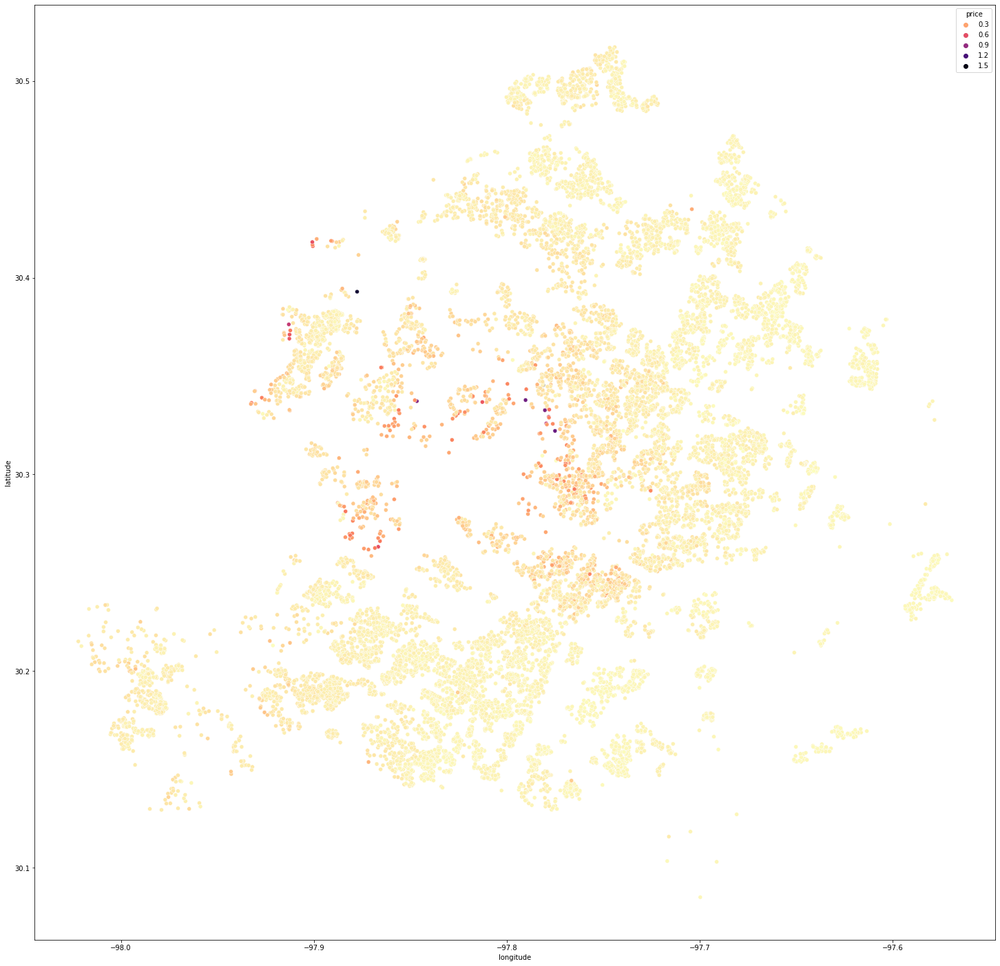

In [ ]:
# plotting latitude and longitude as a visual scatter plot to look for location-based outliers

plt.figure(figsize=(25,25))

sns.scatterplot(data=df, x="longitude", y="latitude", hue="price", palette="magma_r");

Using latitude and longitude, we make a visual map of the Austin area that lets us see any map outliers. There don't appear to be any zones that are well outside of the Austin area, except for just a few down in the lower SE area. So we might plan to cut off our latitude just above 30.1.

This visualization suggests that location is very important to home price. We'll check that out more directly.

In [ ]:
# drop latitidue below 30.12 to remove the few outliers in the SE
df.drop(df[df['latitude']<30.12].index , inplace=True)

In [ ]:
# looking for outliers in the percentiles

df.describe()

,price,zpid,zipcode,latitude,longitude,propertyTaxRate,garageSpaces,parkingSpaces,yearBuilt,orig_price,numPriceChanges,latest_salemonth,latest_saleyear,numOfPhotos,numOfAccessibilityFeatures,numOfAppliances,numOfParkingFeatures,numOfPatioAndPorchFeatures,numOfSecurityFeatures,numOfWaterfrontFeatures,numOfWindowFeatures,numOfCommunityFeatures,lotSizeSqFt,livingAreaSqFt,numOfPrimarySchools,numOfElementarySchools,numOfMiddleSchools,numOfHighSchools,avgSchoolDistance,avgSchoolRating,avgSchoolSize,MedianStudentsPerTeacher,numOfBathrooms,numOfBedrooms,numOfStories,time_series
count,1.488000e+04,1.488000e+04,14880.000000,14880.000000,14880.000000,14880.000000,14880.000000,14880.000000,14880.000000,1.488000e+04,14880.000000,14880.000000,14880.000000,14880.000000,14880.000000,14880.000000,14880.000000,14880.000000,14880.000000,14880.000000,14880.000000,14880.000000,1.488000e+04,14880.000000,14880.000000,14880.000000,14880.000000,14880.000000,14880.000000,14880.000000,14880.000000,14880.000000,14880.000000,14880.000000,14880.000000,14880.000000
mean,5.710926e+05,1.043332e+08,78736.001075,30.291923,-97.778870,1.994194,1.228159,1.227554,1988.720228,5.119011e+05,3.032997,6.722043,2019.077151,30.830645,0.013239,3.490927,1.710081,0.667608,0.472446,0.002621,0.210753,0.011761,1.207274e+05,2205.497177,0.941062,0.048790,1.034946,0.977621,1.838871,5.792622,1240.125134,14.868952,2.696704,3.441599,1.469422,6.277957
std,4.933980e+05,3.171262e+08,18.879984,0.097245,0.084904,0.053290,1.342097,1.342224,21.504783,4.413982e+05,2.481883,3.137916,0.813532,21.187673,0.181175,1.868605,0.778832,0.983225,0.828483,0.059625,0.490729,0.113874,1.237193e+07,1368.133002,0.235802,0.234267,0.260259,0.292564,1.065639,1.859791,325.654819,1.743026,1.025875,0.811953,0.523915,3.137916
min,6.094000e+03,2.858495e+07,78617.000000,30.127161,-98.022057,1.980000,0.000000,0.000000,1905.000000,5.500000e+03,1.000000,1.000000,2018.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000e+02,300.000000,0.000000,0.000000,0.000000,0.000000,0.200000,2.333333,396.000000,10.000000,0.000000,0.000000,1.000000,1.000000
25%,3.445055e+05,2.941134e+07,78727.000000,30.202993,-97.838747,1.980000,0.000000,0.000000,1975.000000,3.090000e+05,1.000000,4.000000,2018.000000,20.000000,0.000000,2.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.534000e+03,1485.000000,1.000000,0.000000,1.000000,1.000000,1.100000,4.000000,983.000000,14.000000,2.000000,3.000000,1.000000,4.000000
50%,4.538920e+05,2.949518e+07,78739.000000,30.285250,-97.769810,1.980000,1.000000,1.000000,1993.000000,4.050000e+05,2.000000,7.000000,2019.000000,29.000000,0.000000,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.232000e+03,1976.000000,1.000000,0.000000,1.000000,1.000000,1.566667,6.000000,1298.000000,15.000000,3.000000,3.000000,1.000000,6.000000
75%,6.370388e+05,7.033871e+07,78749.000000,30.367340,-97.718283,1.980000,2.000000,2.000000,2006.000000,5.750000e+05,4.000000,9.000000,2020.000000,39.000000,0.000000,4.000000,2.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.089000e+04,2687.000000,1.000000,0.000000,1.000000,1.000000,2.266667,7.000000,1498.500000,16.000000,3.000000,4.000000,2.000000,9.000000
max,1.555613e+07,2.146313e+09,78759.000000,30.517174,-97.569504,2.210000,22.000000,22.000000,2020.000000,1.350000e+07,23.000000,12.000000,2021.000000,179.000000,8.000000,10.000000,6.000000,8.000000,6.000000,2.000000,4.000000,3.000000,1.508483e+09,109292.000000,2.000000,2.000000,3.000000,2.000000,9.000000,9.500000,1913.000000,19.000000,27.000000,20.000000,4.000000,12.000000


We see potential outliers in price, lotSizeSqFt, livingAreaSqFt, and numOfBathrooms, numOfBedrooms, garageSpaces, parkingSpaces.

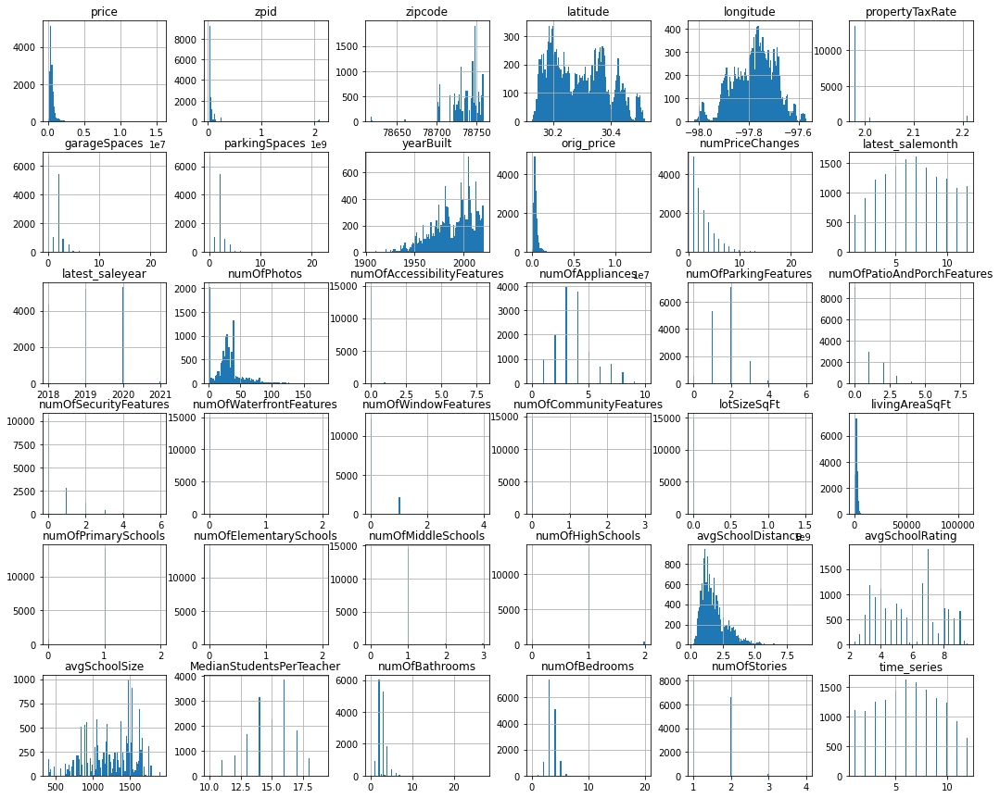

In [ ]:
# check how our histograms are looking
df.hist(figsize=(18,15), bins=100);


In [ ]:
#check what is going on with the lotSizeSqFt outliers by sorting descending
df.sort_values('lotSizeSqFt', ascending=False).head(5)

# This top listing is legitimate. But we have a problem here where condo and townhouse listings are using the
# size of the overall lot for their lot, and that isn't really accurate/representative
# We'll fix this in a little bit

,price,zpid,city,streetAddress,zipcode,description,latitude,longitude,propertyTaxRate,garageSpaces,hasAssociation,hasCooling,hasGarage,hasHeating,hasSpa,hasView,homeType,parkingSpaces,yearBuilt,orig_price,numPriceChanges,latest_saledate,latest_salemonth,latest_saleyear,latestPriceSource,numOfPhotos,numOfAccessibilityFeatures,numOfAppliances,numOfParkingFeatures,numOfPatioAndPorchFeatures,numOfSecurityFeatures,numOfWaterfrontFeatures,numOfWindowFeatures,numOfCommunityFeatures,lotSizeSqFt,livingAreaSqFt,numOfPrimarySchools,numOfElementarySchools,numOfMiddleSchools,numOfHighSchools,avgSchoolDistance,avgSchoolRating,avgSchoolSize,MedianStudentsPerTeacher,numOfBathrooms,numOfBedrooms,numOfStories,homeImage,time_series
14654,1941912.0,58297775,austin,3200 W 35th St,78703,Fabulous 4 Bed 4 Bath house on one of the larg...,30.314316,-97.768044,1.98,5,False,True,True,True,False,False,Single Family,5,1955,1650000.0,3,2020-02-20,2,2020,Broker Provided,23,0,8,2,2,1,0,0,0,1.508483e+09,3328.0,1,0,1,1,1.633333,7.000000,1298,16,4.0,4,2,58297775_ea7a00b4cbb5788f252f04fce1c9e84a-p_f.jpg,11
9244,190324.0,62605548,austin,706 W 22nd St APT 306,78705,Leased for $1695 though 7/31/2020 - Unique gat...,30.285631,-97.745697,1.98,0,True,True,False,True,False,False,Condo,0,1982,179900.0,7,2019-10-15,10,2019,Agent Provided,16,0,4,0,0,0,0,0,0,3.415452e+07,728.0,1,0,1,1,1.533333,6.000000,1196,16,1.0,2,1,62605548_0b3873e5b78f01227ad3a038c06a6f13-p_f.jpg,3
11116,208577.0,145652991,austin,4319 Nitschke St,78723,**Subject to City of Austin SMART Housing and ...,30.294910,-97.698997,1.98,1,True,True,True,True,False,False,Townhouse,1,2016,187471.0,1,2020-06-29,6,2020,Agent Provided,26,0,3,2,0,1,0,1,0,2.617956e+07,815.0,1,0,1,1,2.166667,5.000000,966,15,2.0,2,2,145652991_0b5dacd57ed4126cdfdd8d563bb0c043-p_f...,7
2340,680880.0,124837778,austin,4304 Front Range Ln,78732,"4304 Front Range Ln, Austin, TX 78732 is a sin...",30.380476,-97.881027,1.98,2,True,True,True,True,False,True,Single Family,2,2014,569000.0,1,2019-03-29,3,2019,Agent Provided,33,0,4,2,0,0,0,0,0,8.712000e+06,3183.0,1,0,1,1,1.833333,8.333333,1476,17,3.0,4,2,124837778_99ba1046c98f724f8866c5cdc5afe169-p_f...,10
4635,1038012.0,202157510,austin,201 Charismatic Pl,78737,"201 Charismatic Pl, Austin, TX 78737 is a sing...",30.205276,-98.011406,2.01,3,True,True,True,True,True,False,Single Family,3,2015,999500.0,3,2019-11-08,11,2019,Broker Provided,1,0,4,2,0,0,0,0,0,8.581320e+06,4459.0,1,0,1,1,5.533333,6.666667,1132,16,6.0,5,2,202157510_b30ae95a57301eb1d73cb91350beef3a-p_f...,2


In [ ]:
#check what is going on with the livingAreaSqFt outliers by sorting ascending
df.sort_values('livingAreaSqFt', ascending=True).head(5)

# just tiny houses I guess ?

,price,zpid,city,streetAddress,zipcode,description,latitude,longitude,propertyTaxRate,garageSpaces,hasAssociation,hasCooling,hasGarage,hasHeating,hasSpa,hasView,homeType,parkingSpaces,yearBuilt,orig_price,numPriceChanges,latest_saledate,latest_salemonth,latest_saleyear,latestPriceSource,numOfPhotos,numOfAccessibilityFeatures,numOfAppliances,numOfParkingFeatures,numOfPatioAndPorchFeatures,numOfSecurityFeatures,numOfWaterfrontFeatures,numOfWindowFeatures,numOfCommunityFeatures,lotSizeSqFt,livingAreaSqFt,numOfPrimarySchools,numOfElementarySchools,numOfMiddleSchools,numOfHighSchools,avgSchoolDistance,avgSchoolRating,avgSchoolSize,MedianStudentsPerTeacher,numOfBathrooms,numOfBedrooms,numOfStories,homeImage,time_series
1170,960658.0,94641643,austin,3003 Brass Buttons Trl,78734,Lake Austin Waterfront lot in Apache Shores! O...,30.381195,-97.915985,1.98,0,True,True,False,True,False,False,Single Family,0,2012,850000.0,4,2018-07-21,7,2018,Agent Provided,49,0,1,0,0,0,0,0,0,23522.4,300.0,1,0,1,1,2.633333,7.000000,1715,16,2.0,2,1,94641643_9764275995e6a1d64eb9ee3383342db7-p_f.jpg,6
3518,155233.0,29420819,austin,404 Primrose St,78753,"404 Primrose St, Austin, TX 78753 is a single ...",30.350330,-97.697739,1.98,0,False,False,False,False,False,False,Single Family,0,1945,139000.0,1,2019-07-02,7,2019,Broker Provided,1,0,0,0,0,0,0,0,0,11761.2,306.0,1,0,1,1,0.933333,2.666667,932,14,1.0,1,1,29420819_eacd95953733cf1630001311c5c3d8dd-p_f.jpg,6
13314,185140.0,29330022,austin,1405 Hartford Rd APT 202,78703,Old West Austin Efficiency. Close to metro/UT ...,30.284014,-97.762421,1.98,0,True,True,False,True,False,False,Condo,0,1972,175000.0,1,2019-10-01,10,2019,Agent Provided,16,0,3,0,1,1,0,1,0,657.0,378.0,1,0,1,1,0.600000,6.000000,1189,16,1.0,0,1,29330022_325baca18f3fe6664c210987fd58ed8a-p_f.jpg,3
10118,527915.0,29385318,austin,2202 E 10th St,78702,Great opportunity to build on your lot in high...,30.264668,-97.717590,1.98,2,True,True,True,True,False,True,Condo,2,2019,499000.0,4,2019-10-22,10,2019,Broker Provided,29,0,3,2,0,1,0,0,0,5837.0,450.0,1,0,1,1,1.033333,5.000000,697,11,1.0,1,2,29385318_8cb1b5c135c1df01c788a481e928d68c-p_f.jpg,3
9213,164541.0,145658912,austin,1011 W 23rd St APT 103,78705,Very desirable location for UT students only 5...,30.287077,-97.748085,1.98,1,True,True,True,True,False,True,Condo,1,1972,151500.0,5,2018-09-29,9,2018,Agent Provided,1,0,5,2,0,0,0,0,0,815.0,450.0,1,0,1,1,1.400000,6.000000,1196,16,1.0,1,1,145658912_71f342a92115aa75aac958c41f6e7543-p_f...,4


In [ ]:
#check what is going on with the livingAreaSqFt outliers by sorting descending
df.sort_values('livingAreaSqFt', ascending=False).head(5)

,price,zpid,city,streetAddress,zipcode,description,latitude,longitude,propertyTaxRate,garageSpaces,hasAssociation,hasCooling,hasGarage,hasHeating,hasSpa,hasView,homeType,parkingSpaces,yearBuilt,orig_price,numPriceChanges,latest_saledate,latest_salemonth,latest_saleyear,latestPriceSource,numOfPhotos,numOfAccessibilityFeatures,numOfAppliances,numOfParkingFeatures,numOfPatioAndPorchFeatures,numOfSecurityFeatures,numOfWaterfrontFeatures,numOfWindowFeatures,numOfCommunityFeatures,lotSizeSqFt,livingAreaSqFt,numOfPrimarySchools,numOfElementarySchools,numOfMiddleSchools,numOfHighSchools,avgSchoolDistance,avgSchoolRating,avgSchoolSize,MedianStudentsPerTeacher,numOfBathrooms,numOfBedrooms,numOfStories,homeImage,time_series
705,401434.0,70330356,austin,201 Marly Way,78733,Level building site with great canyon views an...,30.323517,-97.861473,1.98,0,True,True,False,True,False,False,Single Family,0,2012,385000.0,2,2018-11-12,11,2018,Agent Provided,1,0,0,1,0,0,0,0,0,109335.6,109292.0,0,1,3,0,3.233333,8.000000,1373,14,0.0,5,2,70330356_streetviewsize1025x768location30.3235...,2
2557,1011842.0,64523076,austin,9704 Saugus Ln,78733,"New Construction, EANES Schools, 4bed 3 bath, ...",30.345898,-97.859985,1.98,0,True,True,False,True,False,False,Single Family,0,2018,829000.0,1,2018-03-08,3,2018,Agent Provided,1,0,1,1,0,0,0,0,0,103237.2,29440.0,0,1,3,0,4.300000,8.000000,1373,14,0.0,1,2,64523076_streetviewlocation9704SaugusLn2CAusti...,10
2316,14076258.0,125904370,austin,12400 Cedar St,78732,12400 Cedar Street - Villa Del Lago is a uniqu...,30.392859,-97.877609,1.98,5,False,True,True,True,False,True,Single Family,5,2016,13500000.0,2,2018-11-28,11,2018,Agent Provided,13,0,0,2,0,0,0,0,0,710899.2,15394.0,1,0,1,1,2.200000,8.333333,1476,17,13.0,6,1,125904370_a200adec53a31c17278601026747d1ae-p_f...,2
5328,3172530.0,29327226,austin,3509 Lost Creek Blvd,78735,"*$6,762,377 is Tax Value - Set in exclusive Ba...",30.272158,-97.856033,1.98,7,True,True,True,True,True,False,Single Family,7,2003,2700000.0,4,2018-05-20,5,2018,Agent Provided,39,0,5,3,0,0,0,0,0,138956.4,14091.0,1,0,1,1,4.300000,5.666667,1332,16,10.0,6,3,29327226_811cfb134911b60830174fb4700afc39-p_f.jpg,8
375,5484816.0,89551873,austin,14800 Flat Top Ranch Rd,78732,GRACIOUS LUXURY ON LAKE AUSTIN\r\nThis award-w...,30.368996,-97.912720,1.98,6,True,True,True,True,True,True,Single Family,6,2014,4950000.0,6,2018-08-17,8,2018,Agent Provided,34,0,3,2,0,0,0,0,0,116740.8,13731.0,1,0,1,1,2.733333,8.333333,1476,17,10.0,5,2,89551873_acca4b6361693761e8631145233ffd75-p_f.jpg,5


In [ ]:
# we're dropping the top two listings here. One is a lot, and the other is clearly mistaken.
df.drop(index=[705, 2557], inplace=True)

In [ ]:
#check what is going on with the numOfBathrooms outliers by sorting descending
df.sort_values('numOfBathrooms', ascending=False).head(5)

,price,zpid,city,streetAddress,zipcode,description,latitude,longitude,propertyTaxRate,garageSpaces,hasAssociation,hasCooling,hasGarage,hasHeating,hasSpa,hasView,homeType,parkingSpaces,yearBuilt,orig_price,numPriceChanges,latest_saledate,latest_salemonth,latest_saleyear,latestPriceSource,numOfPhotos,numOfAccessibilityFeatures,numOfAppliances,numOfParkingFeatures,numOfPatioAndPorchFeatures,numOfSecurityFeatures,numOfWaterfrontFeatures,numOfWindowFeatures,numOfCommunityFeatures,lotSizeSqFt,livingAreaSqFt,numOfPrimarySchools,numOfElementarySchools,numOfMiddleSchools,numOfHighSchools,avgSchoolDistance,avgSchoolRating,avgSchoolSize,MedianStudentsPerTeacher,numOfBathrooms,numOfBedrooms,numOfStories,homeImage,time_series
2838,780946.0,111972888,austin,4212 Far West Blvd,78731,Well-maintained home in highly desirable North...,30.361406,-97.769707,1.98,2,False,True,True,True,False,False,Single Family,2,1967,745000.0,1,2020-10-20,10,2020,Agent Provided,46,0,4,2,0,0,0,0,0,10236.0,2137.0,1,0,1,1,0.933333,7.000000,1483,16,27.0,4,1,111972888_a88e572d95e496b1b5d9a591800497c4-p_f...,3
2316,14076258.0,125904370,austin,12400 Cedar St,78732,12400 Cedar Street - Villa Del Lago is a uniqu...,30.392859,-97.877609,1.98,5,False,True,True,True,False,True,Single Family,5,2016,13500000.0,2,2018-11-28,11,2018,Agent Provided,13,0,0,2,0,0,0,0,0,710899.2,15394.0,1,0,1,1,2.200000,8.333333,1476,17,13.0,6,1,125904370_a200adec53a31c17278601026747d1ae-p_f...,2
184,4165941.0,124843021,austin,13115 Perryton Dr,78732,This highly custom home sits on a well-establi...,30.338959,-97.926979,1.98,4,True,True,True,True,True,True,Single Family,4,2014,4100000.0,3,2020-12-23,12,2020,Broker Provided,149,0,8,3,0,0,0,0,0,172497.6,9866.0,1,0,1,1,3.433333,8.333333,1533,17,10.0,6,2,124843021_38aeda802d6cf001f7befec5a053d009-p_f...,1
5328,3172530.0,29327226,austin,3509 Lost Creek Blvd,78735,"*$6,762,377 is Tax Value - Set in exclusive Ba...",30.272158,-97.856033,1.98,7,True,True,True,True,True,False,Single Family,7,2003,2700000.0,4,2018-05-20,5,2018,Agent Provided,39,0,5,3,0,0,0,0,0,138956.4,14091.0,1,0,1,1,4.300000,5.666667,1332,16,10.0,6,3,29327226_811cfb134911b60830174fb4700afc39-p_f.jpg,8
375,5484816.0,89551873,austin,14800 Flat Top Ranch Rd,78732,GRACIOUS LUXURY ON LAKE AUSTIN\r\nThis award-w...,30.368996,-97.912720,1.98,6,True,True,True,True,True,True,Single Family,6,2014,4950000.0,6,2018-08-17,8,2018,Agent Provided,34,0,3,2,0,0,0,0,0,116740.8,13731.0,1,0,1,1,2.733333,8.333333,1476,17,10.0,5,2,89551873_acca4b6361693761e8631145233ffd75-p_f.jpg,5


In [ ]:
# I'm going to say this top listing has 2.5 bathrooms not 27. That is clearly a typo.
df.loc[df.index==2838, 'numOfBathrooms'] = 2.5

In [ ]:
#check what is going on with the numOfBathrooms outliers by sorting ascending
df.sort_values('numOfBathrooms', ascending=True).head(5)

,price,zpid,city,streetAddress,zipcode,description,latitude,longitude,propertyTaxRate,garageSpaces,hasAssociation,hasCooling,hasGarage,hasHeating,hasSpa,hasView,homeType,parkingSpaces,yearBuilt,orig_price,numPriceChanges,latest_saledate,latest_salemonth,latest_saleyear,latestPriceSource,numOfPhotos,numOfAccessibilityFeatures,numOfAppliances,numOfParkingFeatures,numOfPatioAndPorchFeatures,numOfSecurityFeatures,numOfWaterfrontFeatures,numOfWindowFeatures,numOfCommunityFeatures,lotSizeSqFt,livingAreaSqFt,numOfPrimarySchools,numOfElementarySchools,numOfMiddleSchools,numOfHighSchools,avgSchoolDistance,avgSchoolRating,avgSchoolSize,MedianStudentsPerTeacher,numOfBathrooms,numOfBedrooms,numOfStories,homeImage,time_series
6252,1010014.0,29327134,austin,2005 Real Catorce,78746,"2005 Real Catorce, Austin, TX 78746 is a singl...",30.269354,-97.818771,1.98,0,True,True,False,True,False,False,Single Family,0,1999,949000.0,4,2018-10-30,10,2018,Agent Provided,1,0,4,1,0,0,0,0,0,14810.4,5187.0,0,1,1,0,0.600000,9.500000,1630,14,0.0,5,2,29327134_streetviewsize1025x768location30.2693...,3
6646,493682.0,29503854,austin,8604 Oak Ledge Dr,78748,"8604 Oak Ledge Dr, Austin, TX 78748 is a singl...",30.188589,-97.823662,1.98,0,False,True,False,True,False,False,Single Family,0,1971,450000.0,1,2019-08-07,8,2019,Broker Provided,1,0,4,2,2,0,0,2,0,17424.0,1660.0,1,0,1,1,2.266667,5.666667,1537,16,0.0,0,1,29503854_streetviewlocation8604OakLedgeDr2CAus...,5
1842,995762.0,94642666,austin,10640 Senna Hills Dr,78733,Wow! Reduced! First time on the market! Move i...,30.312716,-97.900482,1.98,2,True,True,True,True,False,True,Single Family,2,2011,895000.0,5,2020-06-24,6,2020,Agent Provided,35,0,3,2,0,0,0,0,0,12196.8,3809.0,0,1,3,0,2.766667,9.333333,1360,14,0.0,0,2,94642666_5d6e752fd9e13c6e7241c68017dd5319-p_f.jpg,7
2223,959366.0,58299964,austin,5138 Mansfield View Ct,78732,"5138 Mansfield View Ct, Austin, TX 78732 is a ...",30.390335,-97.882072,1.98,2,True,True,True,True,False,True,Single Family,2,2000,850000.0,9,2020-05-03,5,2020,,6,0,3,3,1,2,0,2,0,17424.0,3423.0,1,0,1,1,2.100000,8.333333,1476,17,0.0,4,2,58299964_747f1d8b4915b675bca16aff4f6bcc2d-p_f.jpg,8
12993,472902.0,58315415,austin,4712 Chesney Ridge Dr,78749,"This Austin two-story offers a fireplace, an o...",30.197540,-97.862419,1.98,2,True,True,True,True,False,False,Single Family,2,2000,447000.0,12,2019-10-29,10,2019,Broker Provided,1,0,4,2,1,1,0,0,0,7187.0,3271.0,1,0,1,1,1.600000,7.333333,1576,16,0.0,5,2,58315415_streetviewlocation4712ChesneyRidgeDr2...,3


In [ ]:
# most listings with 0 bathrooms also have 0 bedrooms. This is clearly wrong, but I'm not going to guess if there are no bedrooms.
# I will impute typical bathroom count per bedroom count based on year built
# then drop any remaining listings with 0 bathrooms and 0 bedrooms

df.loc[(df['numOfBathrooms']==0) & (df['numOfBedrooms']>0) & (df['yearBuilt'] > 1989), 'numOfBathrooms'] = 2
df.loc[(df['numOfBathrooms']==0) & (df['numOfBedrooms']>0) & (df['yearBuilt'] <= 1989), 'numOfBathrooms'] = 1
df.loc[(df['numOfBathrooms']==0) & (df['numOfBedrooms']>=3) & (df['yearBuilt'] > 1989), 'numOfBathrooms'] = 2.5
df.loc[(df['numOfBathrooms']==0) & (df['numOfBedrooms']>=3) & (df['yearBuilt'] <= 1989), 'numOfBathrooms'] = 2

df.drop(df[df['numOfBathrooms']==0].index, inplace=True)
df.drop(df[df['numOfBedrooms']==0].index, inplace=True)

In [ ]:
#check what is going on with the numOfBedrooms outliers by sorting descending
df.sort_values('numOfBedrooms', ascending=False).head(5)

,price,zpid,city,streetAddress,zipcode,description,latitude,longitude,propertyTaxRate,garageSpaces,hasAssociation,hasCooling,hasGarage,hasHeating,hasSpa,hasView,homeType,parkingSpaces,yearBuilt,orig_price,numPriceChanges,latest_saledate,latest_salemonth,latest_saleyear,latestPriceSource,numOfPhotos,numOfAccessibilityFeatures,numOfAppliances,numOfParkingFeatures,numOfPatioAndPorchFeatures,numOfSecurityFeatures,numOfWaterfrontFeatures,numOfWindowFeatures,numOfCommunityFeatures,lotSizeSqFt,livingAreaSqFt,numOfPrimarySchools,numOfElementarySchools,numOfMiddleSchools,numOfHighSchools,avgSchoolDistance,avgSchoolRating,avgSchoolSize,MedianStudentsPerTeacher,numOfBathrooms,numOfBedrooms,numOfStories,homeImage,time_series
8597,180525.0,2094498207,austin,4902 Duval Rd R2 #R2,78727,"Lovely convenient condo, with a private wooded...",30.415489,-97.737213,1.98,0,True,True,False,True,False,True,Condo,0,1985,174900.0,2,2020-11-13,11,2020,Agent Provided,25,0,4,1,0,0,0,0,0,5227.0,916.0,1,0,1,1,2.400000,6.000000,1474,15,2.0,20,1,2094498207_76320ecfd86161cc1d91c46c95c1afcf-p_...,2
8531,702270.0,58306332,austin,3906 Hawkshead Dr,78727,Enjoy this home across from The Domain! Comple...,30.416149,-97.722801,1.98,2,False,True,True,True,False,False,Single Family,2,2006,650000.0,1,2020-08-05,8,2020,Agent Provided,36,0,2,2,2,3,0,1,0,9191.0,4712.0,1,0,1,1,2.666667,6.666667,1486,15,4.0,8,2,58306332_c0963729ec7bd42164615c02d9825a50-p_f.jpg,5
14435,898270.0,29401385,austin,4302 Avenue G APT C,78751,Charming 3-unit multifamily property built by ...,30.305981,-97.728012,1.98,0,False,False,False,True,False,False,Single Family,0,1925,750000.0,1,2018-04-27,4,2018,Agent Provided,15,0,0,1,0,0,0,0,0,5662.0,2340.0,1,0,1,1,1.433333,7.333333,1142,15,4.0,7,2,29401385_19535e7778c048c5b703ef78b6b40c77-p_f.jpg,9
13910,3949387.0,29322655,austin,1608 S 2nd St,78704,Modern luxury by Joseph Design Build with prim...,30.249325,-97.757095,1.98,5,False,True,True,True,False,False,Single Family,5,2020,3450000.0,4,2020-04-30,4,2020,Agent Provided,37,0,4,3,0,0,0,0,0,12632.4,4956.0,1,0,1,1,0.666667,5.000000,889,13,7.0,7,2,29322655_46672f649e50f848a746a7b0421c2ed2-p_f.jpg,9
9314,696494.0,29384319,austin,1310 E 2nd St,78702,"Contact owner for showing, day before advance ...",30.260422,-97.730194,1.98,2,False,True,True,True,False,True,Single Family,2,1915,599995.0,7,2020-03-17,3,2020,Agent Provided,1,0,3,3,0,0,0,0,0,6577.0,2403.0,1,0,1,1,1.100000,4.666667,992,14,7.0,7,2,29384319_8c7c32099fdfd1895eb36b68cbad62c9-p_f.jpg,10


In [ ]:
# That condo is supposed to have 2 bathrooms, not 20.
df.loc[df.index==8597, 'numOfBedrooms'] = 2

In [ ]:
#check what is going on with the garageSpaces outliers by sorting descending
df.sort_values('garageSpaces', ascending=False).head(10)

,price,zpid,city,streetAddress,zipcode,description,latitude,longitude,propertyTaxRate,garageSpaces,hasAssociation,hasCooling,hasGarage,hasHeating,hasSpa,hasView,homeType,parkingSpaces,yearBuilt,orig_price,numPriceChanges,latest_saledate,latest_salemonth,latest_saleyear,latestPriceSource,numOfPhotos,numOfAccessibilityFeatures,numOfAppliances,numOfParkingFeatures,numOfPatioAndPorchFeatures,numOfSecurityFeatures,numOfWaterfrontFeatures,numOfWindowFeatures,numOfCommunityFeatures,lotSizeSqFt,livingAreaSqFt,numOfPrimarySchools,numOfElementarySchools,numOfMiddleSchools,numOfHighSchools,avgSchoolDistance,avgSchoolRating,avgSchoolSize,MedianStudentsPerTeacher,numOfBathrooms,numOfBedrooms,numOfStories,homeImage,time_series
6885,411834.0,145656156,austin,705 Mc Queen St #34,78745,Beautiful 2-story home located in highly sough...,30.189331,-97.792809,1.98,22,True,True,True,True,False,True,Condo,22,2016,399000.0,1,2020-11-15,11,2020,Agent Provided,30,0,2,2,3,0,0,0,0,6621.0,2080.0,1,0,1,1,0.866667,3.333333,926,13,3.0,4,1,145656156_7eaa8fc35c2a80099dae663115c8e34a-p_f...,2
4533,1006838.0,28587235,austin,13100 Rooster Springs Rd,78737,Enjoy country living with the convenience of t...,30.204746,-97.991356,2.01,20,False,True,True,True,False,True,Single Family,20,2018,824900.0,2,2018-03-08,3,2018,Agent Provided,3,0,7,3,0,0,0,0,0,337590.0,4004.0,1,0,1,1,6.766667,6.666667,1132,16,5.0,4,1,28587235_5a6a7b48074e944ed02a280f06dfaa43-p_f.jpg,10
4777,1620652.0,29331364,austin,3301 Barton Creek Blvd,78735,Privately gated Barton Creek estate on 1.58 Ac...,30.283585,-97.875526,1.98,12,True,True,True,True,True,False,Single Family,12,1991,1595000.0,15,2020-12-04,12,2020,"Compass RE Texas, LLC",72,0,3,3,2,1,0,0,0,68824.8,5170.0,1,0,1,1,5.366667,5.666667,1332,16,5.0,4,2,29331364_70cdb457329d7f8822ea9907032f8716-p_f.jpg,1
9240,3892150.0,29396074,austin,908 Keith Ln,78705,Keith Lane is has our homes strategically plac...,30.291706,-97.725502,1.98,12,False,True,True,True,False,False,Single Family,12,2003,3400000.0,1,2020-04-01,4,2020,Agent Provided,20,0,5,4,0,0,0,0,0,20908.8,3075.0,1,0,1,1,1.233333,7.333333,1142,15,3.0,6,2,29396074_b1521d52623a64343f61e3093ea83446-p_f.jpg,9
6805,575963.0,29502805,austin,7600 Elm Forest Rd,78745,Gorgeous 3/2 home owner remodel on almost 2/3 ...,30.190971,-97.800804,1.98,12,False,True,True,True,False,False,Single Family,12,1960,525000.0,7,2019-08-19,8,2019,Agent Provided,33,0,8,1,2,2,0,2,0,27007.2,1806.0,1,0,1,1,1.566667,3.333333,1409,14,2.0,3,1,29502805_59509f778dbf2a2d4ff966ffd89f01f6-p_f.jpg,5
6985,333275.0,29494837,austin,6907 Cherrydale Dr,78745,Beautifully remodeled home in HOT 78745!! This...,30.200857,-97.803902,1.98,12,False,True,True,True,False,True,Single Family,12,1972,328000.0,3,2020-12-28,12,2020,Agent Provided,46,0,4,2,1,0,0,0,0,7927.0,880.0,1,0,1,1,1.233333,4.000000,840,13,1.0,3,1,29494837_df65b7181d2b1d4749672b8b95f365b0-p_f.jpg,1
11108,516083.0,29409917,austin,1405 Berkshire Dr,78723,Beautifully renovated single story mid-century...,30.317060,-97.697220,1.98,12,False,True,True,True,False,True,Single Family,12,1955,500000.0,2,2020-11-10,11,2020,Agent Provided,29,0,3,2,2,0,0,0,0,7797.0,1209.0,1,0,1,1,0.700000,3.000000,849,14,2.0,3,1,29409917_884d8f325332b7b38909b77751e3b189-p_f.jpg,2
14875,511468.0,29415933,austin,5804 Bullard Dr,78757,"5804 Bullard Dr, Austin, TX 78757 is a single ...",30.336634,-97.750031,1.98,10,False,True,True,True,False,True,Single Family,10,1958,450000.0,5,2019-06-21,6,2019,Broker Provided,1,0,8,4,0,0,0,0,0,10018.0,2226.0,1,0,1,1,0.800000,6.666667,1153,16,2.0,3,1,29415933_c80565e4044d0ae688fb802478bf44a3-p_f.jpg,7
6230,2009247.0,29327172,austin,1814 Randolph Ridge Trl,78746,"Stunning home in Eanes, minutes from downtow...",30.272011,-97.821548,1.98,10,True,True,True,True,True,True,Single Family,10,1999,1850000.0,5,2018-09-13,9,2018,Agent Provided,39,0,6,3,0,0,0,0,0,30056.4,5792.0,0,1,1,0,0.550000,9.500000,1630,14,5.0,5,2,29327172_651d5bacae22a9c8f693720e0047ac3f-p_f.jpg,4
3459,533443.0,2942385

In [ ]:
# a bunch of these garage spaces are definitely just bogus numbers. I'm going to force change a lot of them to numbers that make sense
df.loc[(df['garageSpaces'] > 3) & (df['price'] < 1000000) & (df['homeType'] == 'Single Family'), 'garageSpaces'] = 3
df.loc[(df['garageSpaces'] > 5) & (df['price'] > 1000000)& (df['homeType'] == 'Single Family'), 'garageSpaces'] = 4
df.loc[df.index==6885, 'garageSpaces'] = 2

In [ ]:
#check what is going on with the parkingSpaces outliers by sorting descending
df.sort_values('parkingSpaces', ascending=False).head(5)

,price,zpid,city,streetAddress,zipcode,description,latitude,longitude,propertyTaxRate,garageSpaces,hasAssociation,hasCooling,hasGarage,hasHeating,hasSpa,hasView,homeType,parkingSpaces,yearBuilt,orig_price,numPriceChanges,latest_saledate,latest_salemonth,latest_saleyear,latestPriceSource,numOfPhotos,numOfAccessibilityFeatures,numOfAppliances,numOfParkingFeatures,numOfPatioAndPorchFeatures,numOfSecurityFeatures,numOfWaterfrontFeatures,numOfWindowFeatures,numOfCommunityFeatures,lotSizeSqFt,livingAreaSqFt,numOfPrimarySchools,numOfElementarySchools,numOfMiddleSchools,numOfHighSchools,avgSchoolDistance,avgSchoolRating,avgSchoolSize,MedianStudentsPerTeacher,numOfBathrooms,numOfBedrooms,numOfStories,homeImage,time_series
6885,411834.0,145656156,austin,705 Mc Queen St #34,78745,Beautiful 2-story home located in highly sough...,30.189331,-97.792809,1.98,2,True,True,True,True,False,True,Condo,22,2016,399000.0,1,2020-11-15,11,2020,Agent Provided,30,0,2,2,3,0,0,0,0,6621.0,2080.0,1,0,1,1,0.866667,3.333333,926,13,3.0,4,1,145656156_7eaa8fc35c2a80099dae663115c8e34a-p_f...,2
4533,1006838.0,28587235,austin,13100 Rooster Springs Rd,78737,Enjoy country living with the convenience of t...,30.204746,-97.991356,2.01,4,False,True,True,True,False,True,Single Family,20,2018,824900.0,2,2018-03-08,3,2018,Agent Provided,3,0,7,3,0,0,0,0,0,337590.0,4004.0,1,0,1,1,6.766667,6.666667,1132,16,5.0,4,1,28587235_5a6a7b48074e944ed02a280f06dfaa43-p_f.jpg,10
6985,333275.0,29494837,austin,6907 Cherrydale Dr,78745,Beautifully remodeled home in HOT 78745!! This...,30.200857,-97.803902,1.98,3,False,True,True,True,False,True,Single Family,12,1972,328000.0,3,2020-12-28,12,2020,Agent Provided,46,0,4,2,1,0,0,0,0,7927.0,880.0,1,0,1,1,1.233333,4.000000,840,13,1.0,3,1,29494837_df65b7181d2b1d4749672b8b95f365b0-p_f.jpg,1
6805,575963.0,29502805,austin,7600 Elm Forest Rd,78745,Gorgeous 3/2 home owner remodel on almost 2/3 ...,30.190971,-97.800804,1.98,3,False,True,True,True,False,False,Single Family,12,1960,525000.0,7,2019-08-19,8,2019,Agent Provided,33,0,8,1,2,2,0,2,0,27007.2,1806.0,1,0,1,1,1.566667,3.333333,1409,14,2.0,3,1,29502805_59509f778dbf2a2d4ff966ffd89f01f6-p_f.jpg,5
11108,516083.0,29409917,austin,1405 Berkshire Dr,78723,Beautifully renovated single story mid-century...,30.317060,-97.697220,1.98,3,False,True,True,True,False,True,Single Family,12,1955,500000.0,2,2020-11-10,11,2020,Agent Provided,29,0,3,2,2,0,0,0,0,7797.0,1209.0,1,0,1,1,0.700000,3.000000,849,14,2.0,3,1,29409917_884d8f325332b7b38909b77751e3b189-p_f.jpg,2


In [ ]:
# We are going to do the same forced conversions on parking spaces
df.loc[(df['parkingSpaces'] > 3) & (df['price'] < 1000000 & (df['homeType'] == 'Single Family')), 'parkingSpaces'] = 3
df.loc[(df['parkingSpaces'] > 5) & (df['price'] > 1000000& (df['homeType'] == 'Single Family')), 'parkingSpaces'] = 5
df.loc[df.index==6885, 'parkingSpaces'] = 2

df.sort_values('parkingSpaces', ascending=False).head(5)

,price,zpid,city,streetAddress,zipcode,description,latitude,longitude,propertyTaxRate,garageSpaces,hasAssociation,hasCooling,hasGarage,hasHeating,hasSpa,hasView,homeType,parkingSpaces,yearBuilt,orig_price,numPriceChanges,latest_saledate,latest_salemonth,latest_saleyear,latestPriceSource,numOfPhotos,numOfAccessibilityFeatures,numOfAppliances,numOfParkingFeatures,numOfPatioAndPorchFeatures,numOfSecurityFeatures,numOfWaterfrontFeatures,numOfWindowFeatures,numOfCommunityFeatures,lotSizeSqFt,livingAreaSqFt,numOfPrimarySchools,numOfElementarySchools,numOfMiddleSchools,numOfHighSchools,avgSchoolDistance,avgSchoolRating,avgSchoolSize,MedianStudentsPerTeacher,numOfBathrooms,numOfBedrooms,numOfStories,homeImage,time_series
6114,1233761.0,29326930,austin,1308 Brians Meadow Cv,78746,Award winning EANES ISD. Cedar Creek Elementar...,30.269625,-97.803162,1.98,4,False,True,True,True,False,True,Single Family,5,1995,1050000.0,1,2018-05-26,5,2018,Agent Provided,52,0,7,3,0,0,0,0,0,13939.2,3372.0,0,1,1,0,0.500000,9.000000,1600,14,4.0,4,2,29326930_9506188a2c6051f61bcaea75903f604d-p_f.jpg,8
5605,472308.0,29361586,austin,12712 Mcnelly Trl,78732,Home is in immaculate condition with loads of ...,30.381527,-97.891388,1.98,3,True,True,True,True,False,True,Single Family,5,1993,394700.0,3,2019-03-07,3,2019,Broker Provided,1,0,4,2,0,0,0,0,0,8276.0,2200.0,1,0,1,1,2.000000,8.333333,1476,17,3.0,4,2,29361586_7c62fada59b1e7abb7beb9fecb77273b-p_f.jpg,10
7073,302792.0,29488557,austin,6507 Krollton Dr,78745,Beautiful one story home in Cherry Creek. Two...,30.208628,-97.810165,1.98,3,False,True,True,True,True,False,Single Family,5,1973,298000.0,9,2020-12-16,12,2020,Broker Provided,35,0,4,2,1,2,0,0,0,6403.0,1342.0,1,0,1,1,0.900000,4.000000,840,13,2.0,3,1,29488557_537a82c1e5f460520c56e5c3d95e423c-p_f.jpg,1
4987,293174.0,70332724,austin,10901 Strand St,78748,South Austin Gem! This beautifully updated 4 b...,30.167471,-97.843445,1.98,3,True,True,True,True,False,False,Single Family,5,2006,253500.0,4,2019-05-21,5,2019,Agent Provided,32,0,7,4,0,1,0,1,0,9888.0,2388.0,1,0,1,1,1.833333,5.000000,1450,15,2.0,4,1,70332724_4780625f504619e0b31f7edbe40495f4-p_f.jpg,8
3558,345824.0,29425216,austin,8519 Parkfield Dr,78758,Soak up the sunshine in this remodeled 3BR/4BA...,30.358917,-97.711327,1.98,3,False,True,True,True,True,False,Single Family,5,1965,289000.0,4,2019-03-05,3,2019,Agent Provided,24,0,8,3,0,0,0,0,0,9331.0,2326.0,1,0,1,1,0.533333,4.000000,1028,14,4.0,4,2,29425216_933115fdc6dd2d36480a59bf04a286fc-p_f.jpg,10


In [ ]:
df['city'].value_counts()

austin              14718
del valle              85
pflugerville           36
driftwood              12
manor                   5
dripping springs        4
manchaca                3
west lake hills         2
road                    1
Name: city, dtype: int64

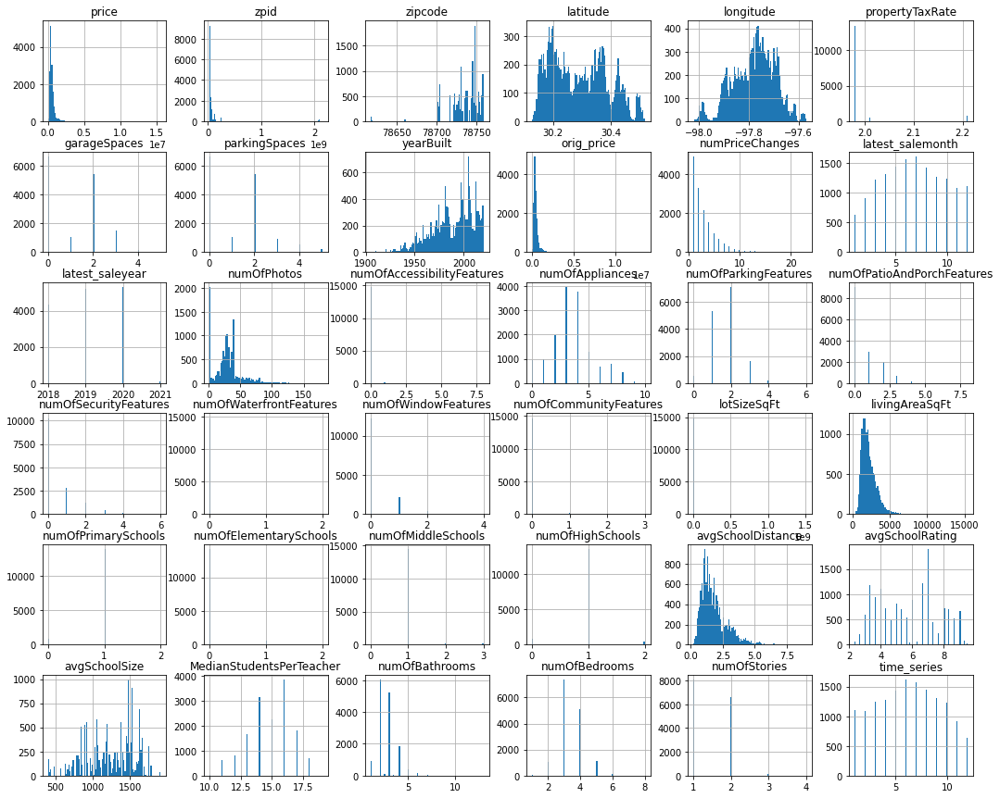

In [ ]:
# check how our histograms are looking for our columns that seem to have outliers

df.hist(figsize=(18,15), bins=100);

For the square footage variables, I ultimately concluded that extremely large houses and lots are so seriously under-represented in the dataset that we won't be able to reliably predict on them anyway and they are better left off.

Ultimately I opt to remove via IQR on these items.

In order to prevent a lot of data loss in this way, I kept IQR range of 1.6 instead of the standard 1.5

In [ ]:
# A lot of our variables are not normally shaped, so we can't reliably remove outliers via standard deviation.
# We will use IQR to remove our outliers with the following function

def iqr_outliers(column):
    """return the lower range and upper range for the data based on IQR*1.6"""
    Q1,Q3 = np.percentile(column , [25,75])
    iqr = Q3 - Q1
    lower_range = Q1 - (1.6 * iqr)
    upper_range = Q3 + (1.6 * iqr)
    return lower_range,upper_range

In [ ]:
# determing our IQR for price, lot size, sq footage and longitude
lotlower,lotupper = iqr_outliers(df.lotSizeSqFt)
sqftlower, sqftupper = iqr_outliers(df.livingAreaSqFt)

# dropping the things outside of our lower and upper range
df.drop(df[ (df.lotSizeSqFt > lotupper) | (df.lotSizeSqFt < lotlower) ].index , inplace=True)
df.drop(df[ (df.livingAreaSqFt > sqftupper) | (df.livingAreaSqFt < sqftlower) ].index , inplace=True)

In [ ]:
# We'll imputing the median lot size into condo and townhouse listings that are over-listed for lot size square feet

df.loc[(df['homeType']=='Condo') | (df['homeType']=='Townhouse') & (df['livingAreaSqFt']<1200) & (df['lotSizeSqFt']>8000), 'lotSizeSqFt'] = df['lotSizeSqFt'].median()

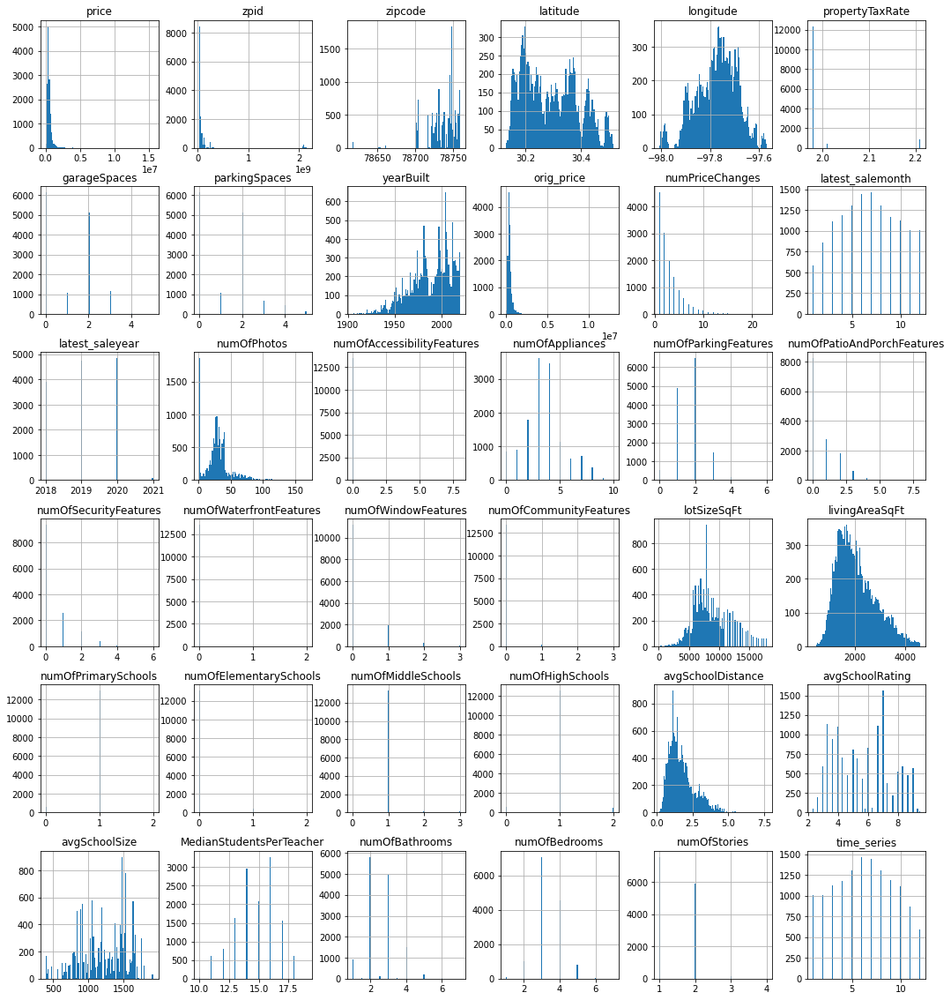

In [ ]:
# check how our histograms are looking

df.hist(figsize=(18,20), bins=100);

# much better

#### Manually locating price outliers

In [ ]:
# we're using the median house value for a zip code to determine the zip code's sort, so we can visualize the zip code

# group our dataframe by zipcode on median home price, sorted ascending.
zipsorted = pd.DataFrame(df.groupby('zipcode')['price'].median().sort_values(ascending=True))

# divide our dataframe into groups with entries per group as specified above,
# and assign this number to a new column
zipsorted['rank'] = np.divmod(np.arange(len(zipsorted)), 1)[0]+1

# function that looks up a segment that a data entry belongs to
def make_group(x, frame, column):
    y = frame.loc[(frame.index == x)][column]
    z = np.array(y)
    z[0]
    return z[0]

# make a new column on our dataframe. Look up each zip entry's group, and append to the column.
df['zip_rank'] = df['zipcode'].apply(lambda x: make_group(x, zipsorted, 'rank'))

# apply the median home price per zip code to the data frame
df['median_zip'] = df['zipcode'].apply(lambda x: round(df.loc[df['zipcode']==x]['price'].median(), 0))

''

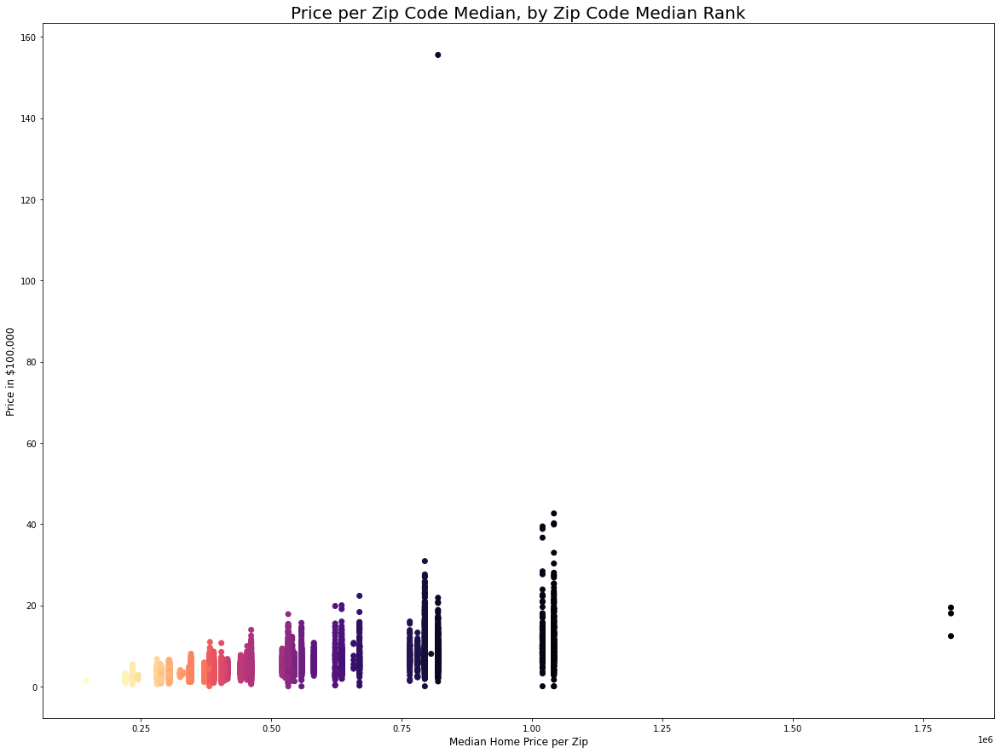

In [ ]:
# visualize zip code as a color function

fig, ax = plt.subplots(figsize=(20, 15))

ax.scatter(df['median_zip'], df['price'] /100000, c=df['zip_rank'], cmap='magma_r')

ax.set_xlabel('Median Home Price per Zip', fontsize=12)
ax.set_ylabel('Price in $100,000', fontsize=12)
ax.set_title('Price per Zip Code Median, by Zip Code Median Rank', fontsize=20)
;

We can see that a few of our zip codes are very high value. There are also some clear outliers in this data set. We'll take care of removing those, and then come back to this visual again later after we've done some cleanup.

''

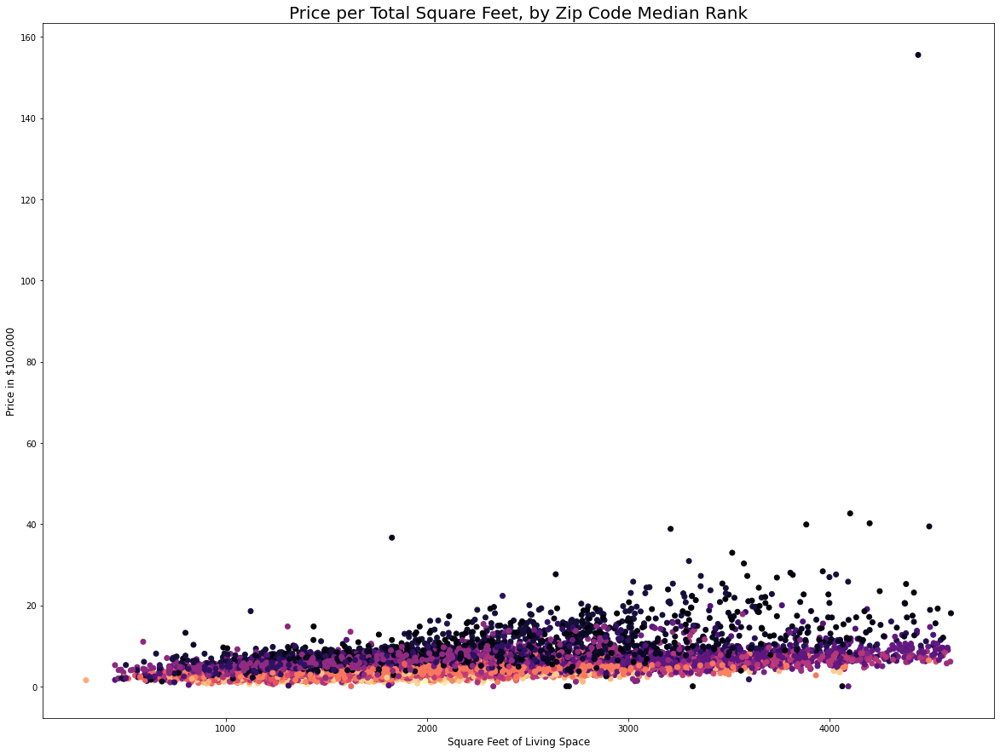

In [ ]:
# visualize zip code as a color function, on a plot of price per square footage

fig, ax = plt.subplots(figsize=(20, 15))

ax.scatter(df['livingAreaSqFt'], df['price'] /100000, c=df['zip_rank'], cmap='magma_r')

ax.set_xlabel('Square Feet of Living Space', fontsize=12)
ax.set_ylabel('Price in $100,000', fontsize=12)
ax.set_title('Price per Total Square Feet, by Zip Code Median Rank', fontsize=20)
;

In [ ]:
# we're dropping the values above 3 million, and the 3 entries from zipcode 78734
df.drop(df[df['price']>3000000].index, inplace=True)
df.drop(df[df['zipcode']==78734].index, inplace=True)

# check price stats by zip code and displaying top 30 zip codes by mean
find_zip_outliers = df.groupby('zipcode')['price'].describe()
find_zip_outliers.sort_values('mean', ascending=False).head(35)
# very suspicious values in many zip codes for min

,count,mean,std,min,25%,50%,75%,max
zipcode,,,,,,,,
78703,262.0,1.131643e+06,534468.432885,7666.0,744354.25,1028931.0,1452630.25,2803681.0
78746,114.0,1.115630e+06,491398.252409,8027.0,807784.75,1003793.5,1316520.25,2838458.0
78704,666.0,9.273607e+05,480752.220309,7741.0,598974.75,794092.0,1132878.75,2761945.0
78731,420.0,8.348040e+05,335816.364393,126382.0,617115.50,817683.5,984791.50,2187517.0
78738,1.0,8.060850e+05,NaN,806085.0,806085.00,806085.0,806085.00,806085.0
78730,106.0,7.891463e+05,253355.681670,139416.0,627736.50,765292.0,920347.25,1602650.0
78756,133.0,7.604781e+05,363554.170002,22745.0,511784.00,668810.0,963823.00,2235383.0
78733,114.0,7.500451e+05,211673.142505,228079.0,613901.75,780109.0,887561.75,1329652.0
78701,7.0,7.159867e+05,260604.517143,439037.0,514681.50,657534.0,904084.50,1077804.0


In [ ]:
# anything under 75k is no way a legitimate market value sale.
# anything in this range is certainly a inter-family sale,
# non-commercial, some weird sale type.
# We are dropping all of those.
df.drop(df.loc[(df['price'] <= 75000)].index, axis=0, inplace=True)

In [ ]:
# Eliminating outliers on a per-zipcode basis using our IQR 1.6

zipcodes = df['zipcode'].unique()

for i in zipcodes:
    lower, upper = iqr_outliers(df[df['zipcode'] == i]['price'])
    df.drop(df[ ( (df.price > upper) & (df['zipcode'] == i) ) | ( (df.price < lower)  & (df['zipcode'] == i) ) ].index , inplace=True)


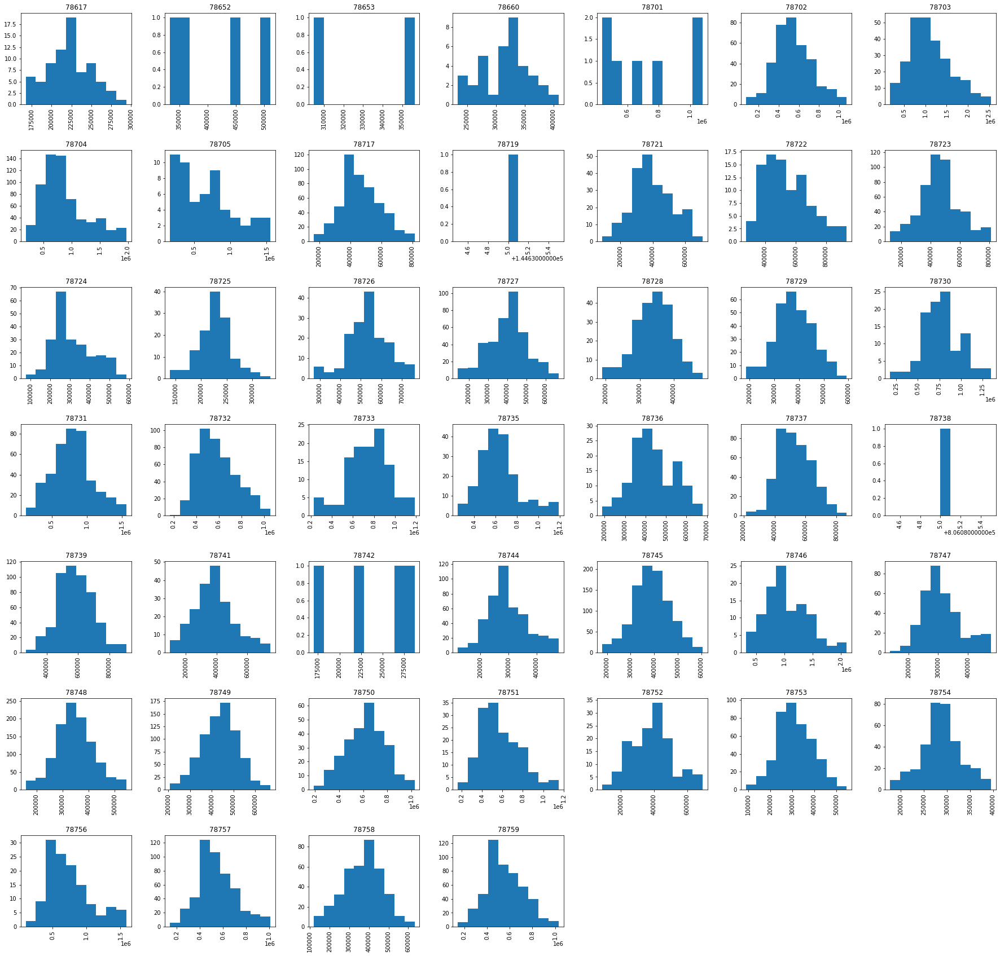

In [ ]:
#We can check our price per zip code histograms.

df['price'].hist(by=df['zipcode'], figsize=(30,30));

# some of our zip codes don't have enough sales to give us information

In [ ]:
# We're going to drop our few zip codes where we have only a couple of data points

df.drop( df.loc[(df['zipcode']==78653) | (df['zipcode']==78738) | (df['zipcode']==78719)| (df['zipcode']==78652)| (df['zipcode']==78742)].index, axis=0, inplace=True)

In [ ]:
# redo our zip code medians and rankings after outlier removal

# apply the median home price per zip code to the data frame again after outlier removal
df['median_zip'] = df['zipcode'].apply(lambda x: round(df.loc[df['zipcode']==x]['price'].median(), 0))

# group our dataframe by zipcode on median home price, sorted ascending. We want to bin like-medians together.
zipsorted = pd.DataFrame(df.groupby('zipcode')['price'].median().sort_values(ascending=True))

# divide our dataframe into groups with entries per group as specified above,
# and assign this number to a new column
zipsorted['rank'] = np.divmod(np.arange(len(zipsorted)), 1)[0]+1

# make a new column on our dataframe. Look up each zip entry's group, and append to the column.
df['zip_rank'] = df['zipcode'].apply(lambda x: make_group(x, zipsorted, 'rank'))

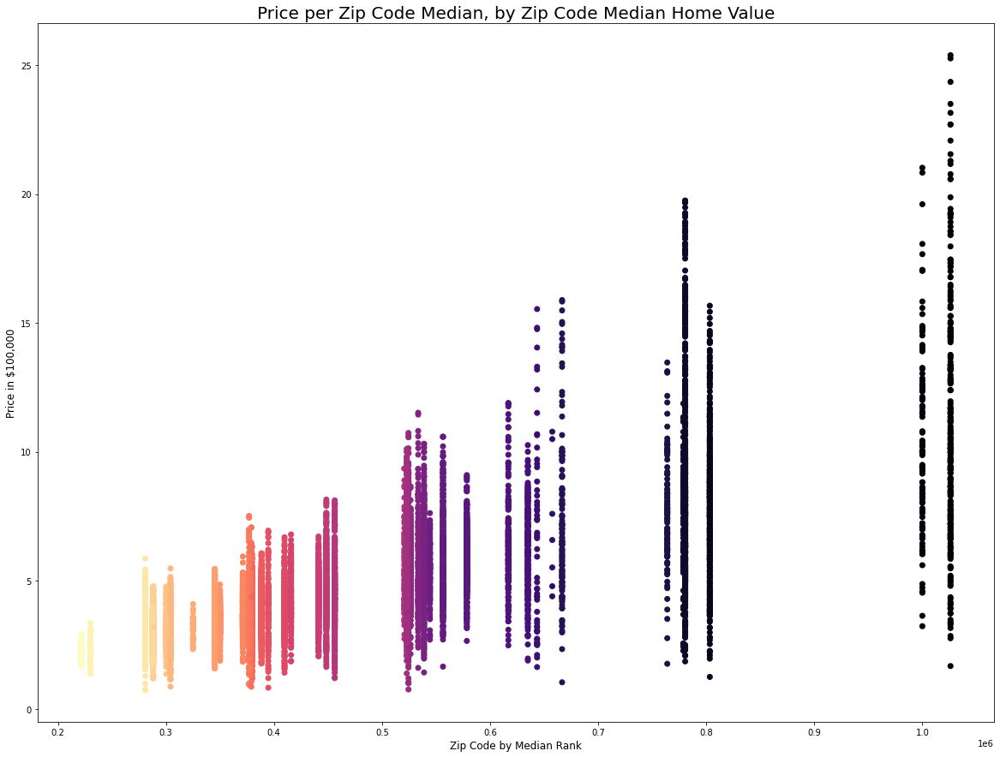

In [ ]:
# re-visualize zip code as a color function, using the median zip after outlier removal.

fig, ax = plt.subplots(figsize=(20, 15))

ax.scatter(df['median_zip'], df['price'] /100000, c=df['zip_rank'], cmap='magma_r')

ax.set_xlabel('Zip Code by Median Rank', fontsize=12)
ax.set_ylabel('Price in $100,000', fontsize=12)
ax.set_title('Price per Zip Code Median, by Zip Code Median Home Value', fontsize=20);

# save visualization to png
#plt.savefig('images/zip_prices.png')

In [ ]:
# apply the median price per square foot per zip code to the data frame
df['pr_sqft'] = df.apply(lambda x: round( (x['price'] / x['livingAreaSqFt'] ), 0), axis=1 )

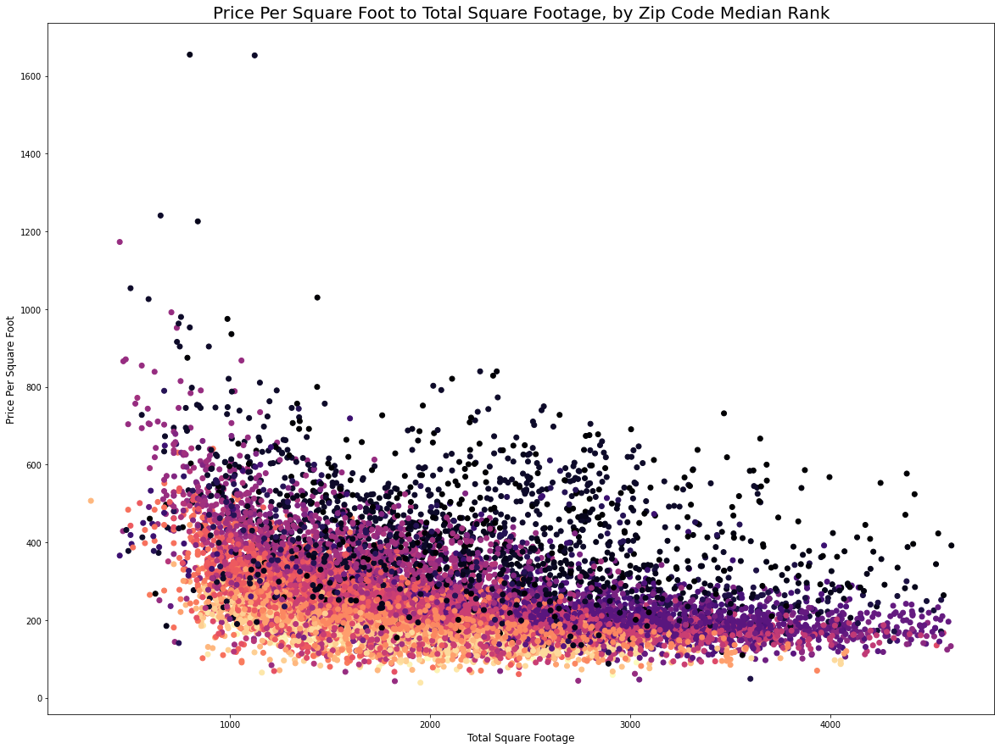

In [ ]:
fig, ax = plt.subplots(figsize=(20, 15))

ax.scatter(df['livingAreaSqFt'], df['pr_sqft'], c=df['zip_rank'], cmap='magma_r')

ax.set_xlabel('Total Square Footage', fontsize=12)
ax.set_ylabel('Price Per Square Foot', fontsize=12)
ax.set_title('Price Per Square Foot to Total Square Footage, by Zip Code Median Rank', fontsize=20);

# save visualization to png
#plt.savefig('images/zip_prices.png')

In [ ]:
#dropping irrationally high pr/sqft
df.drop(df[df['pr_sqft']>1000].index, inplace=True)

''

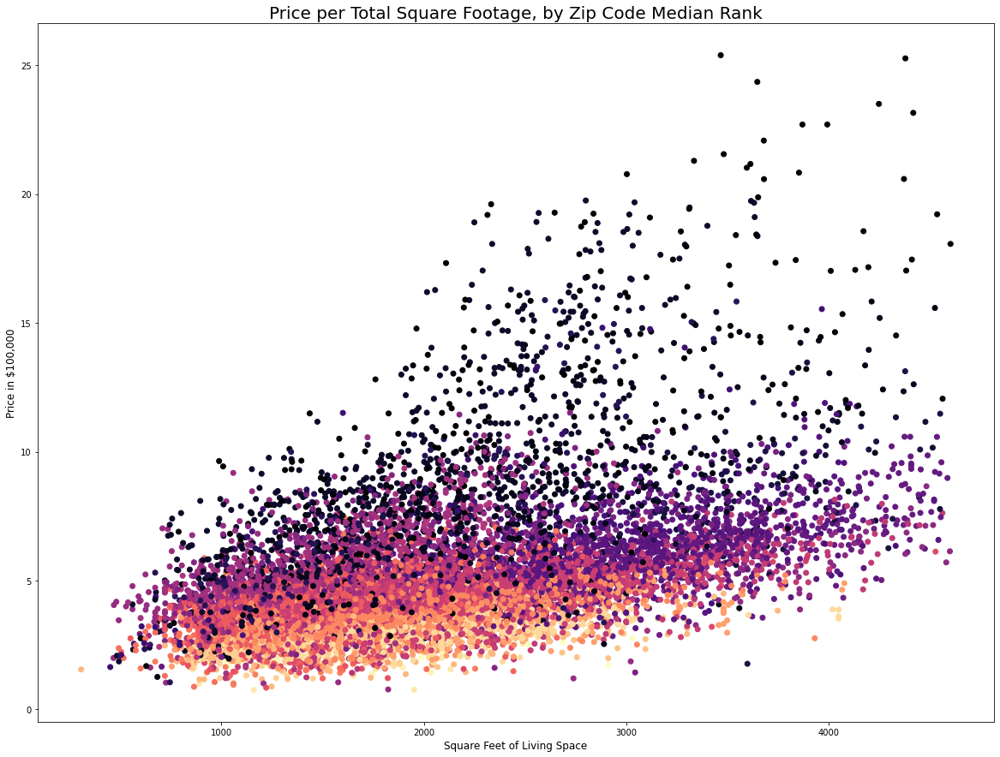

In [ ]:
# visualize zip code as a color function, on a plot of price per square footage

fig, ax = plt.subplots(figsize=(20, 15))

ax.scatter(df['livingAreaSqFt'], df['price'] /100000, c=df['zip_rank'], cmap='magma_r')

ax.set_xlabel('Square Feet of Living Space', fontsize=12)
ax.set_ylabel('Price in $100,000', fontsize=12)
ax.set_title('Price per Total Square Footage, by Zip Code Median Rank', fontsize=20)
;

In [ ]:
low_zips = df.loc[df['median_zip']<df['price'].mean()]
high_zips = df.loc[df['median_zip']>=df['price'].mean()]

''

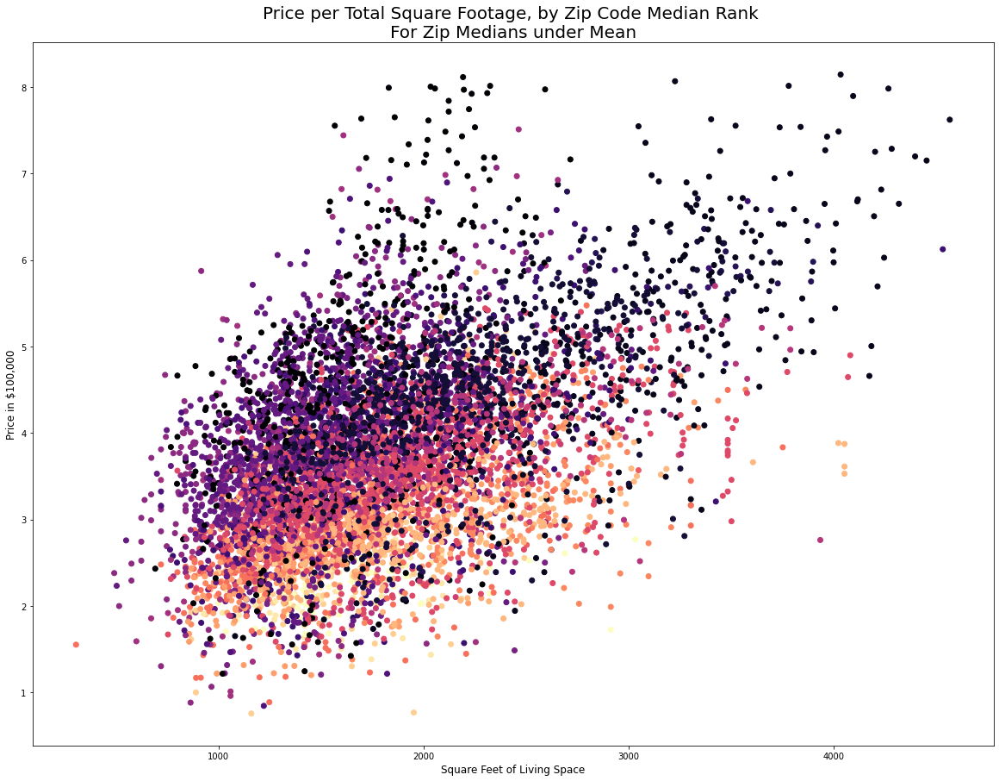

In [ ]:
# visualize zip code as a color function, on a plot of price per square footage

fig, ax = plt.subplots(figsize=(20, 15))

ax.scatter(low_zips['livingAreaSqFt'], low_zips['price'] /100000, c=low_zips['zip_rank'], cmap='magma_r')

ax.set_xlabel('Square Feet of Living Space', fontsize=12)
ax.set_ylabel('Price in $100,000', fontsize=12)
ax.set_title('Price per Total Square Footage, by Zip Code Median Rank \nFor Zip Medians under Mean', fontsize=20)
;

''

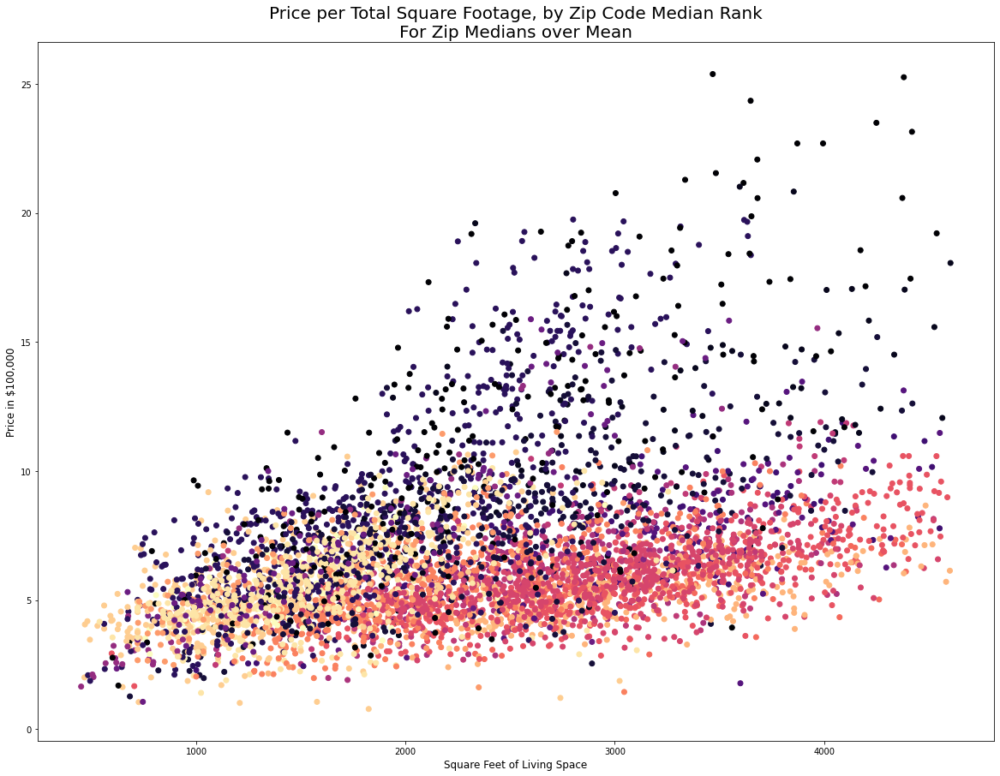

In [ ]:
# visualize zip code as a color function, on a plot of price per square footage

fig, ax = plt.subplots(figsize=(20, 15))

ax.scatter(high_zips['livingAreaSqFt'], high_zips['price'] /100000, c=high_zips['zip_rank'], cmap='magma_r')

ax.set_xlabel('Square Feet of Living Space', fontsize=12)
ax.set_ylabel('Price in $100,000', fontsize=12)
ax.set_title('Price per Total Square Footage, by Zip Code Median Rank\nFor Zip Medians over Mean', fontsize=20)
;

Here's a fun way to see the improvements to our data quality after we clean outliers! A much deeper color map.

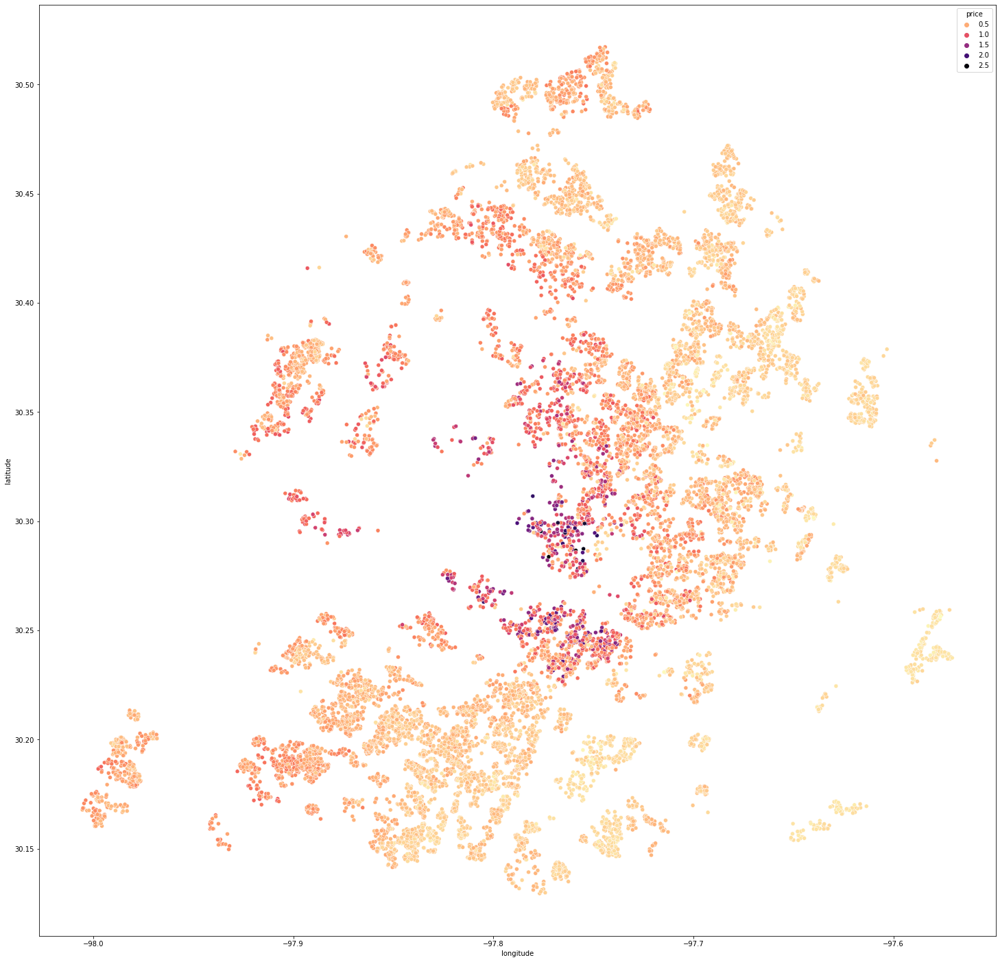

In [ ]:
# plotting latitude and longitude as a visual scatter plot. The improved color map actually visually demonstrates
# the removal of extreme price outliers.

plt.figure(figsize=(25,25))

sns.scatterplot(data=df, x="longitude", y="latitude", hue="price", palette="magma_r");

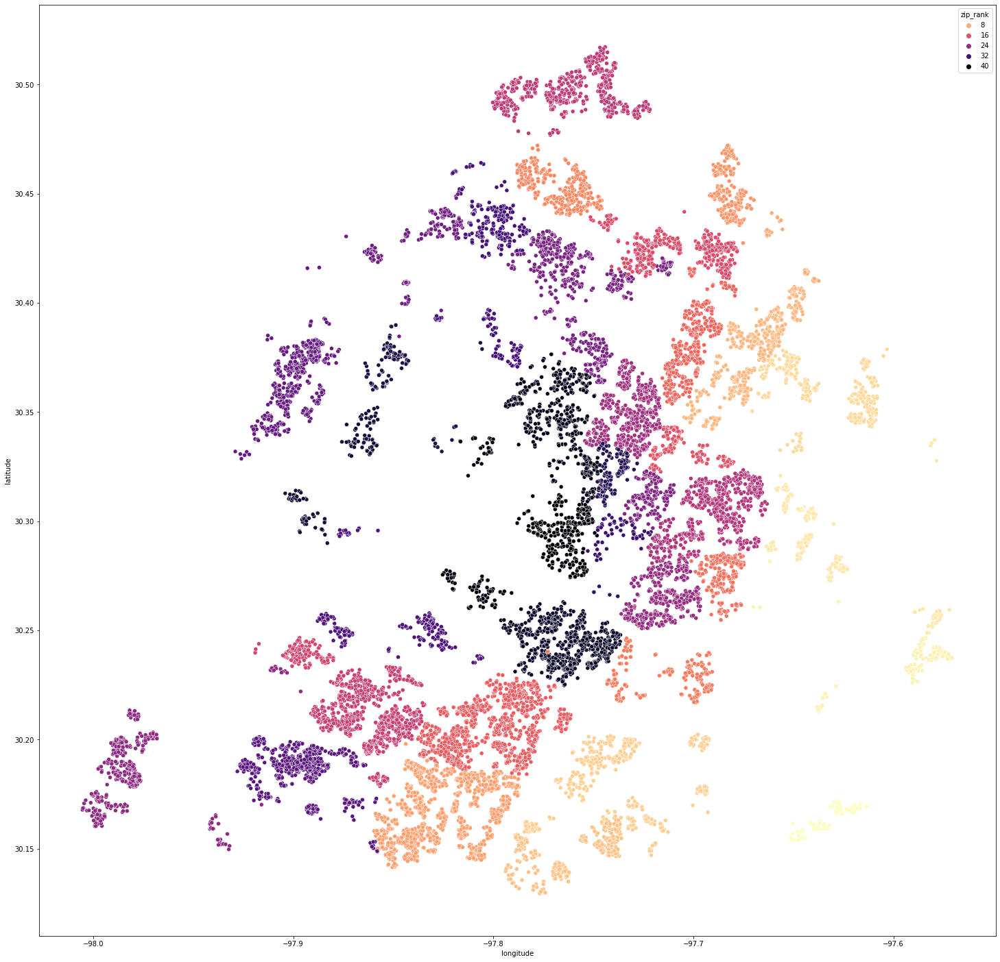

In [ ]:
# we can also map our zip codes in this way.

plt.figure(figsize=(25,25))

sns.scatterplot(data=df, x="longitude", y="latitude", hue="zip_rank", palette="magma_r");

### Missing Data

In [ ]:
# look for nulls

df.isna().sum()

# no missing data. impressive!

price                         0
zpid                          0
city                          0
streetAddress                 0
zipcode                       0
description                   0
latitude                      0
longitude                     0
propertyTaxRate               0
garageSpaces                  0
hasAssociation                0
hasCooling                    0
hasGarage                     0
hasHeating                    0
hasSpa                        0
hasView                       0
homeType                      0
parkingSpaces                 0
yearBuilt                     0
orig_price                    0
numPriceChanges               0
latest_saledate               0
latest_salemonth              0
latest_saleyear               0
latestPriceSource             0
numOfPhotos                   0
numOfAccessibilityFeatures    0
numOfAppliances               0
numOfParkingFeatures          0
numOfPatioAndPorchFeatures    0
numOfSecurityFeatures         0
numOfWat

In [ ]:
# check data types

df.dtypes

# data types all look correct

price                         float64
zpid                            int64
city                           object
streetAddress                  object
zipcode                         int64
description                    object
latitude                      float64
longitude                     float64
propertyTaxRate               float64
garageSpaces                    int64
hasAssociation                   bool
hasCooling                       bool
hasGarage                        bool
hasHeating                       bool
hasSpa                           bool
hasView                          bool
homeType                       object
parkingSpaces                   int64
yearBuilt                       int64
orig_price                    float64
numPriceChanges                 int64
latest_saledate                object
latest_salemonth                int64
latest_saleyear                 int64
latestPriceSource              object
numOfPhotos                     int64
numOfAccessi

### Binary Data

In [ ]:
# we're going to convert some of our ordinal features to binary 0/1
convert_to_bool = ['numOfAccessibilityFeatures', 'numOfAppliances', 'numOfParkingFeatures', 'numOfPatioAndPorchFeatures', 'numOfSecurityFeatures', 'numOfWaterfrontFeatures', 'numOfWindowFeatures', 'numOfCommunityFeatures']

df_convert_to_bool = df[convert_to_bool]
df_convert_to_bool.describe()

,numOfAccessibilityFeatures,numOfAppliances,numOfParkingFeatures,numOfPatioAndPorchFeatures,numOfSecurityFeatures,numOfWaterfrontFeatures,numOfWindowFeatures,numOfCommunityFeatures
count,13112.000000,13112.000000,13112.000000,13112.000000,13112.000000,13112.000000,13112.000000,13112.000000
mean,0.013270,3.474680,1.694097,0.651388,0.465909,0.001144,0.203935,0.011440
std,0.185611,1.848499,0.777321,0.961921,0.819578,0.035990,0.478719,0.111939
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,2.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,4.000000,2.000000,1.000000,1.000000,0.000000,0.000000,0.000000
max,8.000000,10.000000,6.000000,8.000000,6.000000,2.000000,3.000000,3.000000


In [ ]:
# Any element that has no features by the 50th percentile is getting converted to a binary

# change all non-null values > 0 in those columns to 1
df.loc[df['numOfAccessibilityFeatures'] > 0, 'numOfAccessibilityFeatures'] = 1
df.loc[df['numOfPatioAndPorchFeatures'] > 0, 'numOfPatioAndPorchFeatures'] = 1
df.loc[df['numOfSecurityFeatures'] > 0, 'numOfSecurityFeatures'] = 1
df.loc[df['numOfWaterfrontFeatures'] > 0, 'numOfWaterfrontFeatures'] = 1
df.loc[df['numOfWindowFeatures'] > 0, 'numOfWindowFeatures'] = 1
df.loc[df['numOfCommunityFeatures'] > 0, 'numOfCommunityFeatures'] = 1

# now anything that is not a 1 becomes a 0
df.loc[df['numOfAccessibilityFeatures']!= 1, 'numOfAccessibilityFeatures'] = 0
df.loc[df['numOfPatioAndPorchFeatures'] != 1, 'numOfPatioAndPorchFeatures'] = 0
df.loc[df['numOfSecurityFeatures'] != 1, 'numOfSecurityFeatures'] = 0
df.loc[df['numOfWaterfrontFeatures'] != 1, 'numOfWaterfrontFeatures'] = 0
df.loc[df['numOfWindowFeatures'] != 1, 'numOfWindowFeatures'] = 0
df.loc[df['numOfCommunityFeatures'] != 1, 'numOfCommunityFeatures'] = 0

# rename to reflect binary
df.rename(columns={'numOfAccessibilityFeatures' : 'accessibility', 'numOfPatioAndPorchFeatures' : 'patioporch', 'numOfSecurityFeatures': 'security',
                  'numOfWaterfrontFeatures': 'waterfront', 'numOfWindowFeatures' : 'windowfeatures', 'numOfCommunityFeatures' : 'community'}, inplace=True)

# convert original boolean columns to binary 0/1
boolean = ['hasAssociation', 'hasCooling', 'hasGarage', 'hasHeating', 'hasSpa', 'hasView']

for item in boolean:
    df[boolean] = df[boolean].astype(int)

### Study Target Variable

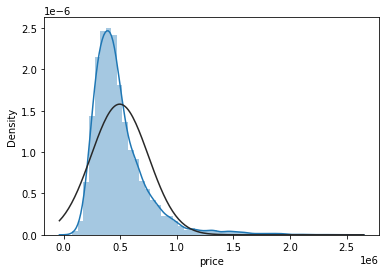

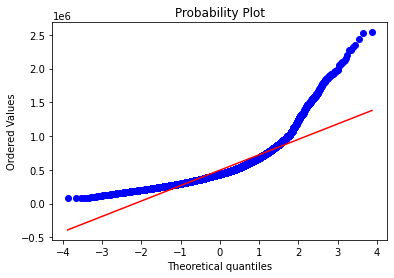

In [ ]:
#histogram and normal probability plot
sns.distplot(df['price'], fit=norm);
fig = plt.figure()

res = stats.probplot(df['price'], plot=plt)

# our sales price histogram is positively skewed and has a high peak
# Our QQ-plot shows that we have heavy tails with right skew

In [ ]:
#skewness and kurtosis
print("Skewness: %f" % df['price'].skew())
print("Kurtosis: %f" % df['price'].kurt())

# price is highly right skewed
# very positive kurtosis, indicating lots in the tails. We can see those tails in the right skew.

Skewness: 2.289715
Kurtosis: 8.229123


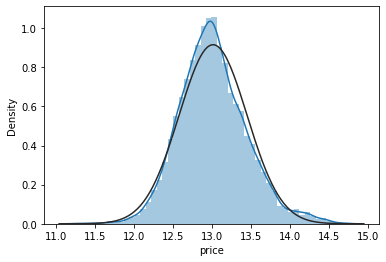

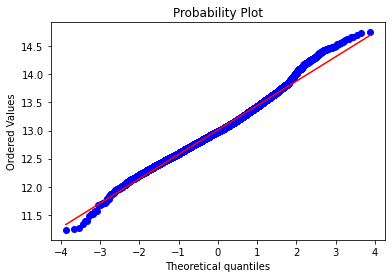

In [ ]:
# log transform our target price to improve normality of distribution
df_target_log = np.log(df['price'])

#histogram and normal probability plot
sns.distplot(df_target_log, fit=norm);
fig = plt.figure()
res = stats.probplot(df_target_log, plot=plt)

# Our target price is more normally distributed when log transformed, so we'll be doing that when we make our model


## Natural Language Processing

Our data set includes the listing text for each sale. We're going to use Natural Language Processing methods to extract relevant information from the listing text to boost the effectiveness of our model.

We're using spaCy and after basic package installation, we also need to download the english language pipeline.

In [ ]:
# Load spaCy with English language processor
nlp = spacy.load("en_core_web_sm")

# add real estate related stop words to default stop word list
nlp.Defaults.stop_words |= {"bedroom", "bathroom","bath","home", "austin", "tx", "pron", "sq", "ft", "rent", "mo",
                            "w", "bed", 'single', 'family', 'contain', 'st', 'dr', 'square', 'foot', 'room', 'square', 'feet',
                            '-pron-', 'garage', 'pflugerville', 'story', '1st', '1story', '2car', '2nd',
                            '2story', '3rd', '4th', '5th', '6th', '7th', '8th', '9th', '10th', 'street', 'avenue', 'ave',
                            'sac',

                           }

nlp.Defaults.stop_words.remove('is')
nlp.Defaults.stop_words.remove('as')

In [ ]:
# text processing functions for NLP

def preprocessor(word):
    '''processes an individual word to remove punctuation, numbers, special characters etc
    Returns processed word, or blank string if character removal resulted in no word
    ARGUMENT:
    word from line of text'''
    if type(word) == str:
        word = re.sub(r'[^\w\s]', '', word)
        word = re.sub('<[^>]*>', '', word)
        word = re.sub('<[0-9]*>', '', word)
        word = re.sub('[\W]+', '', word.lower())
        try:
            word = int(word)
            word = ''
            return word
        except:
            return word

def word_processor(line):
    '''Takes a line of text. Tokenizes each word of sentence.
    If token is stop word, goes to next token. If not stop word,
    calls preprocessor on word
    Returns processed words from line
    ARGUMENT:
    line of text'''

    tokens = nlp(line) # nlp reads line and creates tokens from each word
    words = [] # empty list of words for this line

    for token in tokens:
        if token.is_stop == False: # only continues if token is not stop word
            token_preprocessed = preprocessor(token.lemma_) # calls preprocessor on word
            if token_preprocessed != '': # only continues if returned word is not empty
                words.append(token_preprocessed) # appends word to list of words
    return(words) # return list of words for this line

def text_block_processor(text):
    '''Takes a block of text. Divides block into sentences with words lemmatized.
    Sends each sentence to word processor. Concatenates all words into one string
    If the string contains "zestimate", returns a DEFAULT listing note
    Otherwise returns string of cleaned and processed words from text block
    ARGUMENTS:
    block of text
    '''

    make_sentences = nlp(text)

    sentences_lemmata_list = [sentence.lemma_.lower() for sentence in make_sentences.sents]

    these_processed_sentences = ''


    for item in sentences_lemmata_list:
        words = word_processor(item)
        line = ' '.join(words)
        these_processed_sentences += (' ' + line)

    if 'zestimate' in these_processed_sentences:
        return 'DEFAULT'
    else:
        return these_processed_sentences

In [ ]:
# reset indices on original data frame before making a copy
df.reset_index(inplace=True)
df.drop('index', axis=1, inplace=True)

In [ ]:
# copy the description column to a new data frame for text processing
listing_text = pd.DataFrame(df['description'])

listing_text['sentences'] = None

listing_text['sentences'] = listing_text['description'].apply(lambda x: text_block_processor(x))

# drop the description field and save our listing_text to file so we don't have to run it again
listing_text.drop('description', axis=1, inplace=True)


In [ ]:
# append our listing text to our original data frame
df = pd.concat([df, listing_text], axis=1)

df

,price,zpid,city,streetAddress,zipcode,description,latitude,longitude,propertyTaxRate,garageSpaces,hasAssociation,hasCooling,hasGarage,hasHeating,hasSpa,hasView,homeType,parkingSpaces,yearBuilt,orig_price,numPriceChanges,latest_saledate,latest_salemonth,latest_saleyear,latestPriceSource,numOfPhotos,accessibility,numOfAppliances,numOfParkingFeatures,patioporch,security,waterfront,windowfeatures,community,lotSizeSqFt,livingAreaSqFt,numOfPrimarySchools,numOfElementarySchools,numOfMiddleSchools,numOfHighSchools,avgSchoolDistance,avgSchoolRating,avgSchoolSize,MedianStudentsPerTeacher,numOfBathrooms,numOfBedrooms,numOfStories,homeImage,time_series,zip_rank,median_zip,pr_sqft,sentences
0,328625.0,111373431,pflugerville,14424 Lake Victor Dr,78660,"14424 Lake Victor Dr, Pflugerville, TX 78660 i...",30.430632,-97.663078,1.98,2,1,1,1,1,0,0,Single Family,2,2012,305000.0,5,2019-09-02,9,2019,"Coldwell Banker United, Realtors - South Austin",39,0,5,2,1,1,0,1,0,6011.0,2601.0,1,0,1,1,1.266667,2.666667,1063,14,3.0,4,2,111373431_ffce26843283d3365c11d81b8e6bdc6f-p_f...,4,8,325080.0,126.0,DEFAULT
1,309233.0,120900430,pflugerville,1104 Strickling Dr,78660,Absolutely GORGEOUS 4 Bedroom home with 2 full...,30.432673,-97.661697,1.98,2,1,1,1,1,0,0,Single Family,2,2013,295000.0,1,2020-10-13,10,2020,Agent Provided,29,0,1,2,0,0,0,0,0,6185.0,1768.0,1,0,1,1,1.400000,2.666667,1063,14,2.0,4,1,120900430_8255c127be8dcf0a1a18b7563d987088-p_f...,3,8,325080.0,175.0,absolutely gorgeous locate tuck away communit...
2,286036.0,2084491383,pflugerville,1408 Fort Dessau Rd,78660,Under construction - estimated completion in A...,30.409748,-97.639771,1.98,0,1,1,0,1,0,0,Single Family,0,2018,256125.0,1,2019-07-31,7,2019,Agent Provided,2,0,4,1,0,1,0,0,0,7840.0,1478.0,0,2,1,1,1.200000,3.000000,1108,14,2.0,3,1,2084491383_a2ad649e1a7a098111dcea084a11c855-p_...,6,8,325080.0,194.0,construction estimate completion august pione...
3,265930.0,120901374,pflugerville,1025 Strickling Dr,78660,Absolutely darling one story home in charming ...,30.432112,-97.661659,1.98,2,1,1,1,1,0,0,Single Family,2,2013,240000.0,4,2018-08-08,8,2018,Agent Provided,9,0,0,2,0,0,0,0,0,6098.0,1678.0,1,0,1,1,1.400000,2.666667,1063,14,2.0,3,1,120901374_b469367a619da85b1f5ceb69b675d88e-p_f...,5,8,325080.0,158.0,absolutely darle charming book like lake nort...
4,255324.0,60134862,pflugerville,15005 Donna Jane Loop,78660,Brimming with appeal & warm livability! Sleek ...,30.437368,-97.656860,1.98,0,1,1,0,1,0,0,Single Family,0,2002,239900.0,3,2018-10-31,10,2018,Agent Provided,27,0,0,1,0,0,0,0,0,6708.0,2132.0,1,0,1,1,1.133333,4.000000,1223,14,3.0,3,2,60134862_b1a48a3df3f111e005bb913873e98ce2-p_f.jpg,3,8,325080.0,120.0,brim appeal warm livability sleek stylish mod...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13107,289006.0,29504086,austin,9013 Marsh Dr,78748,This 3 bedroom home is nestled among mature sh...,30.185915,-97.828415,1.98,2,0,1,1,1,1,0,Single Family,2,1983,280000.0,1,2020-11-24,11,2020,Agent Provided,63,0,3,2,1,1,0,0,0,8058.0,1420.0,1,0,1,1,2.133333,5.666667,1537,16,2.0,3,1,29504086_f55db59cbebad30d475f31e6aee0d020-p_f.jpg,2,9,345198.0,204.0,nestle mature shade tree locate establish nei...
13108,335307.0,29512934,austin,905 Silcantu Dr,78748,Not for rent!\n\nBeautiful one story home in T...,30.161997,-97.816345,1.98,3,0,1,1,1,0,1,Single Family,5,1986,330000.0,1,2020-12-10,12,2020,Agent Provided,49,0,3,2,1,0,0,0,0,6534.0,1234.0,1,0,1,1,0.900000,3.333333,1424,14,2.0,3,1,29512934_ff9b6eefa7e2eb4e9ef983da13a23098-p_f.jpg,1,9,345198.0,272.0,beautiful texas oaks huge covered patio neig...
13109,558845.0,241937773,austin,1413 Waterloo Shore Ln UNIT 12,78741,This contemporary three-story detached condo h...,30.240223,-97.772835,1.98,2,1,1,1,1,1,1,Single Family,2,2016,550000.0,1,2020-12-16,12,2020,Agent Provided,32,1,5,2,1,1,0,0,0,2439.0,1888.0,

## Create Holdout Set

We need to create our holdout data before any further processing.

The reasons for this are:
   * We will standardize our continuous variables, and you should standardize only on your train set and apply that to your test set.
   * We will be feature engineering on our train set, and applying that later to our test set. We cannot have our test set data leak into our engineered features.
   * We'll be doing some natural language processing, fitting on our train set and applying to our test set. We don't want data leakage for the same reasons as above.
    

In [ ]:
# set our random seed for the notebook. We could randomize this each time the notebook is run,
# but ultimately we want all of our train/test splits to use the same data
randomstate = 2

y = pd.DataFrame(df['price'])
x = df.drop('price', axis=1,)

# creating our train/validation sets and our test sets
train_data, holdout, y_train, y_test = train_test_split(df, y, test_size=0.2, random_state=randomstate)

# reset indices to prevent any index mismatches
train_data.reset_index(inplace=True)
train_data.drop('index', axis=1, inplace=True)

holdout.reset_index(inplace=True)
holdout.drop('index', axis=1, inplace=True)

y_train.reset_index(inplace=True, drop=True)
y_test.reset_index(inplace=True, drop=True)

## Feature Engineering

In [ ]:
# Adding target encoding, which we will opt to try instead of one-hot with a few models

# smooth mean function by MAx Halford at https://maxhalford.github.io/blog/target-encoding/

def calc_smooth_mean(df, by, on, m, target_df):
    '''input a pandas.DataFrame, a categorical column name, the name of the target column, and a weight .'''
    # Compute the global mean
    mean = df[on].mean()

    # Compute the number of values and the mean of each group
    agg = df.groupby(by)[on].agg(['count', 'mean'])
    counts = agg['count']
    means = agg['mean']

    # Compute the "smoothed" means
    smooth = (counts * means + m * mean) / (counts + m)

    # Replace each value by the according smoothed mean
    return round(target_df[by].map(smooth), 0)

num_of_samples = train_data.shape[0]
zip_samples = num_of_samples/train_data['zipcode'].unique().shape[0]
month_samples = num_of_samples/train_data['latest_salemonth'].unique().shape[0]


# create smooth additive encoded variables for zipcode, year built, and monthsold
train_data['zip_smooth'] = calc_smooth_mean(train_data, 'zipcode', 'price', zip_samples, train_data)
train_data['year_smooth'] = calc_smooth_mean(train_data, 'yearBuilt', 'price', 300, train_data)
train_data['month_smooth'] = calc_smooth_mean(train_data, 'latest_salemonth', 'price', month_samples, train_data)

# Create a wider lat and long zone to calculate an area mean
train_data['lat_zone'] = round(train_data['latitude'], 2)
train_data['long_zone'] = round(train_data['longitude'], 2)

lat_samples = num_of_samples/train_data['lat_zone'].unique().shape[0]
long_samples = num_of_samples/train_data['long_zone'].unique().shape[0]

# calculate smooth mean variables for lat and long, then create an interactive variable describing both together
train_data['lat_smooth'] = calc_smooth_mean(train_data, 'lat_zone', 'price', lat_samples, train_data)
train_data['long_smooth'] = calc_smooth_mean(train_data, 'long_zone', 'price', long_samples, train_data)
train_data['lat_long'] = round(np.sqrt(train_data['lat_smooth']) + np.sqrt(train_data['long_smooth']), 0)

## Correlations/Multicollinearity

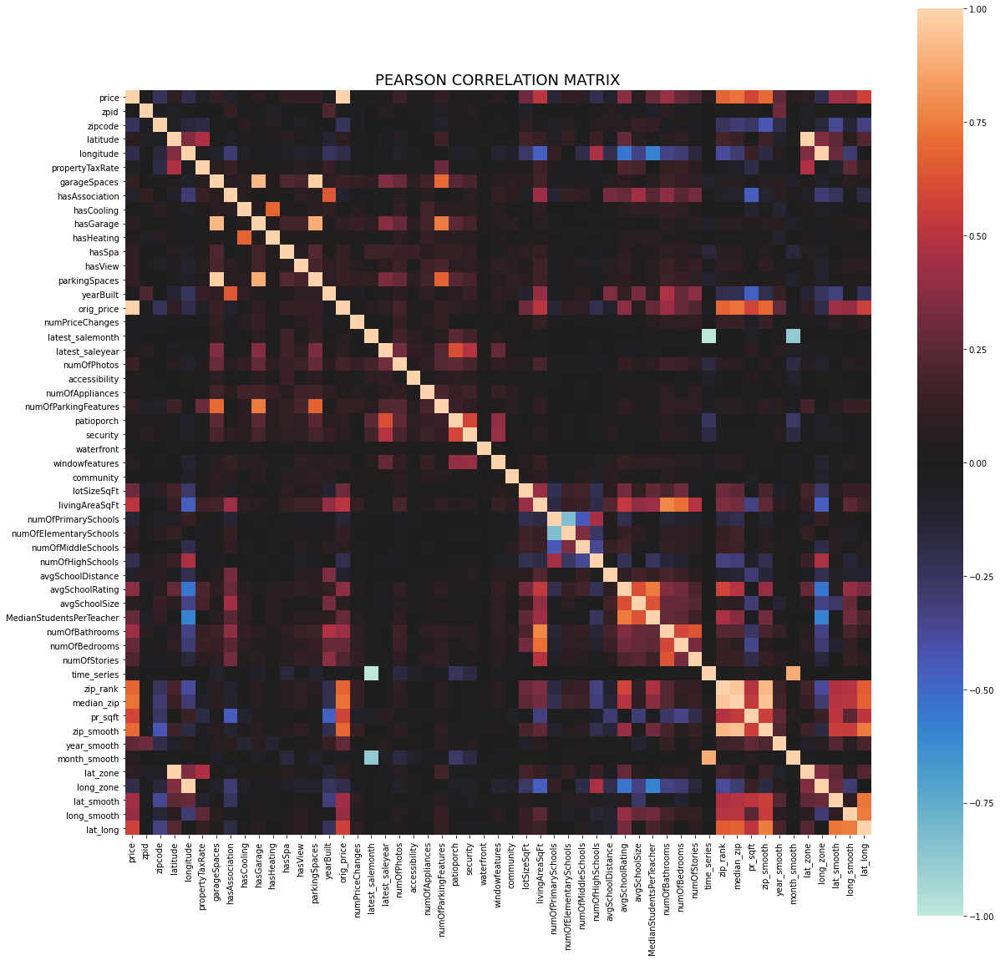

In [ ]:
# look for multicollinearity of features
fig, ax = plt.subplots(figsize=(20, 20))

sns.heatmap(train_data.corr(), center=0,
           vmin=-1, vmax=1,  square=True)

# title
plt.title('PEARSON CORRELATION MATRIX', fontsize=18)

plt.show()

In [ ]:
train_data.corr()

,price,zpid,zipcode,latitude,longitude,propertyTaxRate,garageSpaces,hasAssociation,hasCooling,hasGarage,hasHeating,hasSpa,hasView,parkingSpaces,yearBuilt,orig_price,numPriceChanges,latest_salemonth,latest_saleyear,numOfPhotos,accessibility,numOfAppliances,numOfParkingFeatures,patioporch,security,waterfront,windowfeatures,community,lotSizeSqFt,livingAreaSqFt,numOfPrimarySchools,numOfElementarySchools,numOfMiddleSchools,numOfHighSchools,avgSchoolDistance,avgSchoolRating,avgSchoolSize,MedianStudentsPerTeacher,numOfBathrooms,numOfBedrooms,numOfStories,time_series,zip_rank,median_zip,pr_sqft,zip_smooth,year_smooth,month_smooth,lat_zone,long_zone,lat_smooth,long_smooth,lat_long
price,1.000000,0.009843,-0.235924,0.083482,-0.198288,-0.057975,0.116301,-0.092607,0.020688,0.077534,0.024869,0.096570,0.108982,0.105161,-0.047434,0.992320,0.019714,-0.048954,0.046659,0.140553,0.027295,0.027986,0.102846,0.037784,0.025220,0.016382,0.055042,-0.009123,0.300847,0.503059,-0.140267,0.107482,0.087577,-0.206649,-0.089477,0.379111,0.067305,0.278755,0.419324,0.274806,0.215601,0.048954,0.686382,0.724253,0.579848,0.697567,0.264736,0.053658,0.083292,-0.198094,0.430168,0.405965,0.568095
zpid,0.009843,1.000000,-0.049849,-0.058464,0.009543,-0.011761,0.007022,0.111637,-0.040175,0.023236,-0.069831,-0.010724,-0.009223,0.002165,0.211211,0.011135,-0.048165,-0.001665,0.052319,-0.014444,0.009428,0.009402,-0.058560,0.034940,0.055728,-0.004205,-0.006626,0.000833,-0.078596,-0.002300,-0.003929,0.007717,-0.001156,0.013913,0.054352,-0.049475,-0.032786,-0.073571,0.075099,-0.051439,0.011134,0.001665,-0.030854,-0.023509,0.027137,-0.012000,0.299878,0.001550,-0.058376,0.009636,0.014312,-0.032514,-0.013462
zipcode,-0.235924,-0.049849,1.000000,-0.055874,-0.150689,-0.185847,-0.020177,-0.007227,0.077758,-0.032169,0.051278,-0.010617,-0.054963,-0.011426,0.001655,-0.235896,-0.048013,-0.006088,-0.002946,-0.002269,-0.006023,0.019765,-0.092738,0.026241,0.023611,-0.001695,0.018582,0.006531,0.092617,-0.033014,-0.061646,0.065737,-0.013916,0.055231,0.055956,0.054345,0.130949,0.108692,-0.051157,0.032500,-0.052631,0.006088,-0.251921,-0.294319,-0.258766,-0.431799,-0.195837,0.009054,-0.055965,-0.149986,-0.360347,-0.134537,-0.327789
latitude,0.083482,-0.058464,-0.055874,1.000000,0.353445,0.475419,0.025583,-0.070428,0.035597,0.017674,0.031670,0.057535,0.030181,0.023118,-0.128187,0.081690,0.019911,0.000884,-0.049919,0.051288,-0.011891,-0.001143,0.163968,-0.034451,-0.037467,0.013068,0.003076,-0.011458,0.168886,0.128777,-0.065127,0.116861,-0.023348,0.135399,-0.042642,0.277464,0.068954,-0.003815,0.048399,0.087325,0.038252,-0.000884,0.179934,0.132882,-0.012793,0.149841,-0.093092,0.014460,0.999579,0.353766,0.251915,0.064850,0.221805
longitude,-0.198288,0.009543,-0.150689,0.353445,1.000000,-0.018168,-0.088659,-0.290569,-0.062213,-0.022099,-0.042387,-0.055044,-0.101470,-0.085774,-0.244932,-0.197325,-0.046720,-0.001907,-0.020845,-0.092089,0.021784,-0.015042,0.003944,-0.075053,-0.066640,0.004524,-0.121428,-0.085741,-0.271558,-0.461383,0.121307,-0.001248,-0.195360,0.465105,-0.206142,-0.541141,-0.333218,-0.591490,-0.335836,-0.289715,-0.152475,0.001907,-0.379443,-0.290428,0.134932,-0.178567,0.053284,-0.004215,0.353887,0.999403,0.286070,-0.289408,-0.013023
propertyTaxRate,-0.057975,-0.011761,-0.185847,0.475419,-0.018168,1.000000,0.047467,0.135714,0.033596,0.022711,0.023374,0.032723,0.057815,0.043560,0.130305,-0.057466,-0.027761,0.005733,-0.021738,0.045132,-0.015723,0.020169,0.293188,0.008833,0.009435,0.002420,0.020071,0.038948,0.032424,0.161231,0.025020,-0.048346,-0.023319,-0.046262,-0.001105,0.209344,0.180043,-0.008448,0.117888,0.133073,0.071864,-0.005733,-0.052901,-0.074341,-0.179721,-0.050930,-0.043104,0.004285,0.475154,-0.017759,-0.096023,0.253664,0.112179
garageSpaces,0.116301,0.007022,-0.020177,0.025583,-0.088659,0.047467,1.000000,0.059287,0.052065,0.921581,0.046858,0.214699,0.195143,0.979873,0.092321,0.137254,0.116682,0.101358,0.353215,0.282913,0.079014,0.177305,0.700981,0.249888,0.189939,0.017609,0.063

In [ ]:
#Get our list of highly correlated feature pairs with following steps:

# save correlation matrix as a new data frame
# converts all values to absolute value
# stacks the row:column pairs into a multindex
# reset the index to set the multindex to seperate columns
# sort values. 0 is the column automatically generated by the stacking
df_correlations = train_data.corr().abs().stack().reset_index().sort_values(0, ascending=False)

# zip the variable name columns in a new column named "pairs"
df_correlations['pairs'] = list(zip(df_correlations.level_0, df_correlations.level_1))

# set index to pairs
df_correlations.set_index(['pairs'], inplace = True)

# rename our results column to correlation
df_correlations.rename(columns={0: "correlation"}, inplace=True)

# Drop 1:1 correlations to get rid of self pairs
df_correlations.drop(df_correlations[df_correlations['correlation'] == 1.000000].index, inplace=True)

# view pairs above 75% correlation and below 90% correlation (engineered features will correlate with each other above 95%)
df_correlations[(df_correlations.correlation>.75) & (df_correlations.correlation<.95)]


,level_0,level_1,correlation
pairs,,,
"(median_zip, zip_smooth)",median_zip,zip_smooth,0.939143
"(zip_smooth, median_zip)",zip_smooth,median_zip,0.939143
"(hasGarage, garageSpaces)",hasGarage,garageSpaces,0.921581
"(garageSpaces, hasGarage)",garageSpaces,hasGarage,0.921581
"(zip_smooth, zip_rank)",zip_smooth,zip_rank,0.914548
"(zip_rank, zip_smooth)",zip_rank,zip_smooth,0.914548
"(time_series, month_smooth)",time_series,month_smooth,0.878466
"(latest_salemonth, month_smooth)",latest_salemonth,month_smooth,0.878466
"(month_smooth, latest_salemonth)",month_smooth,latest_salemonth,0.878466


In [ ]:
# Check out our variables correlationg with price
df_correlations = train_data.corr().abs().stack().reset_index().sort_values(0, ascending=False)
df_correlations.loc[df_correlations['level_0'] == 'price'].sort_values(0, ascending=False)

,level_0,level_1,0
0,price,price,1.000000
15,price,orig_price,0.992320
43,price,median_zip,0.724253
45,price,zip_smooth,0.697567
42,price,zip_rank,0.686382
44,price,pr_sqft,0.579848
52,price,lat_long,0.568095
29,price,livingAreaSqFt,0.503059
50,price,lat_smooth,0.430168
38,price,numOfBathrooms,0.419324


We'll not use:

* parkingSpaces, hasGarage, numOfParkingFeatures and keep garageSpaces (higher relationship with Price)
* numOfElementarySchools, and keep numOfPrimarySchools (higher relationship with Price)
* MedianStudentsPerTeacher, keeping avgSchoolRating
* numOfBathrooms correlates with square footage, but I'm not dropping either

We can get a sense of the most important features to our price from our correlation table. Zipcode as a plain variable does not correlate, which makes sense, because without some sort of transformation it is an arbitrary unordered number. We can see how transformed as median_zip or zip_rank it becomes the MOST important contributor to price. We can see here that big contributors to price include
    
    * Lat/long in a target encoded form
    * zip code (in some altered form, not as arbitrary number)
    * livingAreaSqFt
    * numBathrooms
    * avgSchoolRating
    * lotSizeSqFt

In [ ]:
# combine all school counts into a single field
train_data['numOfSchools'] = train_data['numOfPrimarySchools'] + train_data['numOfElementarySchools'] + train_data['numOfMiddleSchools'] + train_data['numOfHighSchools']
holdout['numOfSchools'] = holdout['numOfPrimarySchools']  + holdout['numOfElementarySchools'] + holdout['numOfMiddleSchools'] + holdout['numOfHighSchools']

## EDA and Processing Train Set

### Categoricals

In [ ]:
categories = ['zipcode', 'yearBuilt', 'hasAssociation', 'hasCooling', 'hasHeating', 'hasSpa', 'hasView', 'accessibility', 'patioporch', 'security',
          'waterfront', 'windowfeatures', 'community', 'latest_salemonth', 'numOfSchools', 'garageSpaces', 'propertyTaxRate', ]

df_categoricals = train_data[categories]

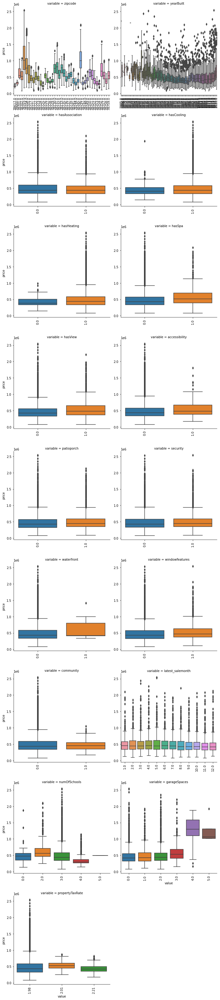

In [ ]:
# adding price to our dataframe so that we can do some visualizations

df_categoricals['price'] = train_data['price']

# plot our categoricals as box plots vs price
def boxplot(x, y, **kwargs):
    sns.boxplot(x=x, y=y)
    x=plt.xticks(rotation=90)

f = pd.melt(df_categoricals, id_vars=['price'], value_vars=categories)
g = sns.FacetGrid(f, col="variable",  col_wrap=2, sharex=False, sharey=False, size=5)
g = g.map(boxplot, "value", "price")

df_categoricals.drop('price', axis=1, inplace=True)

In [ ]:
# there is only ONE listing with 5 schools, so we will change that one to 4
df_categoricals.loc[df_categoricals['numOfSchools']==5, 'numOfSchools'] = 4

# binning our year built bins

num_bins = 30
labels = np.array(range(1,num_bins+1))
df_categoricals["year_block"] = pd.qcut(df_categoricals['yearBuilt'], q=num_bins, labels=labels)

df_categoricals.drop('yearBuilt', axis=1, inplace=True)

# telling Pandas that these columns are categoricals
for item in df_categoricals.columns:
    df_categoricals[item] = df_categoricals[item].astype('category')

# make a processed bins file for use with linear regression
# We're making TWO categorical sets. One is high one hot encoding. One is low one hot encoding, and the
# categoricals in that one will be target encoded as continuous instead

high_one_hot_cat =  ['zipcode', 'year_block', 'hasAssociation',
                 'hasCooling', 'hasHeating', 'hasSpa', 'hasView',
                 'accessibility', 'patioporch', 'security', 'numOfSchools',
              'waterfront', 'windowfeatures', 'community', 'latest_salemonth',
                    'garageSpaces', 'propertyTaxRate', ]
low_one_hot_cat =  ['hasAssociation',
                'hasCooling', 'hasHeating', 'hasSpa',
                'hasView', 'accessibility', 'patioporch', 'numOfSchools',
                'security', 'waterfront', 'windowfeatures', 'community', 'garageSpaces', 'propertyTaxRate', ]

df_cats_high_one_hot = pd.get_dummies(df_categoricals[high_one_hot_cat], prefix=high_one_hot_cat, drop_first=True)
df_cats_low_one_hot = pd.get_dummies(df_categoricals[low_one_hot_cat], prefix=low_one_hot_cat, drop_first=True)

### Continuous

In [ ]:
continuous = ['numPriceChanges',
              'lotSizeSqFt', 'livingAreaSqFt', 'avgSchoolDistance',
              'avgSchoolRating', 'avgSchoolSize', 'numOfBedrooms',
              'numOfStories', 'numOfPhotos',
              'numOfAppliances', 'latest_salemonth',
             'zip_smooth', 'year_smooth', 'month_smooth', 'lat_long']

x_continuous = train_data[continuous]
x_continuous['price'] = train_data['price']

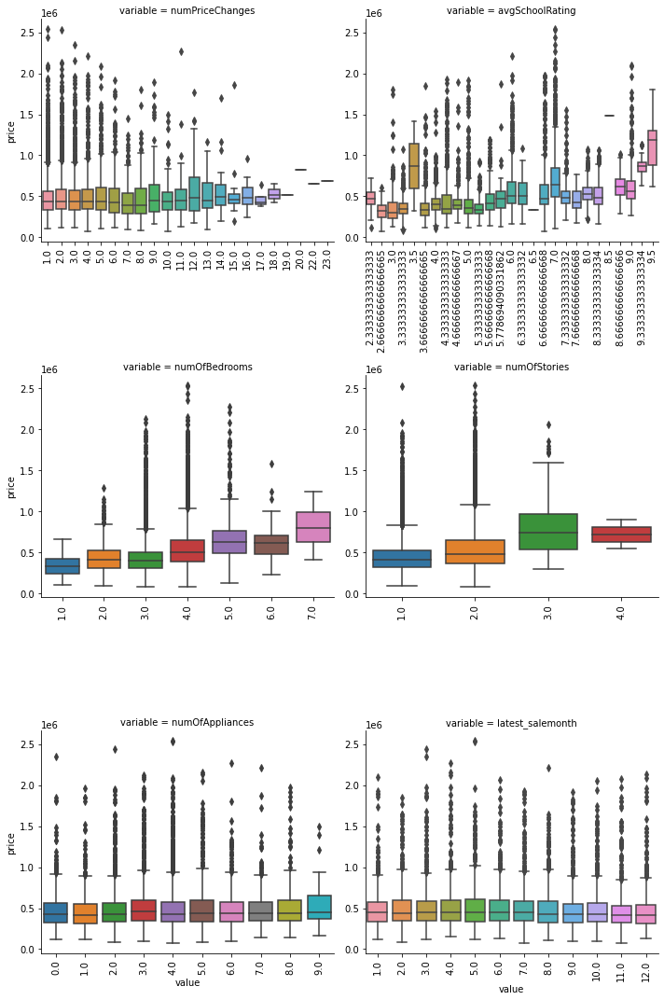

In [ ]:
small_cont = ['numPriceChanges',
              'avgSchoolRating', 'numOfBedrooms',
              'numOfStories', 'numOfAppliances',
              'latest_salemonth']
# plot our continuous as box plots vs price
def boxplot(x, y, **kwargs):
    sns.boxplot(x=x, y=y)
    x=plt.xticks(rotation=90)

f = pd.melt(x_continuous, id_vars=['price'], value_vars=small_cont)
g = sns.FacetGrid(f, col="variable",  col_wrap=2, sharex=False, sharey=False, size=5)
g = g.map(boxplot, "value", "price")


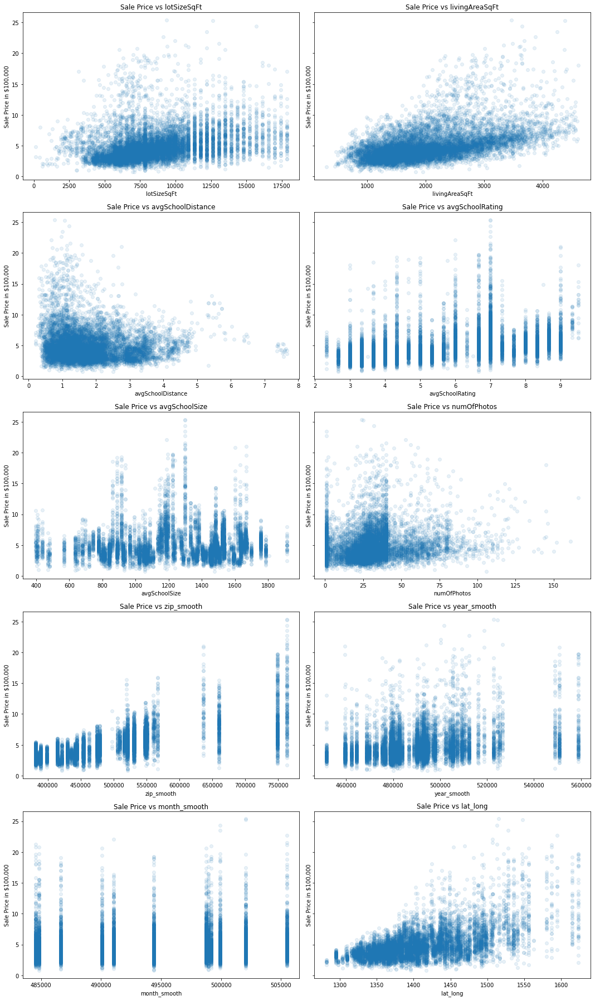

In [ ]:
large_cont = ['lotSizeSqFt', 'livingAreaSqFt', 'avgSchoolDistance',
              'avgSchoolRating', 'avgSchoolSize', 'numOfPhotos',
             'zip_smooth', 'year_smooth', 'month_smooth', 'lat_long']

# check linearity of continuous predictors

fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(15,25), sharey=True)

for ax, column in zip(axes.flatten(), large_cont):
    ax.scatter(x_continuous[column], x_continuous['price']/100000, label=column, alpha=.1)
    ax.set_title(f'Sale Price vs {column}')
    ax.set_xlabel(column)
    ax.set_ylabel('Sale Price in $100,000')

fig.tight_layout()

Positive relationship observed with:
* lot size
* square footage
* school rating
* number of bedrooms
* lat/long

Negative relationship observed with:
* number of price changes

Others seem neutral/uncertain

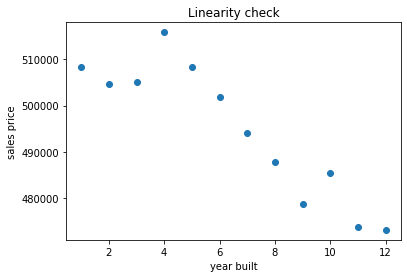

In [ ]:
# Checking out our mean sales price for year built scattered versus price shows a polynomial relationship

yearly_prices = train_data.groupby('latest_salemonth')['price'].mean()

plt.scatter(yearly_prices.index, yearly_prices)
plt.title("Linearity check")
plt.xlabel('year built')
plt.ylabel('sales price')
plt.show()

Our average per month looks polynomial.

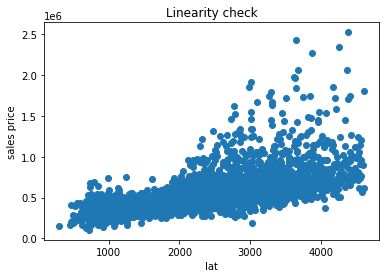

In [ ]:
# Checking out our mean sales price for latitude  scattered versus price shows a polynomial relationship
lat_prices = train_data.groupby('livingAreaSqFt')['price'].mean()

plt.scatter(lat_prices.index, lat_prices)
plt.title("Linearity check")
plt.xlabel('lat')
plt.ylabel('sales price')
plt.show()

This looks linear

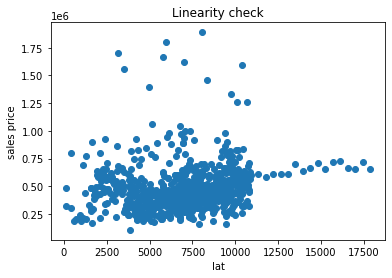

In [ ]:
# Checking out our mean sales price for lot size scattered versus price shows a polynomial relationship
lat_prices = train_data.groupby('lotSizeSqFt')['price'].mean()

plt.scatter(lat_prices.index, lat_prices)
plt.title("Linearity check")
plt.xlabel('lat')
plt.ylabel('sales price')
plt.show()

This looks somewhat linear

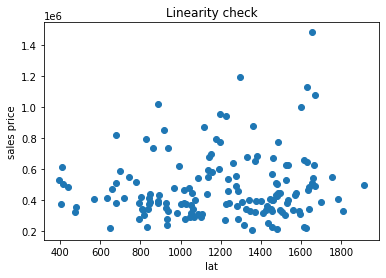

In [ ]:
# Checking out our mean sales price for average school size, scattered versus price shows a polynomial relationship
lat_prices = train_data.groupby('avgSchoolSize')['price'].mean()

plt.scatter(lat_prices.index, lat_prices)
plt.title("Linearity check")
plt.xlabel('lat')
plt.ylabel('sales price')
plt.show()

This looks meaningless

#### Finding Interactions

I wrote a function which finds all of the feature combinations possible in our dataset. Then for each combination, the function runs a linear regression with cross validation on 5 folds and gets the r^2 score for the regression including that feature combination. All scores are recorded and r^2 score improvement is assessed, with the resulting table giving the increase in model improvement from a feature combo.

In [ ]:
def test_feature_combinations(price, variables):

    """Function takes in target price and a dataframe of independent variables, and
    tests model improvement for each combination of variables
    ARGUMENTS:
    Y of target values
    X-dataframe of continuous features
    Returns dataframe of score improvements over base score for each interaction combination"""

    # select our estimator and our cross validation plan
    regression = LinearRegression()
    cv = RepeatedKFold(n_splits=5, n_repeats=2, random_state=1)

    # prepare our scoring dataframe
    scoring_df = pd.DataFrame()

    # prepare our lists to store our features and scores as we iterate
    scores = []
    feature1 = []
    feature2 = []

    # Get a list of all of our features, and remove our target variable 'price' from the list
    features = list(variables.columns)

    # make a list of all of our possible feature combinations
    feature_combos = itertools.combinations(features, 2)
    feature_combos = list(feature_combos)

    # set our y-value as our target variable
    y = price

    # prepare our x-value with our independent variables. We do an initial split here in order to run a
    # linear regression to get a base r^2 on our basic model without interactions
    X = variables
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=randomstate)
    base_score = round(np.mean(cross_val_score(regression, X_train, y_train, scoring='r2', cv=cv)), 4)
    print("Model base score is ",base_score)

    # now we run the regression on each feature combo
    for feature in feature_combos:
        feat1, feat2 = feature[0], feature[1]

        # create the test interaction on our data set
        variables['test_interaction'] = variables[feat1] * variables[feat2]
        # create a new X which includes the test interaction and drops our target value
        X = variables
        # make a new split so that our x-splits include the test interaction
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=randomstate)

        # Run a linear regression with cross-val just like our base model, and append the score to our scores list
        new_score = round(np.mean(cross_val_score(regression, X_train, y_train, scoring='r2', cv=cv)), 4)
        scores.append(new_score)
        # put feature 1 on a list
        feature1.append(feat1)
        # put feature 2 on a list
        feature2.append(feat2)
        print(feat1, feat2, new_score)



    # load all of our lists into the scoring dataframe
    scoring_df['feature1'] = feature1
    scoring_df['feature2'] = feature2
    scoring_df['scores'] = scores
    scoring_df['improvement'] = scoring_df['scores'] - base_score
    variables.drop('test_interaction', axis=1, inplace=True)

    # return our scoring dataframe to the function
    return scoring_df

In [ ]:
x_continuous.drop('price', axis=1, inplace=True)

In [ ]:
# running our function on our continuous variables to look for improvement
# our R2 is much lower for model base score because we aren't including our categorical variables in this improvement assessment

scoring_df = test_feature_combinations(y_train, x_continuous)

Model base score is  0.6446
numPriceChanges lotSizeSqFt 0.6442
numPriceChanges livingAreaSqFt 0.6444
numPriceChanges avgSchoolDistance 0.6445
numPriceChanges avgSchoolRating 0.6445
numPriceChanges avgSchoolSize 0.6445
numPriceChanges numOfBedrooms 0.6444
numPriceChanges numOfStories 0.6446
numPriceChanges numOfPhotos 0.6444
numPriceChanges numOfAppliances 0.6446
numPriceChanges latest_salemonth 0.6445
numPriceChanges zip_smooth 0.6445
numPriceChanges year_smooth 0.6447
numPriceChanges month_smooth 0.6445
numPriceChanges lat_long 0.6445
lotSizeSqFt livingAreaSqFt 0.6447
lotSizeSqFt avgSchoolDistance 0.6446
lotSizeSqFt avgSchoolRating 0.6446
lotSizeSqFt avgSchoolSize 0.645
lotSizeSqFt numOfBedrooms 0.6445
lotSizeSqFt numOfStories 0.6445
lotSizeSqFt numOfPhotos 0.6446
lotSizeSqFt numOfAppliances 0.6445
lotSizeSqFt latest_salemonth 0.6446
lotSizeSqFt zip_smooth 0.6498
lotSizeSqFt year_smooth 0.6444
lotSizeSqFt month_smooth 0.6447
lotSizeSqFt lat_long 0.6479
livingAreaSqFt avgSchoolDistance

In [ ]:
# showing our improvement scores for our interactions

scoring_df.sort_values('improvement', ascending=False)

,feature1,feature2,scores,improvement
35,livingAreaSqFt,zip_smooth,0.7067,0.0621
38,livingAreaSqFt,lat_long,0.6838,0.0392
73,numOfBedrooms,zip_smooth,0.6712,0.0266
76,numOfBedrooms,lat_long,0.6620,0.0174
101,zip_smooth,lat_long,0.6588,0.0142
...,...,...,...,...
24,lotSizeSqFt,year_smooth,0.6444,-0.0002
44,avgSchoolDistance,numOfAppliances,0.6444,-0.0002
1,numPriceChanges,livingAreaSqFt,0.6444,-0.0002
82,numOfStories,month_smooth,0.6444,-0.0002


We see there might be a relationship between square footage and our zip code. This makes sense because the size of the house is differently priced depending on location, as we saw in our visualizations earlier.

In [ ]:
x_continuous['sqft-zip'] = np.sqrt(x_continuous['livingAreaSqFt']) + np.sqrt(x_continuous['zip_smooth'])

####  Transform and Standardize

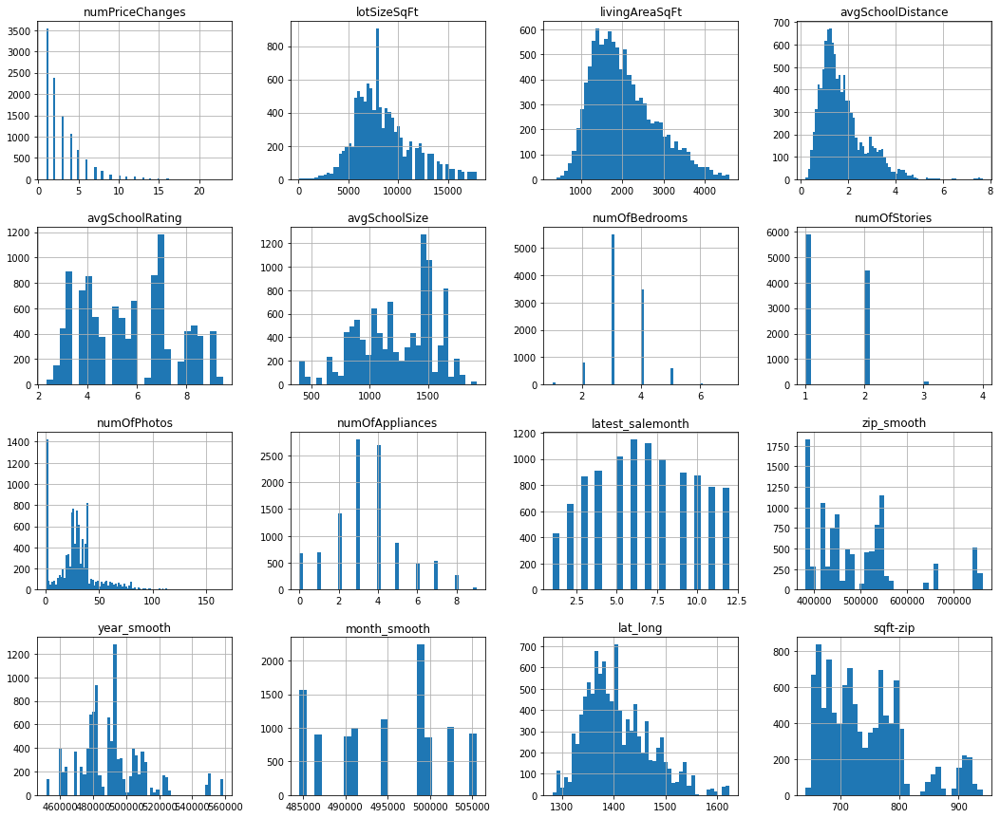

In [ ]:
# check out our histograms

x_continuous.hist(figsize=(18,15), bins='auto');

In [ ]:
x_continuous.describe()

,numPriceChanges,lotSizeSqFt,livingAreaSqFt,avgSchoolDistance,avgSchoolRating,avgSchoolSize,numOfBedrooms,numOfStories,numOfPhotos,numOfAppliances,latest_salemonth,zip_smooth,year_smooth,month_smooth,lat_long,sqft-zip
count,10489.000000,10489.000000,10489.000000,10489.000000,10489.000000,10489.000000,10489.000000,10489.000000,10489.000000,10489.000000,10489.000000,10489.000000,10489.000000,10489.000000,10489.000000,10489.000000
mean,2.978072,8437.565888,2029.877300,1.743448,5.675684,1230.558681,3.369721,1.446372,30.019926,3.462675,6.733340,490138.905806,490875.345886,494726.444370,1407.477357,741.142965
std,2.448574,2893.323359,775.666936,0.944890,1.849932,327.311932,0.745583,0.516885,20.496030,1.845212,3.135285,98058.138409,19783.254146,6710.042912,62.038111,69.629829
min,1.000000,113.000000,306.000000,0.200000,2.333333,396.000000,1.000000,1.000000,1.000000,0.000000,1.000000,381236.000000,451645.000000,484534.000000,1282.000000,641.271663
25%,1.000000,6534.000000,1438.000000,1.066667,4.000000,966.000000,3.000000,1.000000,20.000000,2.000000,4.000000,414758.000000,479319.000000,490062.000000,1363.000000,683.475920
50%,2.000000,7840.000000,1887.000000,1.500000,5.666667,1275.000000,3.000000,1.000000,29.000000,3.000000,7.000000,474524.000000,490314.000000,494412.000000,1396.000000,725.503989
75%,4.000000,9888.000000,2498.000000,2.166667,7.000000,1494.000000,4.000000,2.000000,38.000000,4.000000,9.000000,531669.000000,499781.000000,499899.000000,1445.000000,780.478825
max,23.000000,17859.600000,4604.000000,7.666667,9.500000,1913.000000,7.000000,4.000000,166.000000,9.000000,12.000000,763683.000000,558791.000000,505488.000000,1623.000000,940.319996


In [ ]:
# We're going to log transform our continuous variables, so we need to add a slight number to our zero values
x_continuous.loc[x_continuous['numOfAppliances']==0, 'numOfAppliances'] = .1

# log transform
log_continuous = np.log(x_continuous)

# standardize all of our values with scikit-learn StandardScaler
scaler = StandardScaler()

#transformed_scaled_continuous = pd.DataFrame(scaler.fit_transform(x_train_cont_log),columns = x_train_cont_log.columns)
scaled_continuous = pd.DataFrame(scaler.fit_transform(log_continuous),columns = log_continuous.columns)
scaled_continuous.head(5)

# make a processed bins file for use with linear regressiona
# We're making TWO continuous sets. One is high one hot encoding. One is low one hot encoding, and includes the
# categoricals that are target encoded as continuous instead

high_one_hot_cont =  ['numPriceChanges',
              'lotSizeSqFt', 'livingAreaSqFt', 'avgSchoolDistance',
              'avgSchoolRating', 'avgSchoolSize', 'numOfBedrooms',
              'numOfStories', 'numOfPhotos',
              'numOfAppliances', 'sqft-zip']
low_one_hot_cont =  ['numPriceChanges',
              'lotSizeSqFt', 'livingAreaSqFt', 'avgSchoolDistance',
              'avgSchoolRating', 'avgSchoolSize', 'numOfBedrooms',
              'numOfStories', 'numOfPhotos',
              'numOfAppliances',
             'zip_smooth', 'year_smooth', 'month_smooth', 'lat_long', 'sqft-zip']

df_cont_high_one_hot = scaled_continuous[high_one_hot_cont]
df_cont_low_one_hot = scaled_continuous[low_one_hot_cont]

#### Add polynomial features

In [ ]:
def plot_polys(y, xlabel, title):
    '''Takes in a y-axis, x-axis label, and title and plots with various polynomial levels
    ARGUMENTS:
    y axis variable values
    x-axis label
    visualization title'''
    x = y.index

    # express numbers as arrays and reshape
    y = np.array(y)
    x = np.array(x)
    x = x.reshape(-1, 1)

    # make sure indices match up
    y = y[x[:,0].argsort()]
    x = x[x[:, 0].argsort()]

    # plot figure
    plt.figure(figsize=(16, 8))

    # standard linear regression
    linreg = LinearRegression()
    linreg.fit(x, y)

    # 2nd degree polynomial regression
    poly2 = PolynomialFeatures(degree=2)
    x_poly2 = poly2.fit_transform(x)
    poly_reg2 = LinearRegression()
    poly_reg2.fit(x_poly2, y)

    # third degree polynomial regression
    poly3 = PolynomialFeatures(degree=3)
    x_poly3 = poly3.fit_transform(x)
    poly_reg3 = LinearRegression()
    poly_reg3.fit(x_poly3, y)

    # predict on x values
    pred = linreg.predict(x)
    pred2 = poly_reg2.predict(x_poly2)
    pred3 = poly_reg3.predict(x_poly3)

    # plot regression lines
    plt.scatter(x, y)
    plt.yscale('log')
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel('Average')
    plt.plot(x, pred, c='red', label='Linear regression line')
    plt.plot(x, pred2, c='yellow', label='Polynomial regression line 2')
    plt.plot(x, pred3, c='#a3cfa3', label='Polynomial regression line 3');

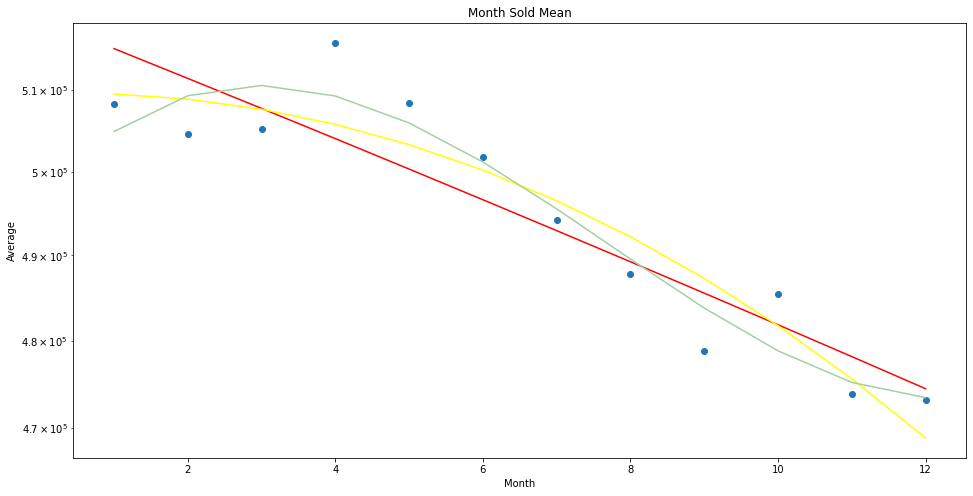

In [ ]:
# group by average month sold mean to see relationship
y = train_data.groupby('latest_salemonth')['price'].mean()
plot_polys(y, "Month", "Month Sold Mean")

In [ ]:
# adding our chosen polynomial features

def create_polynomial_array(data, column, num_features):
    values = data[column]
    poly_array = np.array(values)
    poly_array = poly_array.reshape(-1,1)
    poly_fit = PolynomialFeatures(degree=num_features, include_bias=False)
    fit_features = poly_fit.fit_transform(poly_array)
    poly_df = pd.DataFrame(fit_features)
    return poly_df

month_poly = create_polynomial_array(df_cont_low_one_hot, 'month_smooth',2)

df_cont_low_one_hot['month1'] = month_poly[1]


### NLP

We're now going to use natural language processing on our listing descriptions, which we cleaned earlier in the notebook using SpaCy.

In [ ]:
# make a new dataframe with just the descriptions from our train data
nlp = ['sentences']
nlp_train = train_data[nlp]
nlp_train.head(10)

,sentences
0,anderson mill beauty open floorplan gorgeous ...
1,great highly desire crestview hardwood floor ...
2,charming long greenbelt corner interior origi...
3,miss chance live beautiful reunion ranch ceil...
4,beautiful locate cul de large treed lot enjoy...
5,readylocate large woode lot popular south nei...
6,great large tree cover corner lot near future...
7,picturesque buffington feature spacious layou...
8,new construction gate live eane isd day compl...
9,beautiful maintain highly desirable area matu...


We're going to pull relevant information from the listing descriptions with the following parameters:
   * sublinear_tf = True: A weight scaler that reduces the bias of assuming that an ngram that appears x times more frequently is x times more important
   * use_idf = True: use Inverse Document Frequency, so that ngrams that appear very frequently to the extent they appear in most document (i.e., a bad indicator) get weighted less compared to ngrams that appear less frequently but they appear in specific documents only (i.e., a good indicator)(citation: https://stackoverflow.com/questions/34435484/tfidfvectorizer-normalisation-bias)
   * max_df: the maximum % of documents where an ngram can appear to be utilized
   * min_df: the minimum % of documents where an ngram must appear to be utilized
   * ngram_range=(x,y): the types of ngrams we will create, from x to y
   * max_features: the maximum number of features that will be created
   
TfidfVectorizer then creates a binary array for all of the features selected, and assigns the word a weight based on its frequency and importance.

In [ ]:
# prepare the vectorizer with the chosen parameters
processor = TfidfVectorizer(sublinear_tf=True, use_idf=True, max_df=0.9, min_df=.005, ngram_range=(1,4), max_features=1000)
# fit the vectorizer to the data
x = processor.fit_transform(nlp_train['sentences'])

# cast the vector array to a data frame with columns named by the features selected by the vectorizer
train_word_vectors = pd.DataFrame(x.toarray(), columns=processor.get_feature_names())

In [ ]:
# run a test model using the word vectors
predictors_train = sm.add_constant(train_word_vectors)
model = sm.OLS(y_train, predictors_train).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.422
Model:                            OLS   Adj. R-squared:                  0.361
Method:                 Least Squares   F-statistic:                     6.940
Date:                Tue, 05 Oct 2021   Prob (F-statistic):               0.00
Time:                        14:59:48   Log-Likelihood:            -1.4251e+05
No. Observations:               10489   AIC:                         2.870e+05
Df Residuals:                    9491   BIC:                         2.943e+05
Df Model:                         997                                         
Covariance Type:            nonrobust                                         
==============================================================================================
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
const                       4.319e+05   1.36e+04     31.763      0.000    4.05e+05    4.59e+05
1story                     -1.304e+04   1.04e+05     -0.126      0.900   -2.16e+05     1.9e+05
2car                       -4.243e+04   1.09e+05     -0.388      0.698   -2.57e+05    1.72e+05
2story                      2.305e+04   9.91e+04      0.233      0.816   -1.71e+05    2.17e+05
abundance                   1.005e+05   1.44e+05      0.696      0.487   -1.83e+05    3.84e+05
abundance natural           1.081e+04   1.76e+05      0.061      0.951   -3.35e+05    3.57e+05
abundant                    8.672e+04   9.95e+04      0.872      0.383   -1.08e+05    2.82e+05
ac                         -6.657e+04   8.35e+04     -0.797      0.425    -2.3e+05    9.71e+04
accent                      9.399e+04   9.85e+04      0.954      0.340   -9.91e+04    2.87e+05
access                      1.649e+05   8.58e+04      1.921      0.055   -3388.395    3.33e+05
access mopac                1.664e+05   2.16e+05      0.769      0.442   -2.58e+05    5.91e+05
acre                        8.732e+04    8.5e+04      1.027      0.304   -7.93e+04    2.54e+05
acre lot                    7.155e+04   1.11e+05      0.642      0.521   -1.47e+05     2.9e+05
add                        -3.207e+04   6.47e+04     -0.495      0.620   -1.59e+05    9.48e+04
addition                    3.668e+05   8.54e+04      4.293      0.000    1.99e+05    5.34e+05
additional                  7451.1230   7.31e+04      0.102      0.919   -1.36e+05    1.51e+05
adorable                   -2.487e+05   8.53e+04     -2.916      0.004   -4.16e+05   -8.15e+04
agent                       4.093e+04   7.85e+04      0.522      0.602   -1.13e+05    1.95e+05
air                         1.323e+05   1.03e+05      1.288      0.198   -6.91e+04    3.34e+05
airport                    -2.486e+05   7.87e+04     -3.157      0.002   -4.03e+05   -9.42e+04
airy                        6.593e+04   1.09e+05      0.606      0.545   -1.47e+05    2.79e+05
alamo                      -5.845e+04   1.16e+05     -0.502      0.616   -2.87e+05     1.7e+05
allow                       1.164e+05   8.41e+04      1.384      0.166   -4.84e+04    2.81e+05
amazing                    -2.819e+04   5.98e+04     -0.471      0.638   -1.46e+05    8.91e+04
amenity                    -1.933e+05   8.36e+04     -2.312      0.021   -3.57e+05   -2.94e+04
amenity include             5.892e+04   1.27e+05      0.464      0.643    -1.9e+05    3.08e+05
ample                       4.308e+04   8.64e+04      0.498      0.618   -1.26e+05    2.12e+05
anderson                    2.006e+05   1.04e+05      1.921      0.055   -4143.635    4.05e+05
appeal                      1.647e+05   2.01e+05      0.818      0.414    -2.3e+05    5.59e+05
apple                      -5.629e+04   1.3

Now we will use permutation importance to determine which of these words is actually relevant to our model. This is a great model-agnostic method that you can use with any model type, and the way it works is very easy to understand. After fitting the model, it calculates a baseline R^2 score. Then for each feature, it scrambles the inputs of that feature, turnings its contribution into noise. The model is evaluated again with the feature scrambled, and the change in overall R^2 is logged as the importance for that feature. After scrambling all features, each feature has been assigned an importance based on the R^2 reduction. You can then select the features that had an effect on R^2 based on your own threshold (I kept anything >= .001) and throw out the remaining features.

You can learn more about this underrated feature selection method here: https://explained.ai/rf-importance/ The article focuses on Random Forest, but discusses permutation importance as an excellent feature selection method for any model type.

In [ ]:
model = LinearRegression()
model.fit(train_word_vectors, y_train)

from sklearn.inspection import permutation_importance
r = permutation_importance(model, train_word_vectors, y_train,
                           n_repeats=10,
                            random_state=0,
                          n_jobs=-1)

importances = {}

for i in r.importances_mean.argsort()[::-1]:
    if r.importances_mean[i] >= 0.001:
        importances[train_word_vectors.columns[i]] = r.importances_mean[i]
    else: continue

importances

important_ngrams = list(importances.keys())
print(important_ngrams)

['quiet cul', 'quiet cul de', 'en', 'en suite', 'sys yes', 'sprinkler sys yes', 'de', 'cul de', 'de lot', 'cul de lot', 'pool', 'zilker', 'default', 'mid century', 'cul', 'main', 'natural light', 'washer dryer', 'large corner lot', 'barton', 'large corner', 'stainless steel', 'natural', 'award win', 'century', 'curb', 'design', 'vault ceiling', 'wine', 'brand new', 'heart', 'steel', 'floor', 'vault', 'luxury', 'brand', 'washer', 'counter stainless', 'view', 'dryer', 'ton natural light', 'gourmet kitchen', 'steiner ranch', 'minute', 'isd', 'condo', 'floor plan', 'walnut creek', 'formal', 'community', 'easy access', 'hill', 'tub separate', 'lake', 'finish', 'level', 'park pool', 'classic', 'walk closet', 'south', 'steel appliance', 'formal dining', 'walnut', 'lot natural light', 'chef kitchen', 'marble', 'award', 'swimming', 'appliance', 'hill country', 'open floor plan', 'laminate', 'congress', 'guest', 'flat', 'main floor', 'tub separate shower', 'open floor', 'courtyard', 'walkable', 

In [ ]:
len(important_ngrams)

191

The feature selector designated 191 of the 1000 ngrams that it created as important. The remaining ngrams will be discarded.

These are copied just below so that the selector code does not need to be run every time.

In [ ]:
train_word_vectors_refined = train_word_vectors[important_ngrams]

# run a test model using the word vectors
predictors_train = sm.add_constant(train_word_vectors_refined)
model = sm.OLS(y_train, predictors_train).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.349
Model:                            OLS   Adj. R-squared:                  0.337
Method:                 Least Squares   F-statistic:                     29.38
Date:                Tue, 05 Oct 2021   Prob (F-statistic):               0.00
Time:                        15:02:43   Log-Likelihood:            -1.4313e+05
No. Observations:               10489   AIC:                         2.866e+05
Df Residuals:                   10300   BIC:                         2.880e+05
Df Model:                         188                                         
Covariance Type:            nonrobust                                         
==============================================================================================
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
const                       4.181e+05   7339.728     56.961      0.000    4.04e+05    4.32e+05
quiet cul                   2.425e+04   5.46e+04      0.444      0.657   -8.27e+04    1.31e+05
quiet cul de                2.425e+04   5.46e+04      0.444      0.657   -8.27e+04    1.31e+05
en                          1.533e+05   5.18e+04      2.958      0.003    5.17e+04    2.55e+05
en suite                    1.533e+05   5.18e+04      2.958      0.003    5.17e+04    2.55e+05
sys yes                     6.026e+04   7.89e+04      0.764      0.445   -9.44e+04    2.15e+05
sprinkler sys yes           6.026e+04   7.89e+04      0.764      0.445   -9.44e+04    2.15e+05
de                          2.203e+06   3.09e+05      7.127      0.000     1.6e+06    2.81e+06
cul de                     -1.772e+06   6.14e+05     -2.885      0.004   -2.98e+06   -5.68e+05
de lot                     -2.347e+06   1.23e+06     -1.911      0.056   -4.75e+06    5.99e+04
cul de lot                  2.244e+06   1.23e+06      1.823      0.068   -1.69e+05    4.66e+06
pool                        7.476e+05   5.92e+04     12.638      0.000    6.32e+05    8.64e+05
zilker                       1.07e+06   8.43e+04     12.693      0.000    9.04e+05    1.23e+06
default                     7.274e+04   8502.886      8.554      0.000    5.61e+04    8.94e+04
mid century                 6.839e+05    3.5e+05      1.955      0.051   -1962.449    1.37e+06
cul                        -3.761e+05   5.29e+05     -0.711      0.477   -1.41e+06    6.61e+05
main                         6.43e+05   9.82e+04      6.547      0.000    4.51e+05    8.36e+05
natural light              -5.529e+05   1.44e+05     -3.839      0.000   -8.35e+05   -2.71e+05
washer dryer                5.892e+05   3.87e+05      1.523      0.128   -1.69e+05    1.35e+06
large corner lot           -7.181e+05    4.1e+05     -1.753      0.080   -1.52e+06    8.47e+04
barton                      7.259e+05   8.24e+04      8.814      0.000    5.64e+05    8.87e+05
large corner                6.994e+05   4.01e+05      1.742      0.082   -8.76e+04    1.49e+06
stainless steel            -7.218e+05   2.96e+05     -2.436      0.015    -1.3e+06   -1.41e+05
natural                     5.423e+05   1.35e+05      4.005      0.000    2.77e+05    8.08e+05
award win                   4.857e+05   4.06e+05      1.196      0.232    -3.1e+05    1.28e+06
century                    -4.171e+05   2.81e+05     -1.486      0.137   -9.67e+05    1.33e+05
curb                       -4.554e+05   3.69e+05     -1.235      0.217   -1.18e+06    2.67e+05
design                      6.465e+05   6.33e+04     10.211      0.000    5.22e+05    7.71e+05
vault ceiling              -5.971e+05   2.55e+05     -2.337      0.019    -1.1e+06   -9.64e+04
wine                        8.491e+05   9.5

Our word vectors have some multicollinearity, which is not unexpected. Let's take a look and see if we can refine our terms list more.

In [ ]:
#Get our list of highly correlated feature pairs with following steps:

# save correlation matrix as a new data frame
# converts all values to absolute value
# stacks the row:column pairs into a multindex
# reset the index to set the multindex to seperate columns
# sort values. 0 is the column automatically generated by the stacking
df_correlations = train_word_vectors_refined.corr().abs().stack().reset_index().sort_values(0, ascending=False)

# zip the variable name columns in a new column named "pairs"
df_correlations['pairs'] = list(zip(df_correlations.level_0, df_correlations.level_1))

# set index to pairs
df_correlations.set_index(['pairs'], inplace = True)

# rename our results column to correlation
df_correlations.rename(columns={0: "correlation"}, inplace=True)

# Drop 1:1 correlations to get rid of self pairs
df_correlations.drop(df_correlations[df_correlations['correlation'] == 1.000000].index, inplace=True)

# view pairs above 75% correlation and below 90% correlation (engineered features will correlate with each other above 95%)
df_correlations[(df_correlations.correlation>.75) & (df_correlations.correlation<.95)]


,level_0,level_1,correlation
pairs,,,
"(washer, dryer)",washer,dryer,0.945632
"(dryer, washer)",dryer,washer,0.945632
"(conveniently, conveniently locate)",conveniently,conveniently locate,0.940283
"(conveniently locate, conveniently)",conveniently locate,conveniently,0.940283
"(steel appliance, stainless steel)",steel appliance,stainless steel,0.915471
"(stainless steel, steel appliance)",stainless steel,steel appliance,0.915471
"(tub separate, tub separate shower)",tub separate,tub separate shower,0.911916
"(tub separate shower, tub separate)",tub separate shower,tub separate,0.911916
"(garden tub separate, garden tub separate shower)",garden tub separate,garden tub separate shower,0.910556


There is a problem here which is a problem with NLP, where we have to be careful what we eliminate because a term might show up in one listing but not another even if they mean the same thing. So we must be very careful with term deletion and certain that if we remove a term it's certainly because the OTHER term is present as well.

It's easy enough if it is a trigram and a bigram correlated, because we can safely remove the trigram. Same situation for a bigram to a unigram.

In [ ]:
important_ngrams

['quiet cul',
 'quiet cul de',
 'en',
 'en suite',
 'sys yes',
 'sprinkler sys yes',
 'de',
 'cul de',
 'de lot',
 'cul de lot',
 'pool',
 'zilker',
 'default',
 'mid century',
 'cul',
 'main',
 'natural light',
 'washer dryer',
 'large corner lot',
 'barton',
 'large corner',
 'stainless steel',
 'natural',
 'award win',
 'century',
 'curb',
 'design',
 'vault ceiling',
 'wine',
 'brand new',
 'heart',
 'steel',
 'floor',
 'vault',
 'luxury',
 'brand',
 'washer',
 'counter stainless',
 'view',
 'dryer',
 'ton natural light',
 'gourmet kitchen',
 'steiner ranch',
 'minute',
 'isd',
 'condo',
 'floor plan',
 'walnut creek',
 'formal',
 'community',
 'easy access',
 'hill',
 'tub separate',
 'lake',
 'finish',
 'level',
 'park pool',
 'classic',
 'walk closet',
 'south',
 'steel appliance',
 'formal dining',
 'walnut',
 'lot natural light',
 'chef kitchen',
 'marble',
 'award',
 'swimming',
 'appliance',
 'hill country',
 'open floor plan',
 'laminate',
 'congress',
 'guest',
 'flat',
 '

In [ ]:
remove = ['dryer', 'conveniently locate', 'tub separate shower', 'steel appliance', 'stainless steel', 'garden tub separate shower',
                'mid century', 'corner lot', 'natural light', 'recess lighting', 'hike bike', 'sport court', 'walnut creek',
                'hill country', 'south congress', 'sys yes', 'quiet cul de', 'garden tub separate']

for item in remove:
    important_ngrams.remove(item)

train_word_vectors_refined = train_word_vectors[important_ngrams]

## Process Test Set

### Categoricals

In [ ]:
holdout_categoricals = holdout[categories]

# binning our year built bins
holdout_categoricals["year_block"], year_bins = pd.qcut(holdout_categoricals['yearBuilt'], q=num_bins, retbins=True, labels=labels)

holdout_categoricals.drop('yearBuilt', axis=1, inplace=True)

# telling Pandas that these columns are categoricals
for item in holdout_categoricals.columns:
    holdout_categoricals[item] = holdout_categoricals[item].astype('category')

# make a processed bins file for use with linear regression
df_cats_high_one_hot_holdout = pd.get_dummies(holdout_categoricals[high_one_hot_cat], prefix=high_one_hot_cat, drop_first=True)
df_cats_low_one_hot_holdout = pd.get_dummies(holdout_categoricals[low_one_hot_cat], prefix=low_one_hot_cat, drop_first=True)

### Continuous

In [ ]:
# apply target encoding to test data, using train data to map

# create smooth additive encoded variables for zipcode, year built, and monthsold
holdout['zip_smooth'] = calc_smooth_mean(train_data, 'zipcode', 'price', zip_samples, holdout)
holdout['year_smooth'] = calc_smooth_mean(train_data, 'yearBuilt', 'price', 300, holdout)
holdout['month_smooth'] = calc_smooth_mean(train_data, 'latest_salemonth', 'price', month_samples, holdout)

# Create a wider lat and long zone to calculate an area mean
holdout['lat_zone'] = round(holdout['latitude'], 2)
holdout['long_zone'] = round(holdout['longitude'], 2)

# calculate smooth mean variables for lat and long, then create an interactive variable describing both together
holdout['lat_smooth'] = calc_smooth_mean(train_data, 'lat_zone', 'price', lat_samples, holdout)
holdout['long_smooth'] = calc_smooth_mean(train_data, 'long_zone', 'price', long_samples, holdout)
holdout['lat_long'] = round(np.sqrt(holdout['lat_smooth']) + np.sqrt(holdout['long_smooth']), 0)



In [ ]:
holdout['year_smooth'].isna().sum()
# a few listings weren't able to create year smooth information, so we just impute it

2

In [ ]:
# a few listings weren't able to create year smooth information, so we just impute it
holdout.loc[holdout['year_smooth'].isna(), 'year_smooth'] = train_data['year_smooth'].mean()

holdout_continuous = holdout[continuous]

holdout_continuous['sqft-zip'] = np.sqrt(holdout_continuous['livingAreaSqFt']) + np.sqrt(holdout_continuous['zip_smooth'])

# We're going to log transform our continuous variables, so we need to add a slight number to our zero values
holdout_continuous.loc[holdout_continuous['numOfAppliances']==0, 'numOfAppliances'] = .1

# log transform
log_continuous = np.log(holdout_continuous)

scaled_holdout_continuous = pd.DataFrame(scaler.transform(log_continuous),columns = log_continuous.columns)

# making our two continuous sets
df_cont_high_one_hot_holdout = scaled_holdout_continuous[high_one_hot_cont]
df_cont_low_one_hot_holdout = scaled_holdout_continuous[low_one_hot_cont]

# adding polynomial features
month_poly = create_polynomial_array(df_cont_low_one_hot_holdout, 'month_smooth',2)
df_cont_low_one_hot_holdout['month1'] = month_poly[1]

In [ ]:
holdout_continuous

,numPriceChanges,lotSizeSqFt,livingAreaSqFt,avgSchoolDistance,avgSchoolRating,avgSchoolSize,numOfBedrooms,numOfStories,numOfPhotos,numOfAppliances,latest_salemonth,zip_smooth,year_smooth,month_smooth,lat_long,sqft-zip
0,2,11325.6,3409.0,3.466667,5.666667,1332,4,2,31,8.0,12,548397.0,493039.0,484534.0,1422.0,798.924960
1,3,2526.0,1918.0,2.066667,5.000000,966,3,2,29,3.0,10,474524.0,490314.0,490062.0,1460.0,732.652001
2,3,9844.0,2774.0,1.100000,8.666667,1632,3,2,31,1.0,9,551178.0,462176.0,486645.0,1406.0,795.082408
3,4,11761.2,1951.0,1.033333,7.000000,1177,4,1,39,3.0,4,660662.0,506231.0,505488.0,1522.0,856.981297
4,1,7840.0,1657.0,0.566667,7.000000,1189,3,1,1,1.0,3,530546.0,490326.0,499899.0,1463.0,769.092152
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2618,1,12632.4,2829.0,0.900000,8.000000,743,4,1,1,3.0,4,516351.0,509355.0,505488.0,1345.0,771.764019
2619,3,8276.0,3450.0,1.666667,7.000000,1381,4,2,40,2.0,6,560132.0,497139.0,498757.0,1386.0,807.156369
2620,3,8407.0,3034.0,4.100000,6.000000,1455,4,2,37,2.0,5,548397.0,482818.0,502067.0,1466.0,795.620075
2621,1,7840.0,1119.0,1.800000,6.666667,1226,2,2,38,8.0,2,749512.0,459401.0,498966.0,1536.0,899.195068


### NLP

In [ ]:
# create our data frame of descriptions for the holdout set
nlp_holdout = holdout[nlp]

# transform our holdout set using the same vectorizer as our train set (it will make the same set of ngrams)
x = processor.transform(nlp_holdout['sentences'])

# cast our word vectors to data frame
holdout_word_vectors = pd.DataFrame(x.toarray(), columns=processor.get_feature_names())

# refine the holdout words to the same as the train set
holdout_word_vectors_refined = holdout_word_vectors[important_ngrams]

## Create Train/Test Final Set

In [ ]:
# make our train sets for one-hot encoded and target-encoded categoricals
X_train_onehot = pd.concat([df_cont_high_one_hot, df_cats_high_one_hot, train_word_vectors_refined], axis=1)
X_train_encoded = pd.concat([df_cont_low_one_hot, df_cats_low_one_hot, train_word_vectors_refined], axis=1)

# make our test sets for one-hot encoded and target-encoded categoricals
X_test_onehot = pd.concat([df_cont_high_one_hot_holdout, df_cats_high_one_hot_holdout, holdout_word_vectors_refined], axis=1)
X_test_encoded = pd.concat([df_cont_low_one_hot_holdout, df_cats_low_one_hot_holdout, holdout_word_vectors_refined], axis=1)

# make our target variable train and test sets, after log transforming our target variable
target = 'price' # target variable
y = np.log(df[target]) # our log-transformed target variable

y_train, y_test = train_test_split(y, test_size=0.2, random_state=randomstate) #
test_actual = np.exp(y_test)

y_train.reset_index(inplace=True, drop=True)
y_test.reset_index(inplace=True, drop=True)

### Data Sets Reference

Our final data sets include:

* X_train_onehot, X_test_onehot - train/test split predictors for one-hot sets
* X_train_encoded, X_test_encoded - train/test split predictors for encoded sets
* y_train, y_test - target values for all sets
* y - log transformed price
* test_actual - exponentiated y_test prices

# Model Explorations

We're going to evaluate a few different variations of our linear regression model, as well as a few more complex model types. In order to keep track of our results, we'll be making a dictionary to store our model accuracy results.

In [ ]:
# prepare dictionary to store results
models = {}
models['Models'] = []
models['r2'] = []
models['mae'] = []
models['rmse'] = []

In [ ]:
def make_model_log(model, train, test, y_train, y_test, title):

    model.fit(train, y_train)
    cv_5 = cross_val_score(model, train, y_train, cv=5)
    r2 = round(cv_5.mean()*100,2)

    test_predictions = model.predict(test)

    # reverse log transform our predicted values
    test_predictions_unscaled = np.exp(test_predictions).astype(int)
    test_predictions_unscaled = test_predictions_unscaled.flatten()

    test_actual = np.exp(y_test)

    # get residuals
    residuals = test_actual - test_predictions_unscaled

    fig = plt.figure(figsize=(20,15))
    plt.scatter(test_predictions_unscaled, residuals)
    plt.show()

    # Calculate our errors
    mae = round(mean_absolute_error(test_actual, test_predictions_unscaled), 2)
    rmse = round(np.sqrt(mean_squared_error(test_actual, test_predictions_unscaled)), 2)

    # append our results to our lists
    models['Models'].append(title)
    models['r2'].append(r2)
    models['mae'].append(mae)
    models['rmse'].append(rmse)

    print("R2: ", r2, "\nMAE: ", mae, "\nRMSE: ", rmse, "\n{} predictors used for this model".format(train.shape[1]))

In [ ]:
def make_model_nolog(model, train, test, y_train, y_test, title):

    model.fit(train, y_train)
    cv_5 = cross_val_score(model, train, y_train, cv=5)
    r2 = round(cv_5.mean()*100,2)

    test_predictions = model.predict(test)

    residuals = y_test - test_predictions

    fig = plt.figure(figsize=(20,15))
    plt.scatter(test_predictions, residuals)
    plt.show()

    # Calculate our errors
    mae = round(mean_absolute_error(test_actual, test_predictions), 2)
    rmse = round(np.sqrt(mean_squared_error(test_actual, test_predictions)), 2)

    # append our results to our lists
    models['Models'].append(title)
    models['r2'].append(r2)
    models['mae'].append(mae)
    models['rmse'].append(rmse)

    print("R2: ", r2, "\nMAE: ", mae, "\nRMSE: ", rmse, "\n{} predictors used for this model".format(train.shape[1]))

Our final data sets include:

* x_final_one_hot - Predictors with one-hot encoding for zipcode, month and year
* x_final_encoded - Predictors with additive smoothed encoding for zipcode, month and year
* y - log transformed price


* X_train_onehot, X_test_onehot - train/test split predictors for one-hot sets
* X_train_encoded, X_test_encoded - train/test split predictors for encoded sets
* y_train, y_test - target values for all sets
* test_actual - exponentiated y_test prices

## Picking our Base Features

We can use residuals plots to determine if features are important enough to add to our model. If we regress our target on a predictor, and then plot those residuals against a DIFFERENT predictor, our plot will tell us if the new feature might add to our model.

We're planning to one-hot encode our zips, but we'll use our zip_median continuous variable for now to start on.

We're going to add features in order of their correlation with price on our correlation heat map, so our base feature is zip code because it has the strongest correlation.

We regress our target on zip code, then we plot our residuals against total square footage.

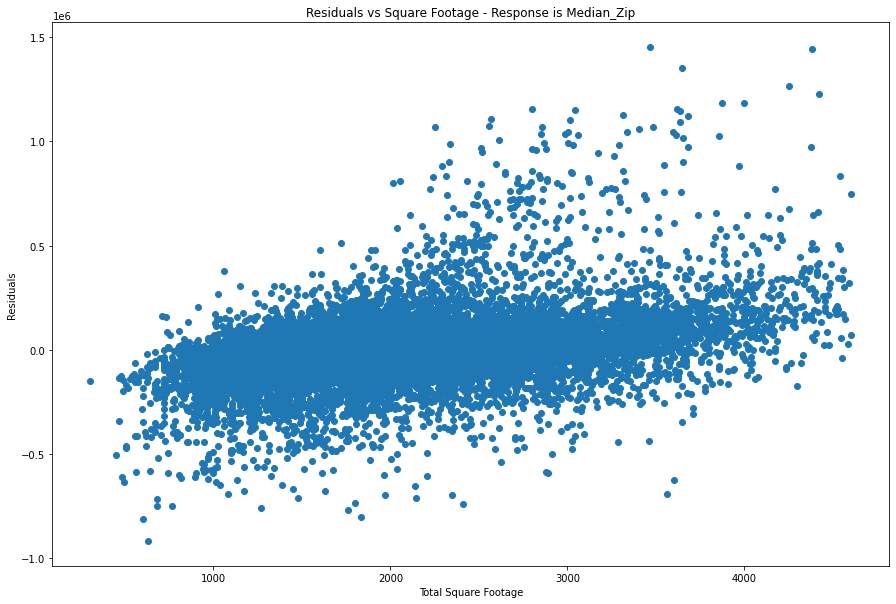

In [ ]:
x, y = np.array(df['median_zip']).reshape(-1,1), df['price']
z = np.array(df['livingAreaSqFt']).reshape(-1,1)

model = LinearRegression()
model.fit(x, y)

test_predictions = model.predict(x)

residuals = y - test_predictions

fig = plt.figure(figsize=(15,10))

# Add labels for x and y axes
plt.xlabel('Total Square Footage')
plt.ylabel('Residuals')

# Add a title for the plot
plt.title('Residuals vs Square Footage - Response is Median_Zip')


plt.scatter(z, residuals, label="sample");

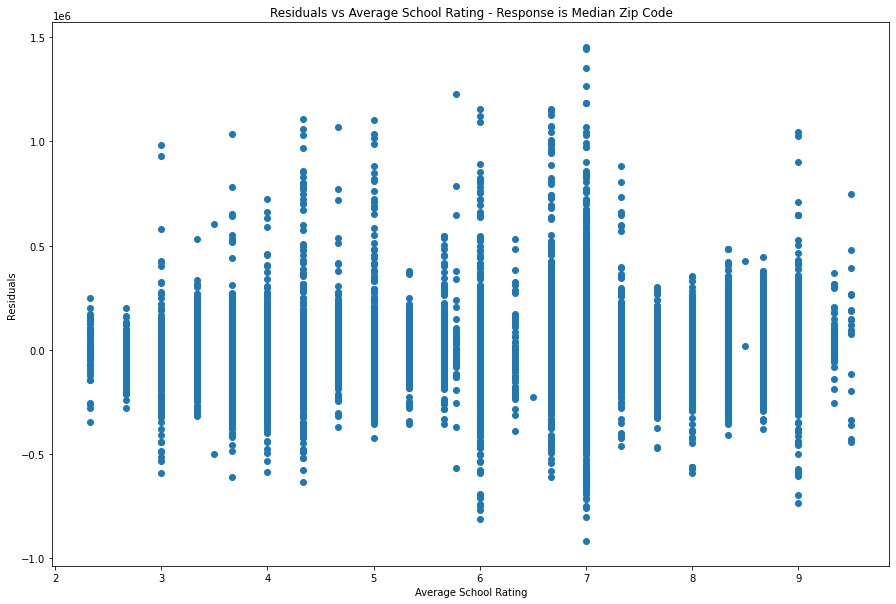

In [ ]:
x, y = np.array(df['median_zip']).reshape(-1,1), df['price']
z = np.array(df['avgSchoolRating']).reshape(-1,1)

model = LinearRegression()
model.fit(x, y)

test_predictions = model.predict(x)

residuals = y - test_predictions

fig = plt.figure(figsize=(15,10))

# Add labels for x and y axes
plt.xlabel('Average School Rating')
plt.ylabel('Residuals')

# Add a title for the plot
plt.title('Residuals vs Average School Rating - Response is Median Zip Code')


plt.scatter(z, residuals, label="sample");

Regression on median zip, this time residuals plotted against school rating. This may not have the strong relationship we expected.

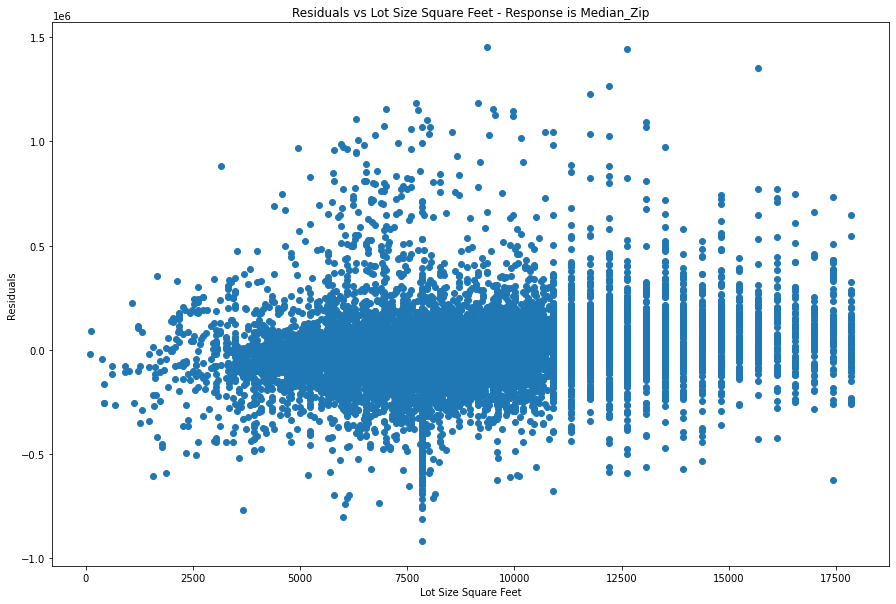

In [ ]:
x, y = np.array(df['median_zip']).reshape(-1,1), df['price']
z = np.array(df['lotSizeSqFt']).reshape(-1,1)

model = LinearRegression()
model.fit(x, y)

test_predictions = model.predict(x)

residuals = y - test_predictions

fig = plt.figure(figsize=(15,10))

# Add labels for x and y axes
plt.xlabel('Lot Size Square Feet')
plt.ylabel('Residuals')

# Add a title for the plot
plt.title('Residuals vs Lot Size Square Feet - Response is Median_Zip')

plt.scatter(z, residuals, label="sample");

Interesting how past a certain lot size, larger rounded numbers are used instead of specific numbers. There does seem to be a relationship here.

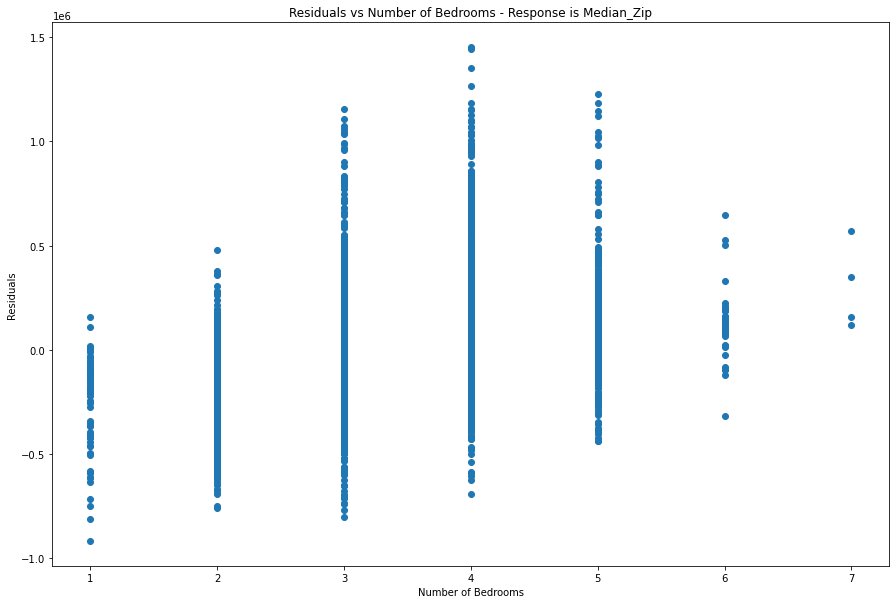

In [ ]:
x, y = np.array(df['median_zip']).reshape(-1,1), df['price']
z = np.array(df['numOfBedrooms']).reshape(-1,1)

model = LinearRegression()
model.fit(x, y)

test_predictions = model.predict(x)

residuals = y - test_predictions

fig = plt.figure(figsize=(15,10))

# Add labels for x and y axes
plt.xlabel('Number of Bedrooms')
plt.ylabel('Residuals')

# Add a title for the plot
plt.title('Residuals vs Number of Bedrooms - Response is Median_Zip')

plt.scatter(z, residuals, label="sample");

If we can see a pattern when we plot residuals vs a different predictor, it can tell us if a feature might add value to our model.

## Linear Regressions

### Basic Model Top Features Only

We're going to build our most baseline model using only the top three features -
    
    * zipcode
    * avgSchoolRating
    * livingAreaSqFt
    * numOfBathrooms
    * lotSizeSqFt

We can identify top features from our correlation heat map. Here's a reminder of the top:

#### One-Hot Encoded Categoricals

In [ ]:
# put together our basic feature set and preprocess

# one-hot encode categorical
base_cat = pd.DataFrame()
base_cat['zipcode'] = df['zipcode']
base_cat['zipcode'] = base_cat['zipcode'].astype('category')
base_cat_processed = pd.get_dummies(base_cat['zipcode'], prefix='zipcode', drop_first=True)
base_cat_processed.reset_index(inplace=True)
base_cat_processed.drop('index', axis=1, inplace=True)

# log transform and standard scale our continuous
base_cont = df[['avgSchoolRating', 'livingAreaSqFt', 'numOfBathrooms', 'lotSizeSqFt']]
base_cont = np.log(base_cont)
scaler = StandardScaler()
base_cont_processed = pd.DataFrame(scaler.fit_transform(base_cont),columns = base_cont.columns)

#join cat and cont into predictor data frame
x_base_set = base_cont_processed.join([base_cat_processed], how='inner')

# train/test split
x_base_train, x_base_test = train_test_split(x_base_set, test_size=0.2, random_state=randomstate)

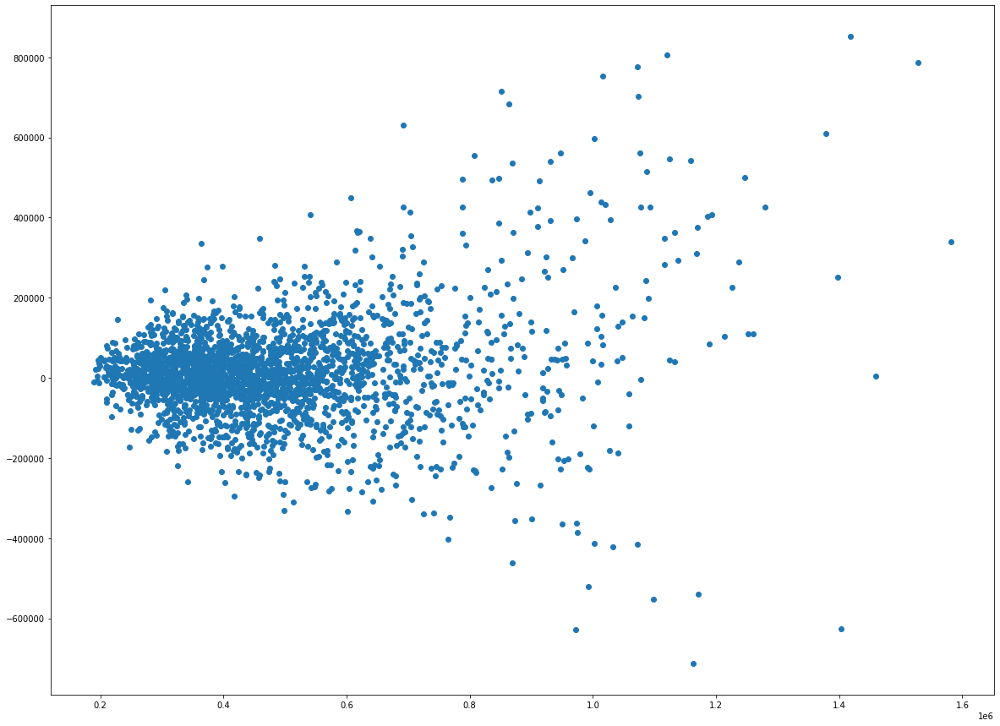

R2:  71.32 
MAE:  81867.41 
RMSE:  126034.88 
44 predictors used for this model


In [ ]:
model = LinearRegression()
make_model_log(model, x_base_train, x_base_test, y_train, y_test, 'Basic LR - Top Features Only, One-Hot')

Our baseline model has an R^2 of 71.3% on only a few features. Our MAE is pretty high. We will see if we can improve on that with some other feature selection methods, and even some other model types.

#### Target Encoded Categoricals

In [ ]:
# put together our basic feature set and preprocess

# log transform and standard scale our continuous
base_cont = train_data[['avgSchoolRating', 'livingAreaSqFt', 'numOfBathrooms', 'lotSizeSqFt', 'zip_smooth']]
base_cont = np.log(base_cont)
scaler = StandardScaler()
x_base_train = pd.DataFrame(scaler.fit_transform(base_cont),columns = base_cont.columns)


test_cont = holdout[['avgSchoolRating', 'livingAreaSqFt', 'numOfBathrooms', 'zip_smooth', 'zip_smooth']]
test_cont = np.log(test_cont)
scaler = StandardScaler()
x_base_test = pd.DataFrame(scaler.fit_transform(test_cont),columns = test_cont.columns)

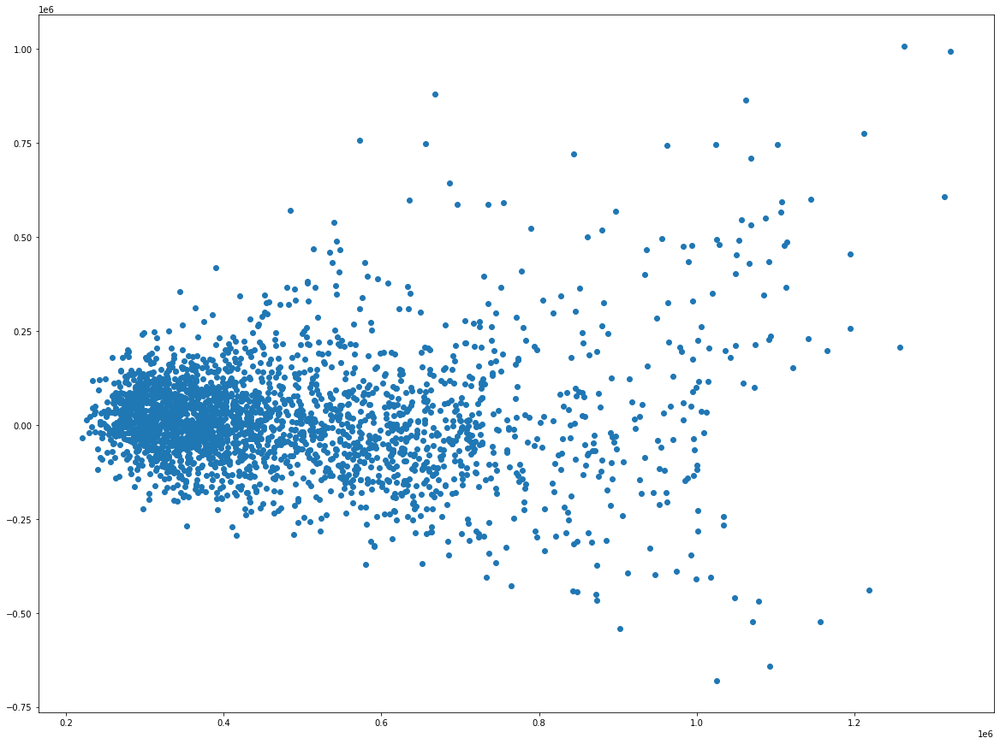

R2:  61.99 
MAE:  100869.56 
RMSE:  148486.63 
5 predictors used for this model


In [ ]:
model = LinearRegression()
make_model_log(model, x_base_train, x_base_test, y_train, y_test, 'Basic LR - Top Features Only, Target Encoded')

Our R-squared of 62% is much lower than when we used our zip code as categoricals.

### Linear Regression Model - ALL Features

#### One Hot Set

Run a base model with no cross-validation or specific feature selection with ALL possible features. We're going to use our one-hot encoded set which performed better in our first test.

In [ ]:
predictors_train = sm.add_constant(X_train_onehot)
model = sm.OLS(y_train, predictors_train).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.787
Model:                            OLS   Adj. R-squared:                  0.782
Method:                 Least Squares   F-statistic:                     133.1
Date:                Tue, 05 Oct 2021   Prob (F-statistic):               0.00
Time:                        15:02:48   Log-Likelihood:                 1948.7
No. Observations:               10489   AIC:                            -3327.
Df Residuals:                   10204   BIC:                            -1259.
Df Model:                         284                                         
Covariance Type:            nonrobust                                         
===========================================================================================
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                      12.5159      0.087    143.225      0.000      12.345      12.687
numPriceChanges            -0.0577      0.002    -27.187      0.000      -0.062      -0.054
lotSizeSqFt                 0.0256      0.003      9.541      0.000       0.020       0.031
livingAreaSqFt              0.2504      0.019     13.066      0.000       0.213       0.288
avgSchoolDistance           0.0095      0.003      3.257      0.001       0.004       0.015
avgSchoolRating             0.0542      0.005     11.592      0.000       0.045       0.063
avgSchoolSize              -0.0204      0.005     -4.138      0.000      -0.030      -0.011
numOfBedrooms            1.347e-05      0.003      0.004      0.997      -0.006       0.006
numOfStories               -0.0193      0.003     -7.141      0.000      -0.025      -0.014
numOfPhotos                 0.0183      0.002      7.693      0.000       0.014       0.023
numOfAppliances             0.0090      0.002      4.046      0.000       0.005       0.013
sqft-zip                   -0.2768      0.155     -1.787      0.074      -0.581       0.027
zipcode_78660               0.2627      0.080      3.297      0.001       0.106       0.419
zipcode_78701               1.1782      0.140      8.445      0.000       0.905       1.452
zipcode_78702               0.9233      0.141      6.527      0.000       0.646       1.201
zipcode_78703               1.8236      0.444      4.109      0.000       0.954       2.694
zipcode_78704               1.7189      0.431      3.992      0.000       0.875       2.563
zipcode_78705               1.0453      0.143      7.331      0.000       0.766       1.325
zipcode_78717               0.6608      0.083      7.959      0.000       0.498       0.824
zipcode_78721               0.5307      0.044     12.197      0.000       0.445       0.616
zipcode_78722               0.8261      0.118      7.017      0.000       0.595       1.057
zipcode_78723               0.6305      0.067      9.378      0.000       0.499       0.762
zipcode_78724               0.1170      0.050      2.357      0.018       0.020       0.214
zipcode_78725              -0.0676      0.055     -1.220      0.222      -0.176       0.041
zipcode_78726               0.5261      0.123      4.269      0.000       0.285       0.768
zipcode_78727               0.3660      0.032     11.437      0.000       0.303       0.429
zipcode_78728               0.2238      0.035      6.351      0.000       0.155       0.293
zipcode_78729               0.5449      0.047     11.700      0.000       0.454       0.636
zipcode_78730               0.9186      0.198      4.642      0.000       0.531       1.307
zipcode_78731               1.3381      0.327      4.089      0.000       0.697       1.980
zipcode_78732               0.6682      0.182  

There is a multicollinearity of features in our feature set somewhere. Let's check.

In [ ]:
#Get our list of highly correlated feature pairs with following steps:

# save correlation matrix as a new data frame
# converts all values to absolute value
# stacks the row:column pairs into a multindex
# reset the index to set the multindex to seperate columns
# sort values. 0 is the column automatically generated by the stacking
df_correlations = X_train_onehot.corr().abs().stack().reset_index().sort_values(0, ascending=False)

# zip the variable name columns in a new column named "pairs"
df_correlations['pairs'] = list(zip(df_correlations.level_0, df_correlations.level_1))

# set index to pairs
df_correlations.set_index(['pairs'], inplace = True)

# rename our results column to correlation
df_correlations.rename(columns={0: "correlation"}, inplace=True)

# Drop 1:1 correlations to get rid of self pairs
df_correlations.drop(df_correlations[df_correlations['correlation'] == 1.000000].index, inplace=True)

# view pairs above 75% correlation and below 90% correlation (engineered features will correlate with each other above 95%)
df_correlations[(df_correlations.correlation>.75) & (df_correlations.correlation<.95)]


,level_0,level_1,correlation
pairs,,,
"(mid, century)",mid,century,0.863632
"(century, mid)",century,mid,0.863632
"(formal dining, formal)",formal dining,formal,0.836051
"(formal, formal dining)",formal,formal dining,0.836051
"(storage building, building)",storage building,building,0.824998
"(building, storage building)",building,storage building,0.824998
"(propertyTaxRate_2.21, zipcode_78717)",propertyTaxRate_2.21,zipcode_78717,0.777428
"(zipcode_78717, propertyTaxRate_2.21)",zipcode_78717,propertyTaxRate_2.21,0.777428
"(sprinkler sys yes, yes)",sprinkler sys yes,yes,0.767296


The correlations it picked up are not circumstancial. However they are all NLP terms, and this is a problem with NLP.

There are a good number of features included in this model with a p-value over .05, meaning there is a greater than 5% chance that the results are due to randomness of the sample rather than the feature. A lot of our features have a very low p-value which indicates a very low chance that these results are not affected by the feature.

Now we perform cross-validation with our base model over 5 splits and get our mean R^2.

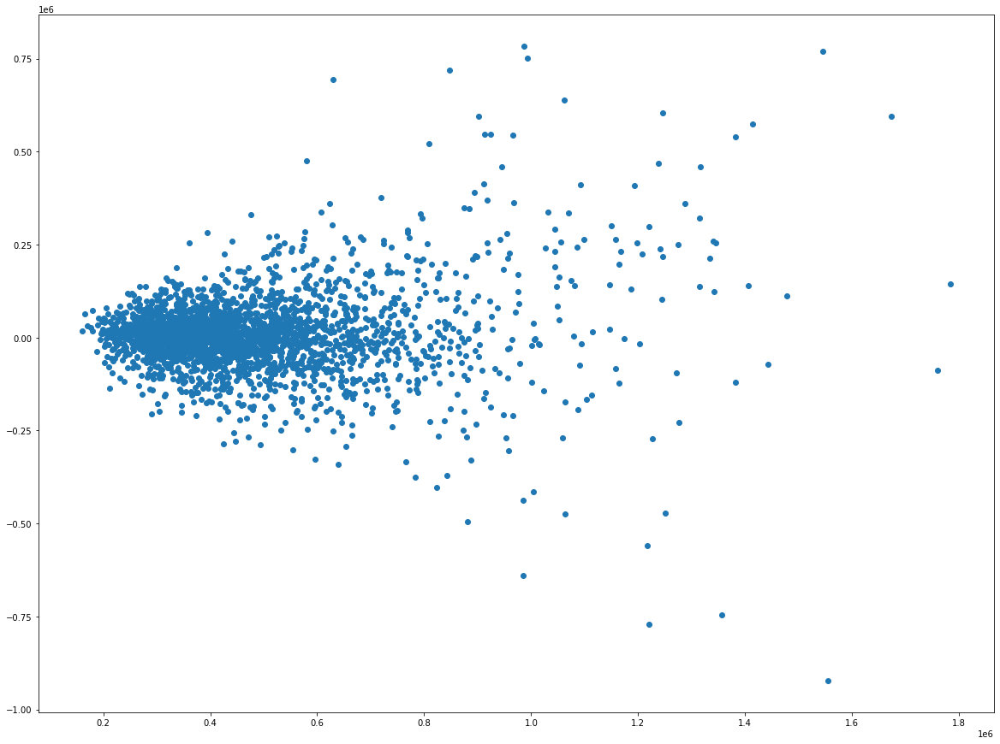

R2:  77.41 
MAE:  71513.72 
RMSE:  112360.81 
285 predictors used for this model


In [ ]:
model = LinearRegression()
make_model_log(model, X_train_onehot, X_test_onehot, y_train, y_test, 'LR All - One Hot')

##### Study Residuals

In [ ]:
# We need our statsmodels model again to plot residuals
predictors_train = sm.add_constant(X_train_onehot)
model = sm.OLS(y_train, predictors_train).fit()

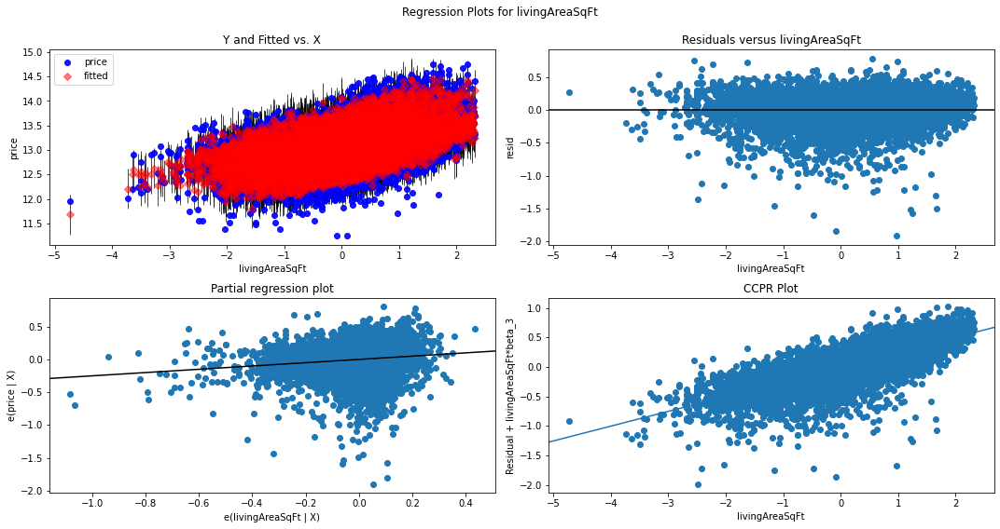

In [ ]:
fig = plt.figure(figsize=(15,8))
fig = sm.graphics.plot_regress_exog(model, "livingAreaSqFt", fig=fig)
plt.show()

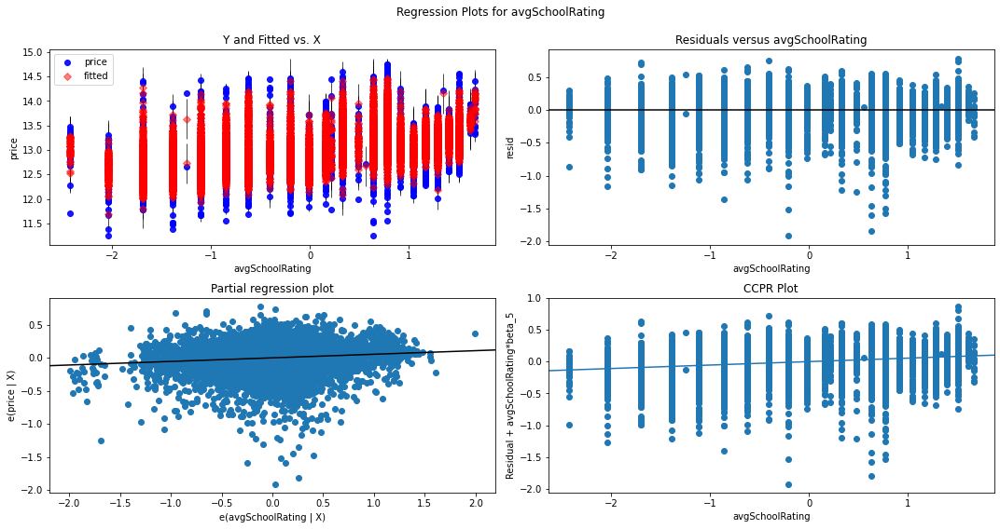

In [ ]:
fig = plt.figure(figsize=(15,8))
fig = sm.graphics.plot_regress_exog(model, "avgSchoolRating", fig=fig)
plt.show()

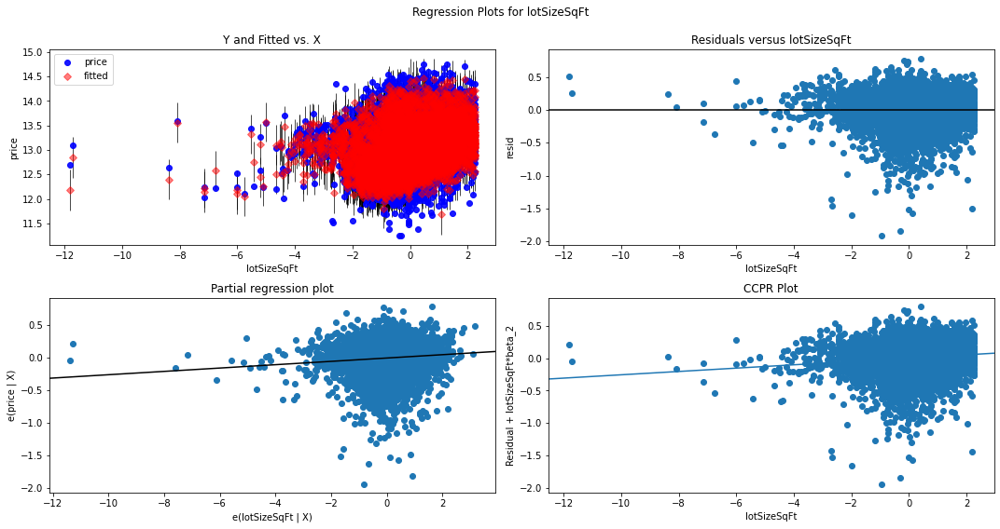

In [ ]:
fig = plt.figure(figsize=(15,8))
fig = sm.graphics.plot_regress_exog(model, "lotSizeSqFt", fig=fig)
plt.show()

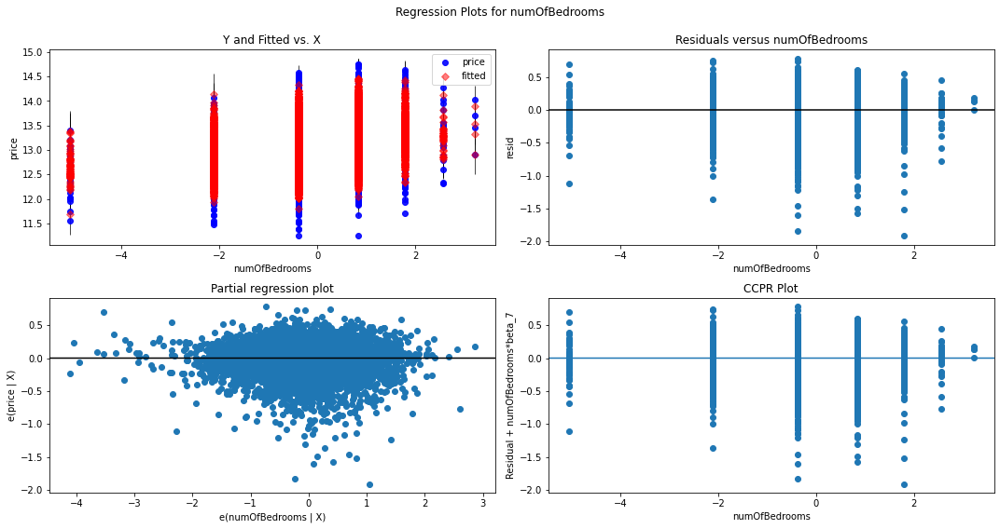

In [ ]:
fig = plt.figure(figsize=(15,8))
fig = sm.graphics.plot_regress_exog(model, "numOfBedrooms", fig=fig)
plt.show()

#### Target Encoded Categoricals

Run a base model with no cross-validation or specific feature selection with ALL possible features. We're using our target categorical encoded set which performed worse in our first test.

In [ ]:
predictors_train = sm.add_constant(X_train_encoded)
model = sm.OLS(y_train, predictors_train).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.747
Model:                            OLS   Adj. R-squared:                  0.741
Method:                 Least Squares   F-statistic:                     144.9
Date:                Tue, 05 Oct 2021   Prob (F-statistic):               0.00
Time:                        15:03:03   Log-Likelihood:                 1025.7
No. Observations:               10489   AIC:                            -1631.
Df Residuals:                   10279   BIC:                            -107.2
Df Model:                         209                                         
Covariance Type:            nonrobust                                         
===========================================================================================
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                      12.9648      0.046    281.688      0.000      12.875      13.055
numPriceChanges            -0.0545      0.002    -23.907      0.000      -0.059      -0.050
lotSizeSqFt                 0.0176      0.003      6.505      0.000       0.012       0.023
livingAreaSqFt              0.2183      0.020     11.117      0.000       0.180       0.257
avgSchoolDistance          -0.0103      0.003     -3.955      0.000      -0.015      -0.005
avgSchoolRating             0.0647      0.004     17.840      0.000       0.058       0.072
avgSchoolSize              -0.0525      0.003    -15.131      0.000      -0.059      -0.046
numOfBedrooms              -0.0112      0.003     -3.326      0.001      -0.018      -0.005
numOfStories               -0.0117      0.003     -4.092      0.000      -0.017      -0.006
numOfPhotos                 0.0149      0.003      5.791      0.000       0.010       0.020
numOfAppliances             0.0120      0.002      4.972      0.000       0.007       0.017
zip_smooth                  0.2188      0.153      1.427      0.154      -0.082       0.519
year_smooth                 0.0438      0.003     17.491      0.000       0.039       0.049
month_smooth                0.0382      0.002     16.302      0.000       0.034       0.043
lat_long                    0.0368      0.004     10.133      0.000       0.030       0.044
sqft-zip                   -0.0676      0.159     -0.424      0.671      -0.380       0.245
month1                     -0.0051      0.003     -1.932      0.053      -0.010    7.43e-05
hasAssociation_1           -0.1190      0.006    -18.673      0.000      -0.132      -0.107
hasCooling_1               -0.0420      0.025     -1.700      0.089      -0.091       0.006
hasHeating_1                0.0588      0.033      1.795      0.073      -0.005       0.123
hasSpa_1                    0.0299      0.010      3.134      0.002       0.011       0.049
hasView_1                   0.0055      0.006      0.961      0.336      -0.006       0.017
accessibility_1             0.0769      0.025      3.078      0.002       0.028       0.126
patioporch_1                0.0359      0.006      5.997      0.000       0.024       0.048
numOfSchools_2              0.1474      0.043      3.466      0.001       0.064       0.231
numOfSchools_3              0.0455      0.038      1.198      0.231      -0.029       0.120
numOfSchools_4             -0.0707      0.040     -1.784      0.074      -0.148       0.007
security_1                  0.0076      0.006      1.244      0.214      -0.004       0.020
waterfront_1                0.1225      0.065      1.892      0.059      -0.004       0.249
windowfeatures_1           -0.0035      0.007     -0.514      0.607      -0.017       0.010
community_1                -0.0299      0.022  

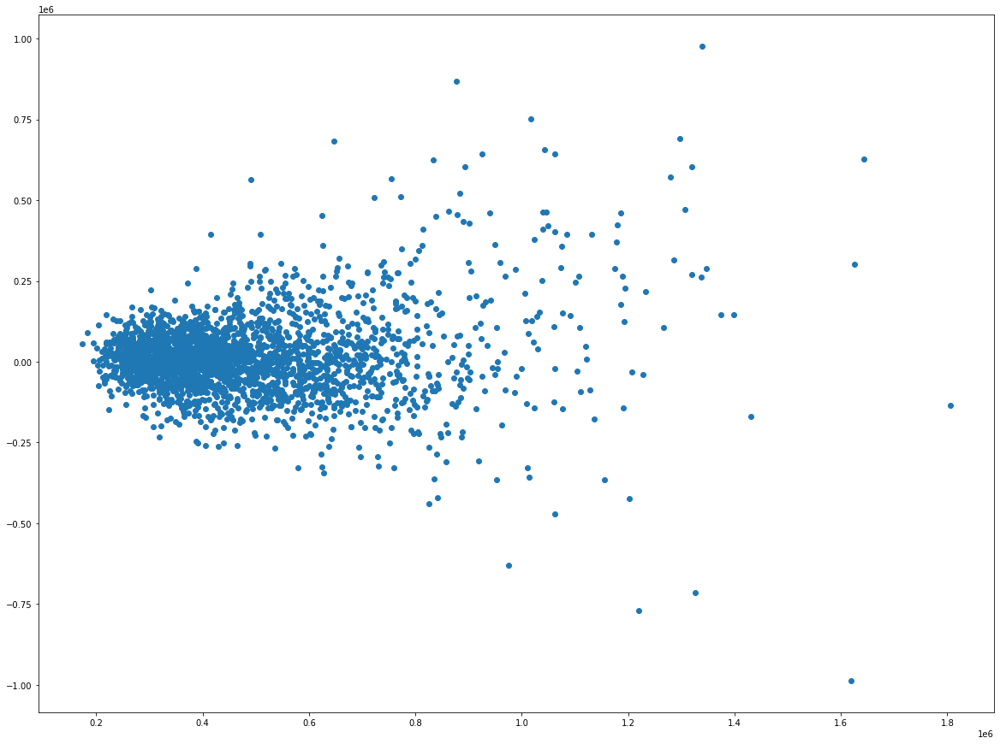

R2:  -2.981080444850777e+20 
MAE:  81398.01 
RMSE:  123291.72 
210 predictors used for this model


In [ ]:
model = LinearRegression()
make_model_log(model, X_train_encoded, X_test_encoded, y_train, y_test, 'LR All - Encoded')

## Linear Regression - Feature Selectors

Feature selectors are different methods to help us pick which features we want to use in our model. In our example above where we used ALL predictors in our linear regression, several of our features had a p-value over .05, which indicates that there is more than a 5% chance that the changes attributed to that feature were actually by random chance. We want features where our p-value is below a threshold that we specify where we are reasonably confident that the feature is contributing to the model and not by random chance.

### Permutation Importance

We're running permutation importance again, this time using the entire model predictors.

In [ ]:
model = LinearRegression()
model.fit(X_train_onehot, y_train)

from sklearn.inspection import permutation_importance
r = permutation_importance(model, X_train_onehot, y_train,
                           n_repeats=15,
                            random_state=0,
                          n_jobs=-1)

for i in r.importances_mean.argsort()[::-1]:
    if r.importances_mean[i] >= 0.001:
        print(f"{X_train_onehot.columns[i]:<8} "
            f"\t\tImportance: {r.importances_mean[i]:.3f} ")

importances = {}

for i in r.importances_mean.argsort()[::-1]:
    if r.importances_mean[i] >= 0.001:
        importances[X_train_onehot.columns[i]] = r.importances_mean[i]
    else: continue

importances

important_features_again = list(importances.keys())
print(important_features_again)

zipcode_78704 		Importance: 1.437 
sqft-zip 		Importance: 0.806 
livingAreaSqFt 		Importance: 0.661 
zipcode_78703 		Importance: 0.646 
zipcode_78731 		Importance: 0.550 
zipcode_78757 		Importance: 0.333 
zipcode_78702 		Importance: 0.244 
zipcode_78759 		Importance: 0.236 
zipcode_78739 		Importance: 0.205 
zipcode_78746 		Importance: 0.177 
zipcode_78717 		Importance: 0.172 
zipcode_78732 		Importance: 0.165 
zipcode_78750 		Importance: 0.152 
zipcode_78723 		Importance: 0.150 
zipcode_78756 		Importance: 0.137 
zipcode_78735 		Importance: 0.119 
zipcode_78751 		Importance: 0.104 
zipcode_78749 		Importance: 0.102 
zipcode_78745 		Importance: 0.094 
zipcode_78733 		Importance: 0.084 
zipcode_78737 		Importance: 0.079 
zipcode_78730 		Importance: 0.069 
zipcode_78729 		Importance: 0.068 
zipcode_78722 		Importance: 0.055 
propertyTaxRate_2.21 		Importance: 0.054 
zipcode_78721 		Importance: 0.050 
zipcode_78705 		Importance: 0.049 
zipcode_78727 		Importance: 0.040 
zipcode_78726 		I

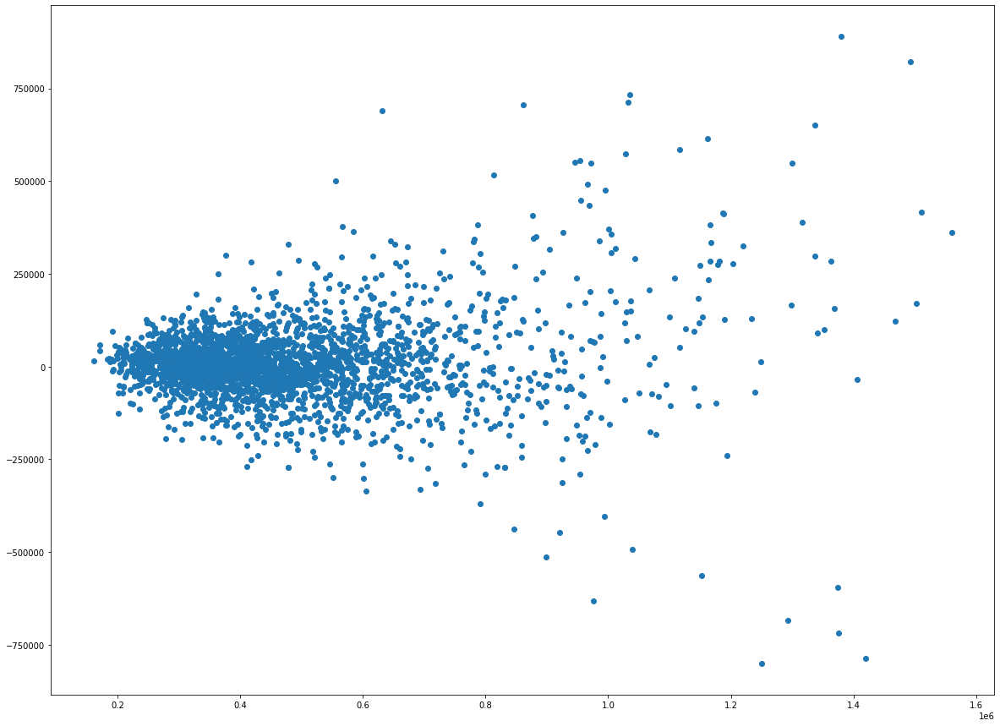

R2:  76.79 
MAE:  73547.43 
RMSE:  115514.83 
99 predictors used for this model


In [ ]:
permutation_x_train = X_train_onehot[important_features_again]
permutation_x_test = X_test_onehot[important_features_again]

model = LinearRegression()
make_model_log(model, permutation_x_train, permutation_x_test, y_train, y_test, 'LR w/Permutation Importance')

### Forward-Backward Selector

Now we'll try a simple forward-backward feature selection model based on p-value, using a statsmodel OLS linear regression model. This selector starts with zero features, internally runs the model for each feature individually, and adds the lowest p-value feature to its list to include. It then runs the model again with the original feature included and tries adding each other feature individually. It will either add the next best feature under the threshold or remove an existing feature if it is no longer within the threshold. This process iterates until all features in the model are under the p-value threshold.

This model takes quite some time to run, so is commented out with the results replicated in markdown following.

In [ ]:
def stepwise_selection(X, y,
                       initial_list=[],
                       threshold_in=0.01,
                       threshold_out = 0.05,
                       verbose=True):
    """
    Perform a forward-backward feature selection
    based on p-value from statsmodels.api.OLS
    Arguments:
        X - pandas.DataFrame with candidate features
        y - list-like with the target
        initial_list - list of features to start with (column names of X)
        threshold_in - include a feature if its p-value < threshold_in
        threshold_out - exclude a feature if its p-value > threshold_out
        verbose - whether to print the sequence of inclusions and exclusions
    Returns: list of selected features
    Always set threshold_in < threshold_out to avoid infinite looping.
    See https://en.wikipedia.org/wiki/Stepwise_regression for the details
    """
    included = list(initial_list)
    while True:
        changed=False
        # forward step
        excluded = list(set(X.columns)-set(included))
        new_pval = pd.Series(index=excluded)
        for new_column in excluded:
            model = sm.OLS(y, sm.add_constant(pd.DataFrame(X[included+[new_column]]))).fit()
            new_pval[new_column] = model.pvalues[new_column]
        best_pval = new_pval.min()
        if best_pval < threshold_in:
            best_feature = new_pval.idxmin()
            included.append(best_feature)
            changed=True
            if verbose:
                print('Add  {:30} with p-value {:.6}'.format(best_feature, best_pval))

        # backward step
        model = sm.OLS(y, sm.add_constant(pd.DataFrame(X[included]))).fit()
        # use all coefs except intercept
        pvalues = model.pvalues.iloc[1:]
        worst_pval = pvalues.max() # null if pvalues is empty
        if worst_pval > threshold_out:
            changed=True
            worst_feature = included[pvalues.argmax()]
            included.remove(worst_feature)
            if verbose:
                print('Drop {:30} with p-value {:.6}'.format(worst_feature, worst_pval))
        if not changed:
            break
    return included


In [ ]:
result = stepwise_selection(X_train_onehot, y_train, verbose=True)

print('resulting features:', result)

Add  avgSchoolRating                with p-value 0.0
Add  livingAreaSqFt                 with p-value 0.0
Add  hasAssociation_1               with p-value 0.0
Add  zipcode_78704                  with p-value 0.0
Add  sqft-zip                       with p-value 0.0
Drop zipcode_78704                  with p-value 0.812607
Add  numPriceChanges                with p-value 1.55248e-108
Add  zipcode_78745                  with p-value 3.23975e-48
Add  zipcode_78748                  with p-value 5.65847e-66
Add  avgSchoolSize                  with p-value 6.36793e-66
Add  propertyTaxRate_2.01           with p-value 3.72677e-50
Add  zipcode_78732                  with p-value 5.23068e-36
Add  propertyTaxRate_2.21           with p-value 1.91901e-40
Add  zipcode_78739                  with p-value 1.57029e-36
Add  year_block_30                  with p-value 1.25387e-29
Add  year_block_29                  with p-value 6.59211e-28
Add  year_block_28                  with p-value 3.9278e-28
Add  z

In [ ]:
# Run our linear regression again, using only the features recommended by our feature selector

X_train_refined = X_train_onehot[result]
X_test_refined = X_test_onehot[result]

predictors_int = sm.add_constant(X_train_refined)
model = sm.OLS(y_train, predictors_int).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.777
Model:                            OLS   Adj. R-squared:                  0.775
Method:                 Least Squares   F-statistic:                     368.8
Date:                Tue, 05 Oct 2021   Prob (F-statistic):               0.00
Time:                        15:32:20   Log-Likelihood:                 1690.3
No. Observations:               10489   AIC:                            -3183.
Df Residuals:                   10390   BIC:                            -2464.
Df Model:                          98                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   13.0080      0.008   1570.411      0.000      12.992      13.024
avgSchoolRating          0.0697      0.004     16.498      0.000       0.061       0.078
livingAreaSqFt           0.1964      0.004     54.003      0.000       0.189       0.204
hasAssociation_1        -0.0780      0.006    -12.944      0.000      -0.090      -0.066
sqft-zip                 0.2137      0.006     37.940      0.000       0.203       0.225
numPriceChanges         -0.0570      0.002    -27.033      0.000      -0.061      -0.053
zipcode_78745            0.2053      0.011     19.246      0.000       0.184       0.226
zipcode_78748            0.1556      0.011     14.231      0.000       0.134       0.177
avgSchoolSize           -0.0356      0.004     -8.257      0.000      -0.044      -0.027
zipcode_78732           -0.2129      0.013    -16.556      0.000      -0.238      -0.188
propertyTaxRate_2.21    -0.3082      0.034     -8.970      0.000      -0.376      -0.241
zipcode_78739           -0.1433      0.012    -11.669      0.000      -0.167      -0.119
year_block_30            0.1591      0.015     10.671      0.000       0.130       0.188
year_block_29            0.1295      0.012     10.736      0.000       0.106       0.153
year_block_28            0.1213      0.011     10.874      0.000       0.099       0.143
zipcode_78754           -0.1568      0.015    -10.240      0.000      -0.187      -0.127
zipcode_78726           -0.1633      0.019     -8.408      0.000      -0.201      -0.125
great                   -0.2235      0.042     -5.375      0.000      -0.305      -0.142
numOfStories            -0.0218      0.003     -8.487      0.000      -0.027      -0.017
design                   0.4420      0.063      7.041      0.000       0.319       0.565
patioporch_1             0.0424      0.005      9.342      0.000       0.033       0.051
zipcode_78705            0.3852      0.032     11.914      0.000       0.322       0.449
quartz                   0.4203      0.064      6.571      0.000       0.295       0.546
latest_salemonth_12     -0.1207      0.009    -14.065      0.000      -0.137      -0.104
latest_salemonth_11     -0.1238      0.009    -14.372      0.000      -0.141      -0.107
hasSpa_1                 0.0426      0.009      4.854      0.000       0.025       0.060
zipcode_78756            0.2694      0.022     12.429      0.000       0.227       0.312
latest_salemonth_10     -0.0947      0.008    -11.591      0.000      -0.111      -0.079
zipcode_78660           -0.2257      0.040     -5.594      0.000      -0.305      -0.147
zipcode_78725           -0.1957      0.022     -8.817      0.000      -0.239      -0.152
year_block_27            0.1032      0.015      7.081      0.000       0.075       0.132
latest_salemonth_9      -0.0833      0.008    -10.331    

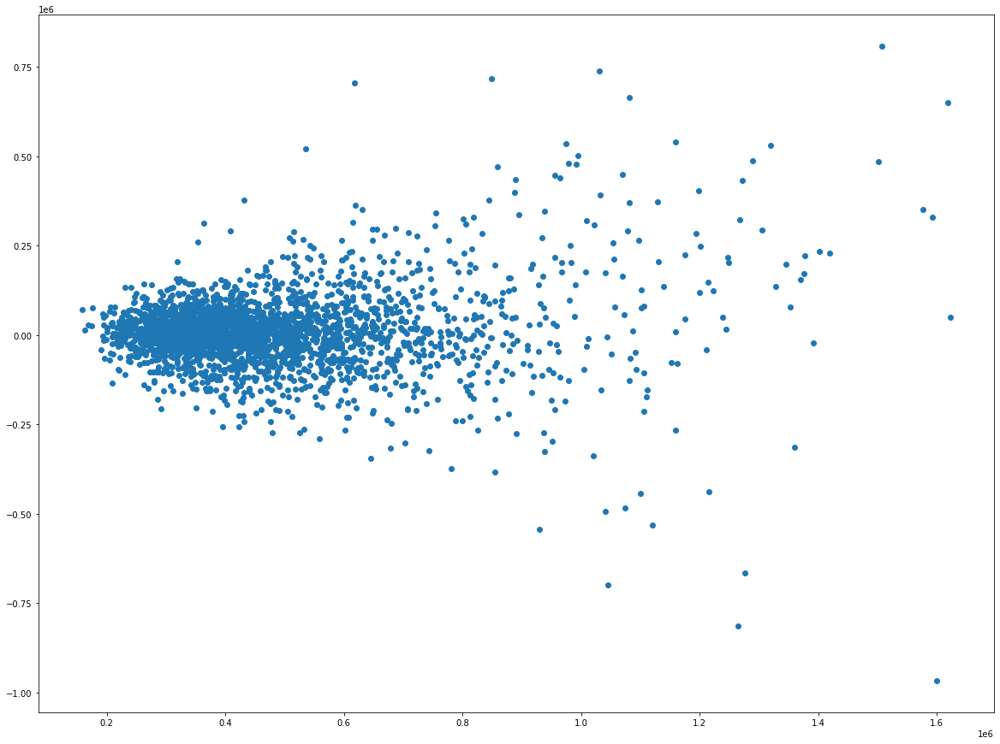

R2:  77.16 
MAE:  71545.24 
RMSE:  111757.54 
98 predictors used for this model


In [ ]:
model = LinearRegression()
make_model_log(model, X_train_refined, X_test_refined, y_train, y_test, 'LR w/Forward-Backward Selector')

### Recursive Feature Elimination with Cross Validation - Linear Regression

RFECV is a reverse forward-backward selector. It starts the model with all features in use then removes the weakest one, and iterates until the best feature set is found. It uses integrated cross-validation to determine the optimal set of features in the model with the best cross-validated score. We score on mean absolute error.

In [ ]:
# Using sklearn RFECV to perform integrated CV while picking the number of features
# picks the number of features itself

model = LinearRegression(n_jobs=-4)
cv = RepeatedKFold(n_splits=5, n_repeats=2, random_state=1)

rfecv = RFECV(estimator=model, step=1, cv=cv, scoring='neg_mean_absolute_error', n_jobs=-4)

# fit model to train set
rfecv.fit(X_train_onehot, y_train)

# print optimal number of features
print('Optimal number of features: {}'.format(rfecv.n_features_))

Optimal number of features: 281


In [ ]:
dset = pd.DataFrame()
dset['attr'] = X_train_onehot.columns
dset['used'] = rfecv.support_

# make a list of the features used in the rfecv
rfecv_result = list(dset[(dset['used'] == True)]['attr'])

# Show the features that RFECV did not use
dset[dset['used']==False]

,attr,used
6,numOfBedrooms,False
78,year_block_29,False
153,formal,False
188,hardwood,False


In [ ]:
# Run our linear regression again in statsmodels, using the features recommended by our feature selector

X_train_rfecv = X_train_onehot[rfecv_result]
X_test_rfecv = X_test_onehot[rfecv_result]

predictors_int = sm.add_constant(X_train_rfecv)
model = sm.OLS(y_train, predictors_int).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.787
Model:                            OLS   Adj. R-squared:                  0.782
Method:                 Least Squares   F-statistic:                     135.1
Date:                Tue, 05 Oct 2021   Prob (F-statistic):               0.00
Time:                        15:38:12   Log-Likelihood:                 1948.7
No. Observations:               10489   AIC:                            -3335.
Df Residuals:                   10208   BIC:                            -1296.
Df Model:                         280                                         
Covariance Type:            nonrobust                                         
===========================================================================================
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                      12.5157      0.087    143.518      0.000      12.345      12.687
numPriceChanges            -0.0577      0.002    -27.237      0.000      -0.062      -0.054
lotSizeSqFt                 0.0256      0.003      9.559      0.000       0.020       0.031
livingAreaSqFt              0.2501      0.019     13.471      0.000       0.214       0.286
avgSchoolDistance           0.0095      0.003      3.255      0.001       0.004       0.015
avgSchoolRating             0.0543      0.005     11.617      0.000       0.045       0.063
avgSchoolSize              -0.0204      0.005     -4.149      0.000      -0.030      -0.011
numOfStories               -0.0194      0.003     -7.182      0.000      -0.025      -0.014
numOfPhotos                 0.0183      0.002      7.695      0.000       0.014       0.023
numOfAppliances             0.0090      0.002      4.045      0.000       0.005       0.013
sqft-zip                   -0.2745      0.153     -1.790      0.074      -0.575       0.026
zipcode_78660               0.2615      0.079      3.309      0.001       0.107       0.416
zipcode_78701               1.1767      0.139      8.467      0.000       0.904       1.449
zipcode_78702               0.9215      0.140      6.562      0.000       0.646       1.197
zipcode_78703               1.8174      0.440      4.131      0.000       0.955       2.680
zipcode_78704               1.7126      0.427      4.015      0.000       0.877       2.549
zipcode_78705               1.0440      0.142      7.355      0.000       0.766       1.322
zipcode_78717               0.6599      0.083      7.988      0.000       0.498       0.822
zipcode_78721               0.5303      0.043     12.220      0.000       0.445       0.615
zipcode_78722               0.8248      0.117      7.046      0.000       0.595       1.054
zipcode_78723               0.6298      0.067      9.417      0.000       0.499       0.761
zipcode_78724               0.1174      0.049      2.377      0.017       0.021       0.214
zipcode_78725              -0.0669      0.055     -1.216      0.224      -0.175       0.041
zipcode_78726               0.5244      0.122      4.290      0.000       0.285       0.764
zipcode_78727               0.3659      0.032     11.439      0.000       0.303       0.429
zipcode_78728               0.2240      0.035      6.373      0.000       0.155       0.293
zipcode_78729               0.5450      0.047     11.712      0.000       0.454       0.636
zipcode_78730               0.9158      0.196      4.666      0.000       0.531       1.300
zipcode_78731               1.3334      0.324      4.112      0.000       0.698       1.969
zipcode_78732               0.6655      0.181      3.684      0.000       0.311       1.020
zipcode_78733               0.9563      0.199  

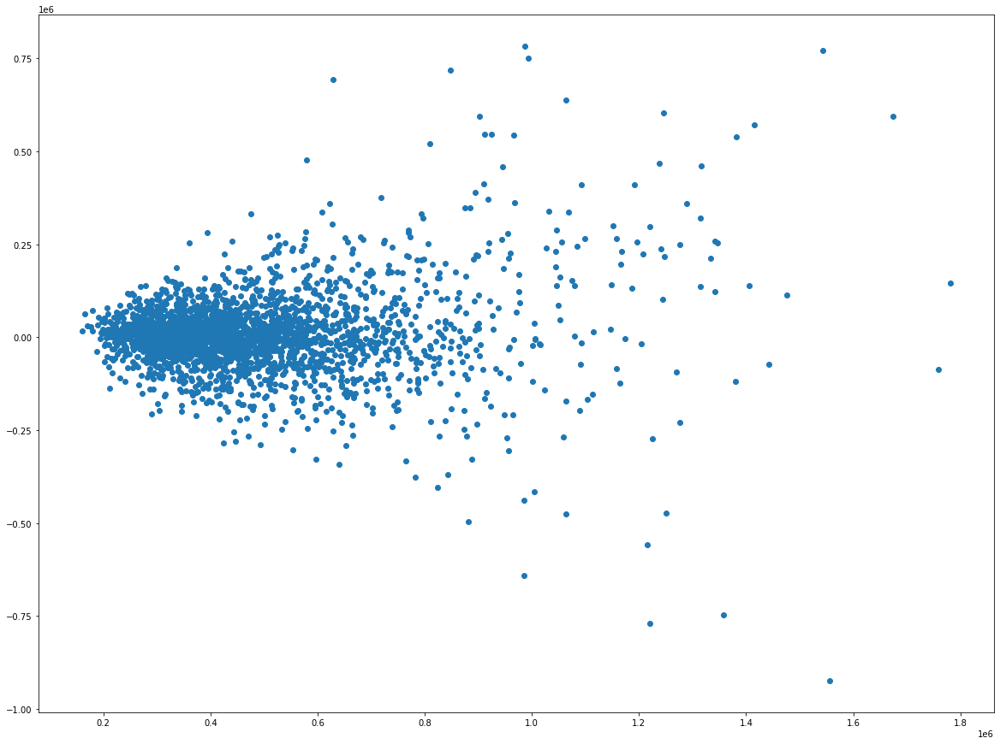

R2:  77.46 
MAE:  71510.21 
RMSE:  112359.4 
281 predictors used for this model


In [ ]:
model = LinearRegression()
model.fit(X_train_rfecv, y_train)

make_model_log(model, X_train_rfecv, X_test_rfecv, y_train, y_test, 'LR w/RFECV')

RFECV still includes features with a p-value over .05. Overall though, accuracy is higher than other feature selection methods.


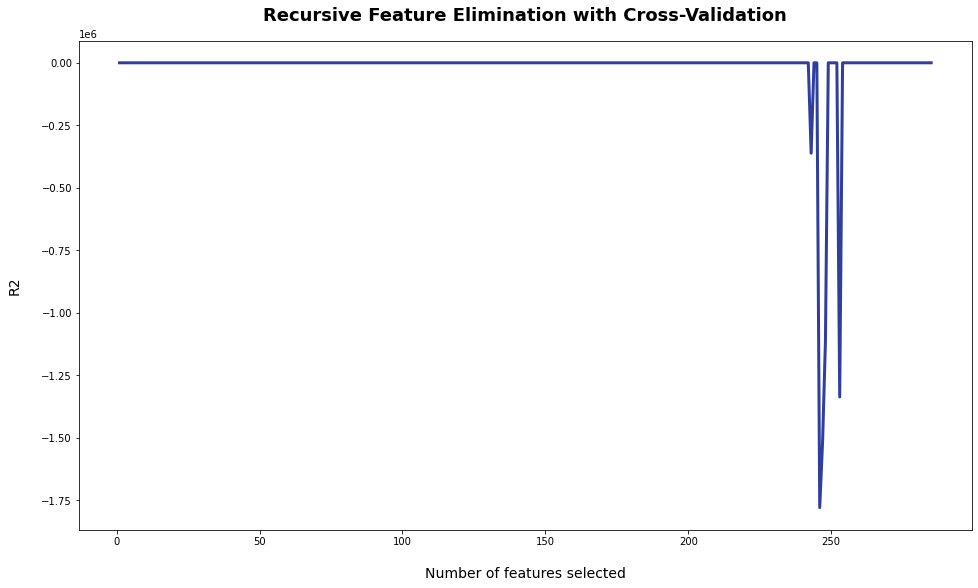

In [ ]:
plt.figure(figsize=(16, 9))
plt.title('Recursive Feature Elimination with Cross-Validation', fontsize=18, fontweight='bold', pad=20)
plt.xlabel('Number of features selected', fontsize=14, labelpad=20)
plt.ylabel('R2', fontsize=14, labelpad=20)
plt.plot(range(1, len(rfecv.grid_scores_) + 1), rfecv.grid_scores_, color='#303F9F', linewidth=3)

plt.show()

## Regularization Models

BIC alpha: 0.0001
AIC alpha: 0.0


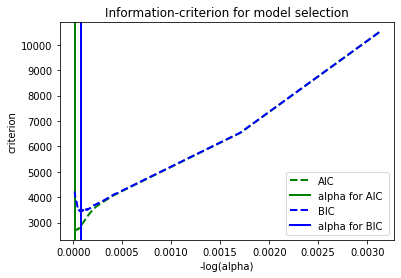

In [ ]:
from sklearn.linear_model import Lasso, LassoCV, LassoLarsCV, LassoLarsIC

model_bic = LassoLarsIC(criterion='bic')
model_bic.fit(X_train_onehot, y_train)
alpha_bic_ = model_bic.alpha_
print("BIC alpha:", round(model_bic.alpha_,4))

model_aic = LassoLarsIC(criterion='aic')
model_aic.fit(X_train_onehot, y_train)
alpha_aic_ = model_aic.alpha_
print("AIC alpha:", round(model_aic.alpha_, 4))


def plot_ic_criterion(model, name, color):
    alpha_ = model.alpha_
    alphas_ = model.alphas_
    criterion_ = model.criterion_
    plt.plot((alphas_), criterion_, '--', color=color, linewidth=2, label= name)
    plt.axvline((alpha_), color=color, linewidth=2,
                label='alpha for %s ' % name)
    plt.xlabel('-log(alpha)')
    plt.ylabel('criterion')

plt.figure()
plot_ic_criterion(model_aic, 'AIC', 'green')
plot_ic_criterion(model_bic, 'BIC', 'blue')
plt.legend()
plt.title('Information-criterion for model selection');

Optimal Alpha Value: 0


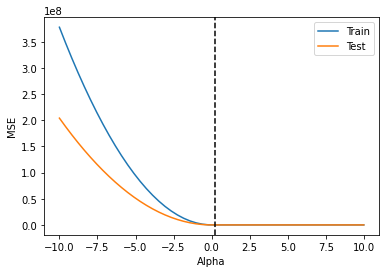

In [ ]:
train_mse = []
test_mse = []
alphas = []

for alpha in np.linspace(-10, 10, num=50):
    lasso = Lasso(alpha=alpha)
    lasso.fit(X_train_onehot, y_train)

    train_preds = lasso.predict(X_train_onehot)
    train_mse.append(mean_squared_error(y_train, train_preds))

    test_preds = lasso.predict(X_test_onehot)
    test_mse.append(mean_squared_error(y_test, test_preds))

    alphas.append(alpha)
import matplotlib.pyplot as plt
%matplotlib inline

fig, ax = plt.subplots()
ax.plot(alphas, train_mse, label='Train')
ax.plot(alphas, test_mse, label='Test')
ax.set_xlabel('Alpha')
ax.set_ylabel('MSE')

# np.argmin() returns the index of the minimum value in a list
optimal_alpha = alphas[np.argmin(test_mse)]

# Add a vertical line where the test MSE is minimized
ax.axvline(optimal_alpha, color='black', linestyle='--')
ax.legend();

print(f'Optimal Alpha Value: {int(optimal_alpha)}')

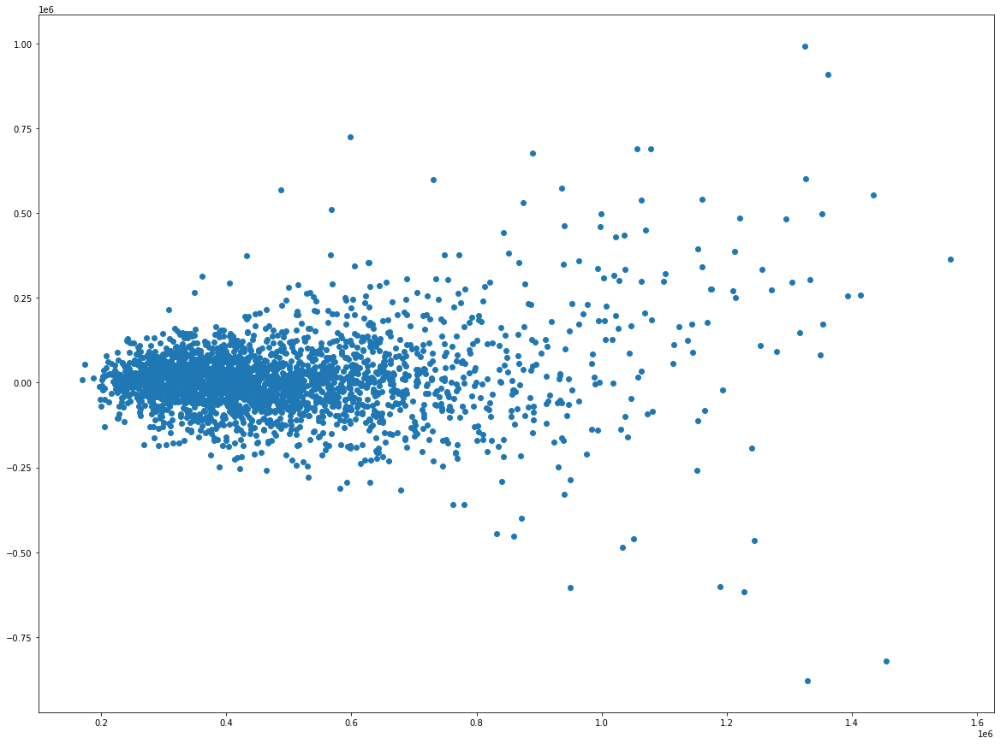

R2:  76.04 
MAE:  74124.95 
RMSE:  116235.12 
285 predictors used for this model
The optimal alpha for the Lasso Regression is:  0.0003196793821232772


In [ ]:
lasso = LassoCV(max_iter=100000, cv=5)
lasso.fit(X_train_onehot, y_train)

make_model_log(lasso, X_train_onehot, X_test_onehot, y_train, y_test, 'Lasso')

print('The optimal alpha for the Lasso Regression is: ', lasso.alpha_)

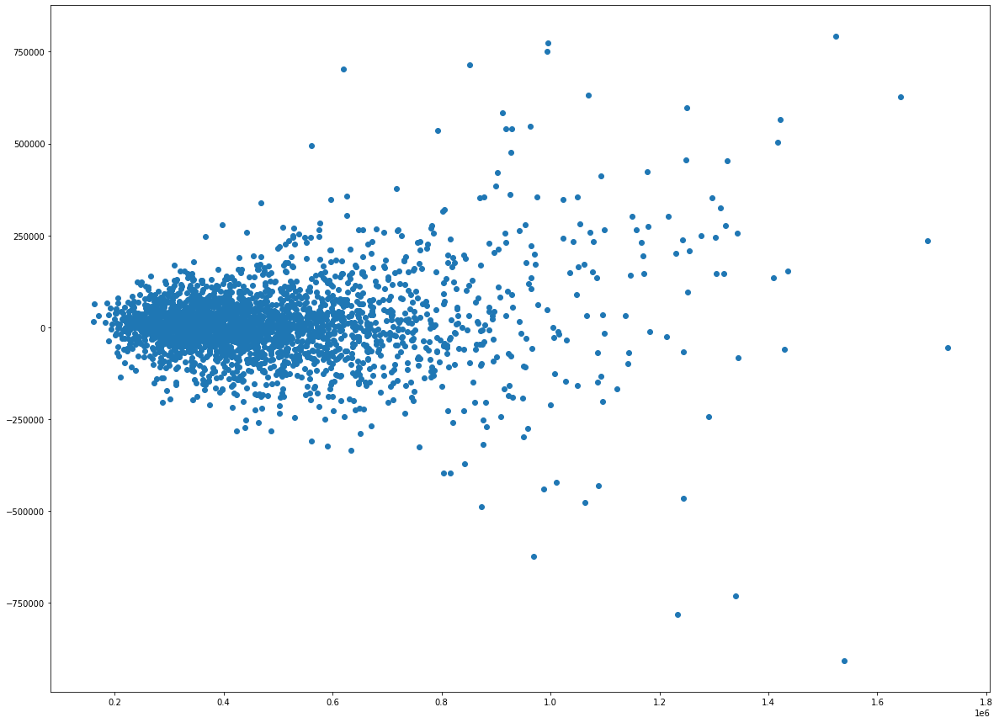

R2:  77.47 
MAE:  71298.55 
RMSE:  111843.75 
285 predictors used for this model
The optimal alpha for the Ridge Regression is:  1.0


In [ ]:
ridge = RidgeCV(cv=5, alphas=(.01, .05,.1, .5, 1, 10))
ridge.fit(X_train_onehot, y_train)

make_model_log(ridge, X_train_onehot, X_test_onehot, y_train, y_test, 'Ridge')

print('The optimal alpha for the Ridge Regression is: ', ridge.alpha_)

## K-Nearest Neighbors Model

K-Nearest Neighbors is more commonly used for classification. Its basic premise is to determine "what is this like" in making a prediction, by looking at other things that are close in value/type. We can pick how many neighbors it assesses to make a classification. As we will see, it doesn't work very well for this type of application (or, I've not tuned the hyperparameters properly and/or don't know how to use it well).

We're using our target encoded data set on this.

MAE value for k=  1 is: 0.2209974111161632
MAE value for k=  2 is: 0.197164366429133
MAE value for k=  3 is: 0.18763918813447053
MAE value for k=  4 is: 0.1824450823657538
MAE value for k=  5 is: 0.1793465425647837
MAE value for k=  6 is: 0.17746765926213434
MAE value for k=  7 is: 0.17584927095089037
MAE value for k=  8 is: 0.1748634956844429
MAE value for k=  9 is: 0.1744180010564643
MAE value for k=  10 is: 0.173690403275999
MAE value for k=  11 is: 0.17320904925166347
MAE value for k=  12 is: 0.17362996728274868
MAE value for k=  13 is: 0.1733949181428589
MAE value for k=  14 is: 0.1738721228804574
MAE value for k=  15 is: 0.17361498319133858
MAE value for k=  16 is: 0.17368564040030768
MAE value for k=  17 is: 0.174158683472365
MAE value for k=  18 is: 0.17439031494669907
MAE value for k=  19 is: 0.1740372573342739
MAE value for k=  20 is: 0.174255472175735


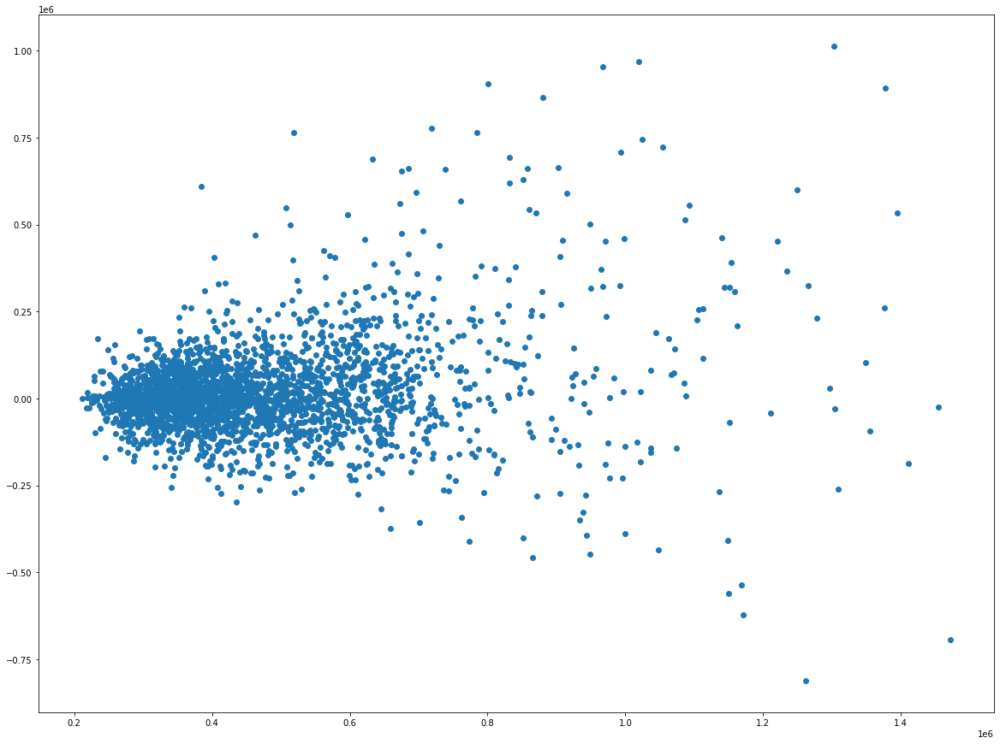

R2:  69.31 
MAE:  87579.03 
RMSE:  139224.82 
210 predictors used for this model


In [ ]:
mae_val = [] #to store mae values for different k

# checks mean absolute error scores on k from 1 to 20
for K in range(20):
    K = K+1

    # set up the KNN regressor
    model = neighbors.KNeighborsRegressor(n_neighbors = K)

    model.fit(X_train_encoded, y_train)  #fit the model
    pred=model.predict(X_test_encoded) #make prediction on test set
    error = mean_absolute_error(y_test,pred) #calculate rmse
    mae_val.append(error) #store mae values
    print('MAE value for k= ' , K , 'is:', error)

# gets optimal k-value based on score minimum
index_min = np.argmin(mae_val) + 1

# makes model and fits using optimal k
model = neighbors.KNeighborsRegressor(n_neighbors = index_min)
make_model_log(model, X_train_encoded, X_test_encoded, y_train, y_test, 'KNN')

## Support Vector Regression

Support vector regression is a form of regression that allows us to define the acceptable error in our model and then finds the line that best fits the data, according to our specifications. This is really useful with something like housing price predictions, where we are ok with our prediction being within a certain dollar amount. SVR will attempt to get all of the predictions within that dollar amount when possible. This will result in a fit line that is different than a linear regression would have produced, but should result in a lower absolute error, which is a reasonable scoring metric for housing price predictions.

We're going to use sklearn's GridSearchCV to find the optimal hyperparameters to use with our SVM! Here are the parameters we are trying out:

* kernel: linear is parametric, and rbf is non-parametric. One of these should perform better. Our data is not totally normal, so it might be rbf.
* epsilon: This value is how much error we're ok with accepting without assigning a penalty to the model
* C: The error that we will accept from a point outside our epsilon

Our C and epsilon need to be in scale with our output variable, which is our log-transformed price.


In [ ]:
'''# Parameter Tuning

param_grid = {'kernel' : ['linear', 'rbf'],
              'gamma' : ['scale', 'auto'],
              'C':[3,6,10],
              'epsilon':[.05, .1]
              }

svr = SVR(tol=.005, verbose=True)
grid_search = GridSearchCV(svr, param_grid, verbose=10, scoring='neg_mean_absolute_error', cv=5, n_jobs=-1)

grid_search.fit(X_train_onehot, y_train)

grid_search.best_estimator_

print("Best parameters set found on train set: \n")
print(grid_search.best_params_)
print("\nGrid scores on train set:\n")
means = grid_search.cv_results_['mean_test_score']
stds = grid_search.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, grid_search.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r"
              % (mean, std * 2, params))'''

'# Parameter Tuning\n\nparam_grid = {\'kernel\' : [\'linear\', \'rbf\'],\n              \'gamma\' : [\'scale\', \'auto\'],\n              \'C\':[3,6,10],\n              \'epsilon\':[.05, .1]\n              }\n\nsvr = SVR(tol=.005, verbose=True)\ngrid_search = GridSearchCV(svr, param_grid, verbose=10, scoring=\'neg_mean_absolute_error\', cv=5, n_jobs=-1)\n\ngrid_search.fit(X_train_onehot, y_train)\n\ngrid_search.best_estimator_\n\nprint("Best parameters set found on train set: \n")\nprint(grid_search.best_params_)\nprint("\nGrid scores on train set:\n")\nmeans = grid_search.cv_results_[\'mean_test_score\']\nstds = grid_search.cv_results_[\'std_test_score\']\nfor mean, std, params in zip(means, stds, grid_search.cv_results_[\'params\']):\n    print("%0.3f (+/-%0.03f) for %r"\n              % (mean, std * 2, params))'

Best parameters set found on train set:

    {'C': 10, 'epsilon': 0.05, 'gamma': 'auto', 'kernel': 'rbf'}

    Grid scores on train set:

    -0.141 (+/-0.004) for {'C': 3, 'epsilon': 0.05, 'gamma': 'scale', 'kernel': 'linear'}
    -0.144 (+/-0.004) for {'C': 3, 'epsilon': 0.05, 'gamma': 'scale', 'kernel': 'rbf'}
    -0.141 (+/-0.004) for {'C': 3, 'epsilon': 0.05, 'gamma': 'auto', 'kernel': 'linear'}
    -0.139 (+/-0.003) for {'C': 3, 'epsilon': 0.05, 'gamma': 'auto', 'kernel': 'rbf'}
    -0.142 (+/-0.004) for {'C': 3, 'epsilon': 0.1, 'gamma': 'scale', 'kernel': 'linear'}
    -0.147 (+/-0.004) for {'C': 3, 'epsilon': 0.1, 'gamma': 'scale', 'kernel': 'rbf'}
    -0.142 (+/-0.004) for {'C': 3, 'epsilon': 0.1, 'gamma': 'auto', 'kernel': 'linear'}
    -0.140 (+/-0.002) for {'C': 3, 'epsilon': 0.1, 'gamma': 'auto', 'kernel': 'rbf'}
    -0.141 (+/-0.004) for {'C': 6, 'epsilon': 0.05, 'gamma': 'scale', 'kernel': 'linear'}
    -0.149 (+/-0.004) for {'C': 6, 'epsilon': 0.05, 'gamma': 'scale', 'kernel': 'rbf'}
    -0.141 (+/-0.004) for {'C': 6, 'epsilon': 0.05, 'gamma': 'auto', 'kernel': 'linear'}
    -0.136 (+/-0.003) for {'C': 6, 'epsilon': 0.05, 'gamma': 'auto', 'kernel': 'rbf'}
    -0.142 (+/-0.004) for {'C': 6, 'epsilon': 0.1, 'gamma': 'scale', 'kernel': 'linear'}
    -0.150 (+/-0.004) for {'C': 6, 'epsilon': 0.1, 'gamma': 'scale', 'kernel': 'rbf'}
    -0.142 (+/-0.004) for {'C': 6, 'epsilon': 0.1, 'gamma': 'auto', 'kernel': 'linear'}
    -0.138 (+/-0.002) for {'C': 6, 'epsilon': 0.1, 'gamma': 'auto', 'kernel': 'rbf'}
    -0.141 (+/-0.004) for {'C': 10, 'epsilon': 0.05, 'gamma': 'scale', 'kernel': 'linear'}
    -0.151 (+/-0.004) for {'C': 10, 'epsilon': 0.05, 'gamma': 'scale', 'kernel': 'rbf'}
    -0.141 (+/-0.004) for {'C': 10, 'epsilon': 0.05, 'gamma': 'auto', 'kernel': 'linear'}
    -0.135 (+/-0.003) for {'C': 10, 'epsilon': 0.05, 'gamma': 'auto', 'kernel': 'rbf'}
    -0.142 (+/-0.004) for {'C': 10, 'epsilon': 0.1, 'gamma': 'scale', 'kernel': 'linear'}
    -0.152 (+/-0.004) for {'C': 10, 'epsilon': 0.1, 'gamma': 'scale', 'kernel': 'rbf'}
    -0.142 (+/-0.004) for {'C': 10, 'epsilon': 0.1, 'gamma': 'auto', 'kernel': 'linear'}
    -0.136 (+/-0.002) for {'C': 10, 'epsilon': 0.1, 'gamma': 'auto', 'kernel': 'rbf'}

[LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM]

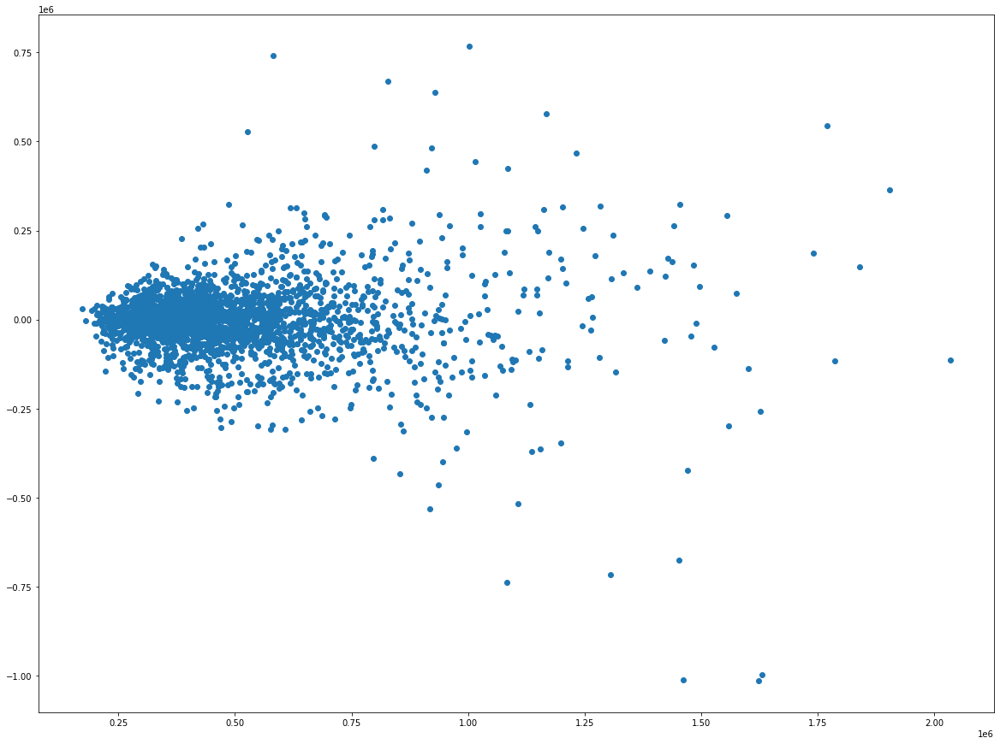

R2:  79.16 
MAE:  63971.02 
RMSE:  104935.12 
285 predictors used for this model


In [ ]:
# setting up estimator with our optimal parameters
params = {'kernel' : 'rbf', 'C' : 10, 'epsilon' : .05, 'gamma':'auto'}
svr = SVR(**params, verbose=True, tol=.005)

make_model_log(svr, X_train_onehot, X_test_onehot, y_train, y_test, 'SVR')

## XGBoost

We're now going to work with some different model types that are entirely different from linear regression.

There's conflicting information on whether we should use one-hot encoding, or target encoding. We'll solve this by trying both and figuring out what works best for our data set.

### One Hot

We need to slightly redo our one-hot encodings to not drop the first entry. We'll also make year_built into total one-hot encodings rather than bins.

In [ ]:
# categoricals with first not dropped for tree
boost_train_cats = pd.get_dummies(df_categoricals[high_one_hot_cat], prefix=high_one_hot_cat, drop_first=False)
boost_test_cats= pd.get_dummies(holdout_categoricals[high_one_hot_cat], prefix=high_one_hot_cat, drop_first=False)

# continuous not transformed or standardized
boost_train_continuous = x_continuous[high_one_hot_cont]
boost_holdout_continuous = holdout_continuous[high_one_hot_cont]

# decision tree regression train and test sets
x_train_boost = pd.concat([boost_train_continuous, boost_train_cats, train_word_vectors_refined], axis=1)
x_test_boost = pd.concat([boost_holdout_continuous, boost_test_cats, holdout_word_vectors_refined], axis=1)

# redoing our y_train and y_test as non-log transformed
y = df[target] # our target variable

# creating our train/validation sets and our test sets
y_train, y_test = train_test_split(y, test_size=0.2, random_state=randomstate)


This model is entirely different than linear regression. Gradient boosting uses decision trees to learn about outcomes, with trees being added to the model one at a time and existing trees in the model are not changed. Each successive tree tries to improve upon the predictions of the first one, with the weights of the various decision points being updated each time. Gradient boosting uses the residuals to improve its next tree prediction. Overall much more opaque of a process than linear regression.

Gradient Boosting performs best with optimal parameter tuning. We're going to use sklearn's GridSearchCV to find the optimal hyperparameters to use with our gradient booster! Here are the parameters we are trying out:

* n_estimators: Number of boosts to perform. Gradient boosting is pretty robust to over-fitting so more is usually better
* max_depth: This determines how many tree nodes the estimator looks at before making a prediction. We don't know what is best here, so we are trying things from 2-4 to see what works the best
* min_child_weight: Min sum of instance weight needed in a child
* gamma: Minimum loss reduction to make another partition on a leaf node. Higher results in more conservative algorithm.
* subsample: Ratio of training sets. .5 means that it will sample half the training data before making trees. Occurs with each boosting iteration.
* colsample_by_tree: ratio of columns when making a tree
* alpha: L1 regularization. Higher will make model more conservative.
* learning_rate: Tuning this setting alters how much the model corrects after it runs a boost. .1 is a common rate and we will test a lower and higher rate as well.

Our parameter tuning for XGBoost is in the APPENDIX

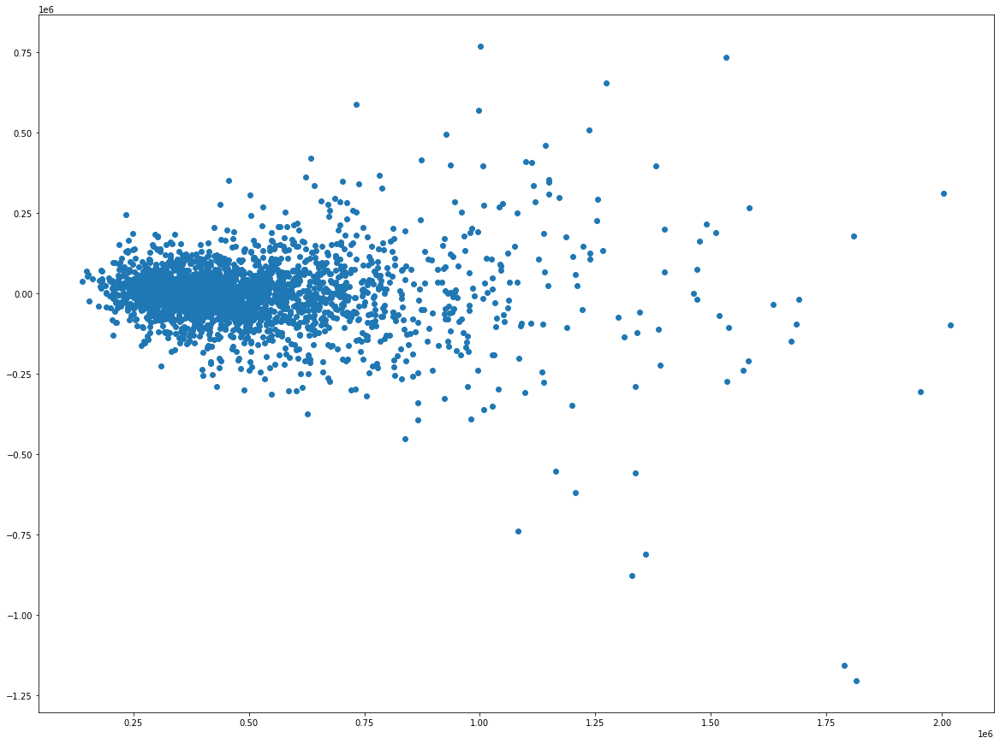

R2:  79.84 
MAE:  68528.25 
RMSE:  108696.28 
302 predictors used for this model


In [ ]:
best_xgb_model = xgb.XGBRegressor(
                n_estimators=500,
                max_depth=4,
                learning_rate = .2,
                min_child_weight=6,
                gamma=.005,
                colsample_bytree = .4,
                alpha=75,
                reg_lambda = 1,
                seed=42,
                missing=0,
                eval_metric='mae')

make_model_nolog(best_xgb_model, x_train_boost, x_test_boost, y_train, y_test, 'XGB - One-hot')

### Target Encoding

In [ ]:
# categoricals with first not dropped for tree
boost_train_cats = pd.get_dummies(df_categoricals[low_one_hot_cat], prefix=low_one_hot_cat, drop_first=False)
boost_test_cats= pd.get_dummies(holdout_categoricals[low_one_hot_cat], prefix=low_one_hot_cat, drop_first=False)

# continuous not transformed or standardized
boost_train_continuous = x_continuous[low_one_hot_cont]
boost_holdout_continuous = holdout_continuous[low_one_hot_cont]

# decision tree regression train and test sets
x_train_boost_encoded = pd.concat([boost_train_continuous, boost_train_cats, train_word_vectors_refined], axis=1)
x_test_boost_encoded = pd.concat([boost_holdout_continuous, boost_test_cats, holdout_word_vectors_refined], axis=1)

# redoing our y_train and y_test as non-log transformed
y = df[target] # our target variable

# creating our train/validation sets and our test sets
y_train, y_test = train_test_split(y, test_size=0.2, random_state=randomstate)

Our parameter tuning for XGBoost is in the APPENDIX

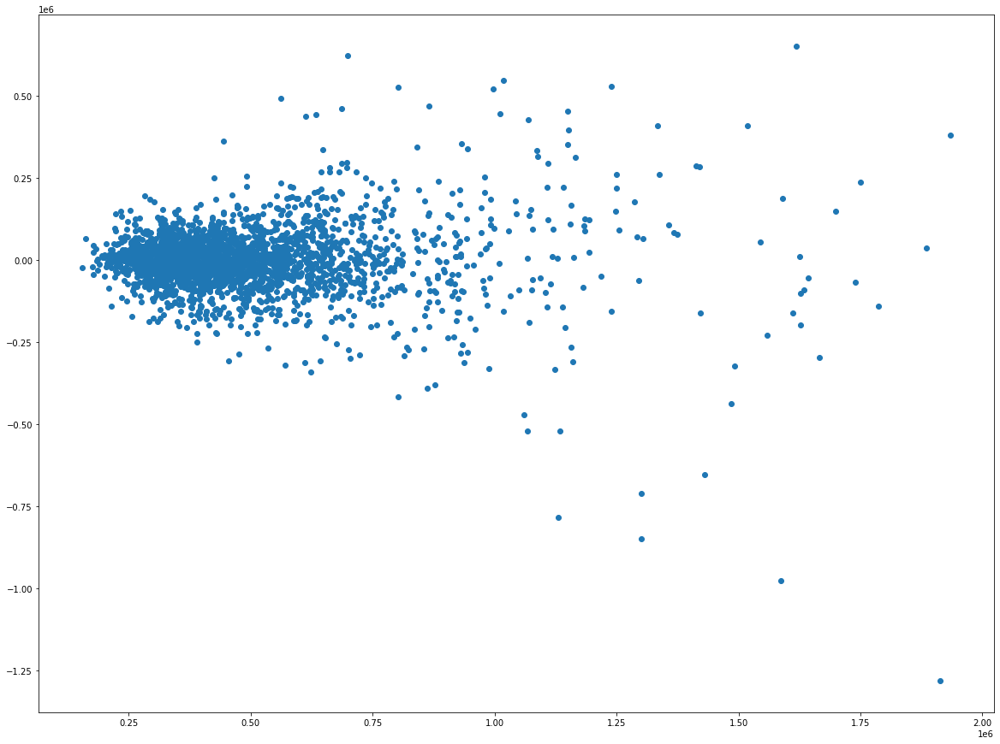

R2:  81.33 
MAE:  66776.46 
RMSE:  105886.4 
223 predictors used for this model


In [ ]:
best_xgb_model = xgb.XGBRegressor(
                n_estimators=500,
                max_depth=4,
                learning_rate = .1,
                min_child_weight=32,
                gamma=.01,
                colsample_bytree = .8,
                alpha=1,
                reg_lambda = 1,
                seed=42,
                missing=0,
                eval_metric='mae')

make_model_nolog(best_xgb_model, x_train_boost_encoded, x_test_boost_encoded, y_train, y_test, 'XGB - Encoded')

# Model Selection

We ran several different types of models, and logged the r^squared and mean absolute error for each model type. Which model performed the best for us?

In [ ]:
# make data frame from our models dictionary
model_types = pd.DataFrame(models)

# sort data frame by mae and reset index
model_types = model_types.sort_values('mae', ascending=True).reset_index()
model_types.drop('index',axis=1, inplace=True)
model_types.set_index('Models', inplace=True)

model_types

,r2,mae,rmse
Models,,,
SVR,7.916000e+01,63971.02,104935.12
XGB - Encoded,8.133000e+01,66776.46,105886.40
XGB - One-hot,7.984000e+01,68528.25,108696.28
Ridge,7.747000e+01,71298.55,111843.75
LR w/RFECV,7.746000e+01,71510.21,112359.40
LR All - One Hot,7.741000e+01,71513.72,112360.81
LR w/Forward-Backward Selector,7.716000e+01,71545.24,111757.54
LR w/Permutation Importance,7.679000e+01,73547.43,115514.83
Lasso,7.604000e+01,74124.95,116235.12


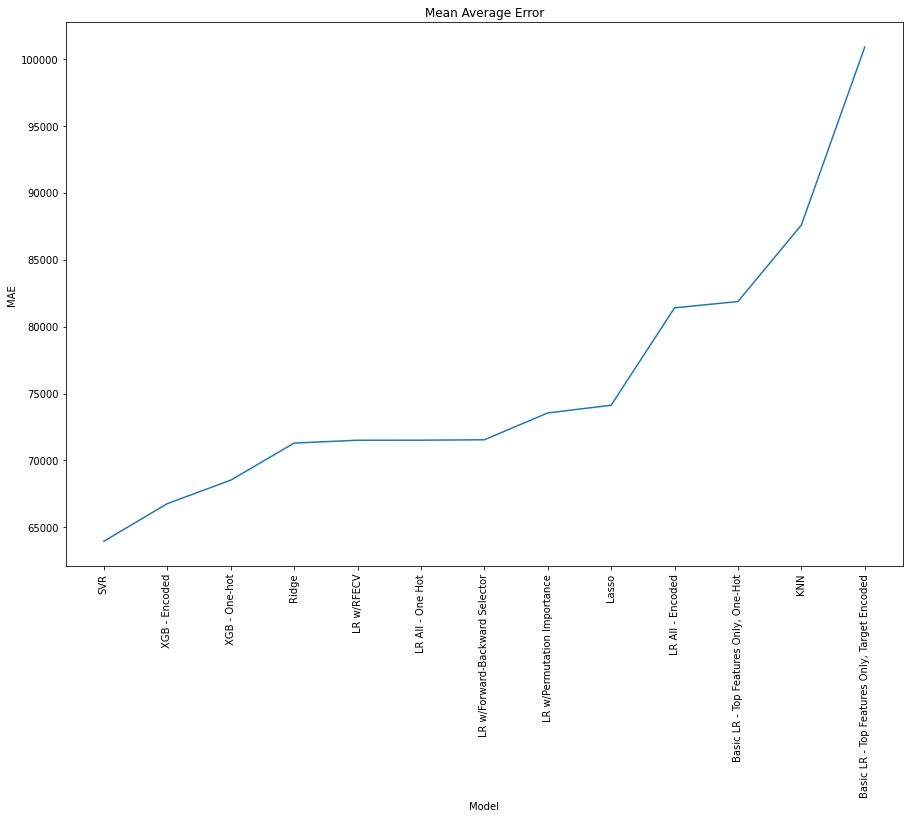

In [ ]:
# plot model mae

plt.figure(figsize=(15,10))
plt.plot(model_types['mae'])
plt.title("Mean Average Error")
plt.xticks(rotation=90)
plt.xlabel('Model')
plt.ylabel("MAE");

Ultimately we will select the sklearn SVM method for our model. Support Vector Machine's explicit goal to minimize absolute error coordinates nicely with price predictions.

## Analysis

> Our final model utilizes a combination of continuous variables and one-hot-encoded categoricals to produce a support vector machine regression with R^2 of 79.2%, a mean absolute error of 64k, and a root mean squared error of 105k. I tried several different zip code transformations including polynomial features, mean target encoding, lower-granularity binning, and median rank as a continuous, and ALL of these efforts resulted in a lower R^2 and higher mean absolute error, leading to a final decision to one-hot encode all zip codes individually. Similar efforts on other categoricals such as age and month sold also did not improve the model over one-hot encoding. This resulted in the greatest accuracy despite a model that is more "messy" with a large number of features.

### What are the primary factors influencing housing prices in the Austin metro area?

> Square footage is, unsurprisingly, a key player in house pricing. And as they say, location is everything, and it is the primary influencing factor for a home price in the Austin metro area. Number of bathrooms, school rating, and lot size all contributed a large amount as well.

> These five features alone explain 71% of the price variance.

### Can we effectively use a regression model based system for realtors to determine a proper list price?
> Our model, while explaining about 80% of the price variance with our features, was nonetheless far from accurate in absolute terms. A mean average error of 64k in either direction is a huge variance to a home price - one that is so large that it renders the prediction much less meaningful and useful. Other models need to be explored, better data needs to be sourced, or easy-to-use features that an average realtor is capable of evaluating/acquiring should be added to the model to improve its predictive quality. The model is providing at best a baseline starting point.

### What are the features missing?
> I believe this data set to be missing some key features that have high influence in other housing sets, foremost among them reasonable metrics of home condition, home quality, and neighborhood quality. We attempted to pick up some of the quality and condition metrics via NLP. While the NLP did contribute a significant amount of improvement to the model, it was insufficient to explain all of these missing metrics.


# Visualizations

## Feature Visualizations

In [ ]:
# refresh on our original data frame
df

,price,zpid,city,streetAddress,zipcode,description,latitude,longitude,propertyTaxRate,garageSpaces,hasAssociation,hasCooling,hasGarage,hasHeating,hasSpa,hasView,homeType,parkingSpaces,yearBuilt,orig_price,numPriceChanges,latest_saledate,latest_salemonth,latest_saleyear,latestPriceSource,numOfPhotos,accessibility,numOfAppliances,numOfParkingFeatures,patioporch,security,waterfront,windowfeatures,community,lotSizeSqFt,livingAreaSqFt,numOfPrimarySchools,numOfElementarySchools,numOfMiddleSchools,numOfHighSchools,avgSchoolDistance,avgSchoolRating,avgSchoolSize,MedianStudentsPerTeacher,numOfBathrooms,numOfBedrooms,numOfStories,homeImage,time_series,zip_rank,median_zip,pr_sqft,sentences
0,328625.0,111373431,pflugerville,14424 Lake Victor Dr,78660,"14424 Lake Victor Dr, Pflugerville, TX 78660 i...",30.430632,-97.663078,1.98,2,1,1,1,1,0,0,Single Family,2,2012,305000.0,5,2019-09-02,9,2019,"Coldwell Banker United, Realtors - South Austin",39,0,5,2,1,1,0,1,0,6011.0,2601.0,1,0,1,1,1.266667,2.666667,1063,14,3.0,4,2,111373431_ffce26843283d3365c11d81b8e6bdc6f-p_f...,4,8,325080.0,126.0,DEFAULT
1,309233.0,120900430,pflugerville,1104 Strickling Dr,78660,Absolutely GORGEOUS 4 Bedroom home with 2 full...,30.432673,-97.661697,1.98,2,1,1,1,1,0,0,Single Family,2,2013,295000.0,1,2020-10-13,10,2020,Agent Provided,29,0,1,2,0,0,0,0,0,6185.0,1768.0,1,0,1,1,1.400000,2.666667,1063,14,2.0,4,1,120900430_8255c127be8dcf0a1a18b7563d987088-p_f...,3,8,325080.0,175.0,absolutely gorgeous locate tuck away communit...
2,286036.0,2084491383,pflugerville,1408 Fort Dessau Rd,78660,Under construction - estimated completion in A...,30.409748,-97.639771,1.98,0,1,1,0,1,0,0,Single Family,0,2018,256125.0,1,2019-07-31,7,2019,Agent Provided,2,0,4,1,0,1,0,0,0,7840.0,1478.0,0,2,1,1,1.200000,3.000000,1108,14,2.0,3,1,2084491383_a2ad649e1a7a098111dcea084a11c855-p_...,6,8,325080.0,194.0,construction estimate completion august pione...
3,265930.0,120901374,pflugerville,1025 Strickling Dr,78660,Absolutely darling one story home in charming ...,30.432112,-97.661659,1.98,2,1,1,1,1,0,0,Single Family,2,2013,240000.0,4,2018-08-08,8,2018,Agent Provided,9,0,0,2,0,0,0,0,0,6098.0,1678.0,1,0,1,1,1.400000,2.666667,1063,14,2.0,3,1,120901374_b469367a619da85b1f5ceb69b675d88e-p_f...,5,8,325080.0,158.0,absolutely darle charming book like lake nort...
4,255324.0,60134862,pflugerville,15005 Donna Jane Loop,78660,Brimming with appeal & warm livability! Sleek ...,30.437368,-97.656860,1.98,0,1,1,0,1,0,0,Single Family,0,2002,239900.0,3,2018-10-31,10,2018,Agent Provided,27,0,0,1,0,0,0,0,0,6708.0,2132.0,1,0,1,1,1.133333,4.000000,1223,14,3.0,3,2,60134862_b1a48a3df3f111e005bb913873e98ce2-p_f.jpg,3,8,325080.0,120.0,brim appeal warm livability sleek stylish mod...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13107,289006.0,29504086,austin,9013 Marsh Dr,78748,This 3 bedroom home is nestled among mature sh...,30.185915,-97.828415,1.98,2,0,1,1,1,1,0,Single Family,2,1983,280000.0,1,2020-11-24,11,2020,Agent Provided,63,0,3,2,1,1,0,0,0,8058.0,1420.0,1,0,1,1,2.133333,5.666667,1537,16,2.0,3,1,29504086_f55db59cbebad30d475f31e6aee0d020-p_f.jpg,2,9,345198.0,204.0,nestle mature shade tree locate establish nei...
13108,335307.0,29512934,austin,905 Silcantu Dr,78748,Not for rent!\n\nBeautiful one story home in T...,30.161997,-97.816345,1.98,3,0,1,1,1,0,1,Single Family,5,1986,330000.0,1,2020-12-10,12,2020,Agent Provided,49,0,3,2,1,0,0,0,0,6534.0,1234.0,1,0,1,1,0.900000,3.333333,1424,14,2.0,3,1,29512934_ff9b6eefa7e2eb4e9ef983da13a23098-p_f.jpg,1,9,345198.0,272.0,beautiful texas oaks huge covered patio neig...
13109,558845.0,241937773,austin,1413 Waterloo Shore Ln UNIT 12,78741,This contemporary three-story detached condo h...,30.240223,-97.772835,1.98,2,1,1,1,1,1,1,Single Family,2,2016,550000.0,1,2020-12-16,12,2020,Agent Provided,32,1,5,2,1,1,0,0,0,2439.0,1888.0,

In [ ]:
# get the columns we are going to make visualizations from
viz_df = df[['price', 'livingAreaSqFt', 'median_zip', 'zip_rank', 'avgSchoolRating']]
viz_df['pr_sf'] = round(viz_df['price']/viz_df['livingAreaSqFt'], 2)
viz_df

,price,livingAreaSqFt,median_zip,zip_rank,avgSchoolRating,pr_sf
0,328625.0,2601.0,325080.0,8,2.666667,126.35
1,309233.0,1768.0,325080.0,8,2.666667,174.91
2,286036.0,1478.0,325080.0,8,3.000000,193.53
3,265930.0,1678.0,325080.0,8,2.666667,158.48
4,255324.0,2132.0,325080.0,8,4.000000,119.76
...,...,...,...,...,...,...
13107,289006.0,1420.0,345198.0,9,5.666667,203.53
13108,335307.0,1234.0,345198.0,9,3.333333,271.72
13109,558845.0,1888.0,376937.0,12,6.666667,296.00
13110,875000.0,1524.0,780526.0,38,5.000000,574.15


In [ ]:
# make simpler variables for our visualiation variables
viz_target = viz_df['price']/100000
viz_sqft = viz_df['livingAreaSqFt']
viz_grade = viz_df['avgSchoolRating']
viz_zip = viz_df['zip_rank']
viz_zip2 = viz_df['median_zip']
viz_pr_sf = viz_df['pr_sf']

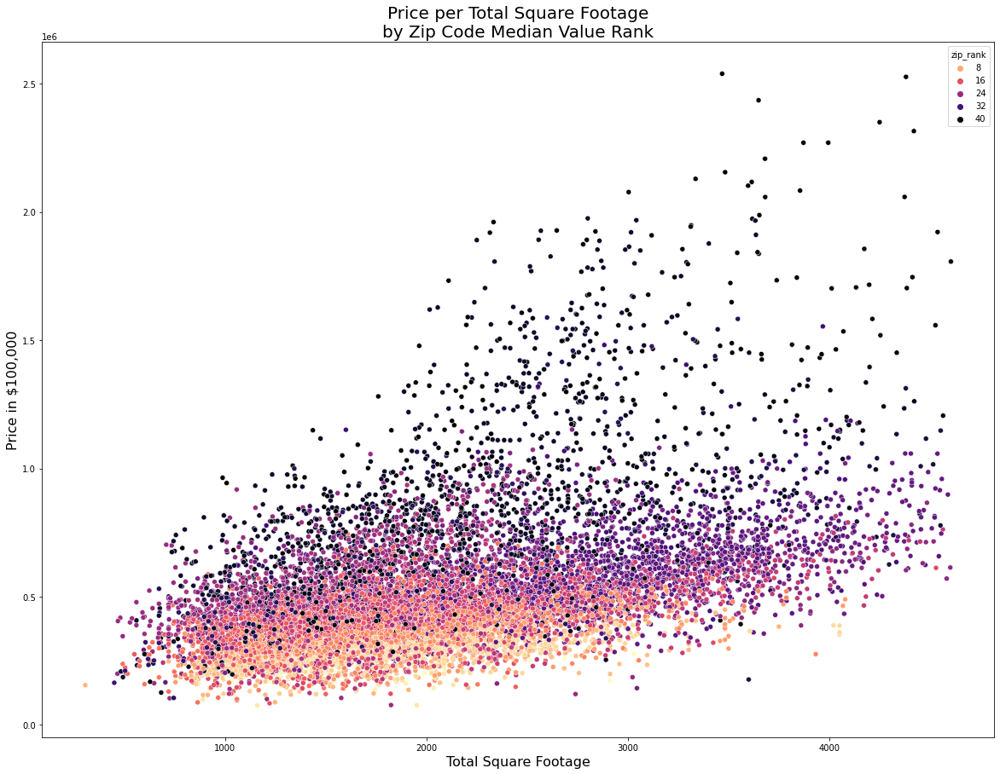

In [ ]:
# prepare figure
fig, ax = plt.subplots(figsize=(20, 15))

#scatter our data
scatter3 = sns.scatterplot(x=viz_sqft, y="price", data=viz_df, hue='zip_rank', palette='magma_r')
#ax.scatter(viz_sqft, viz_target, c=viz_zip, cmap='magma_r')

# label our axes and title
ax.set_xlabel('Total Square Footage', fontsize=16)
ax.set_ylabel('Price in $100,000', fontsize=16)
ax.set_title("Price per Total Square Footage\nby Zip Code Median Value Rank", fontsize=20);

# save visualization to png
#plt.savefig('images/sqft.png');

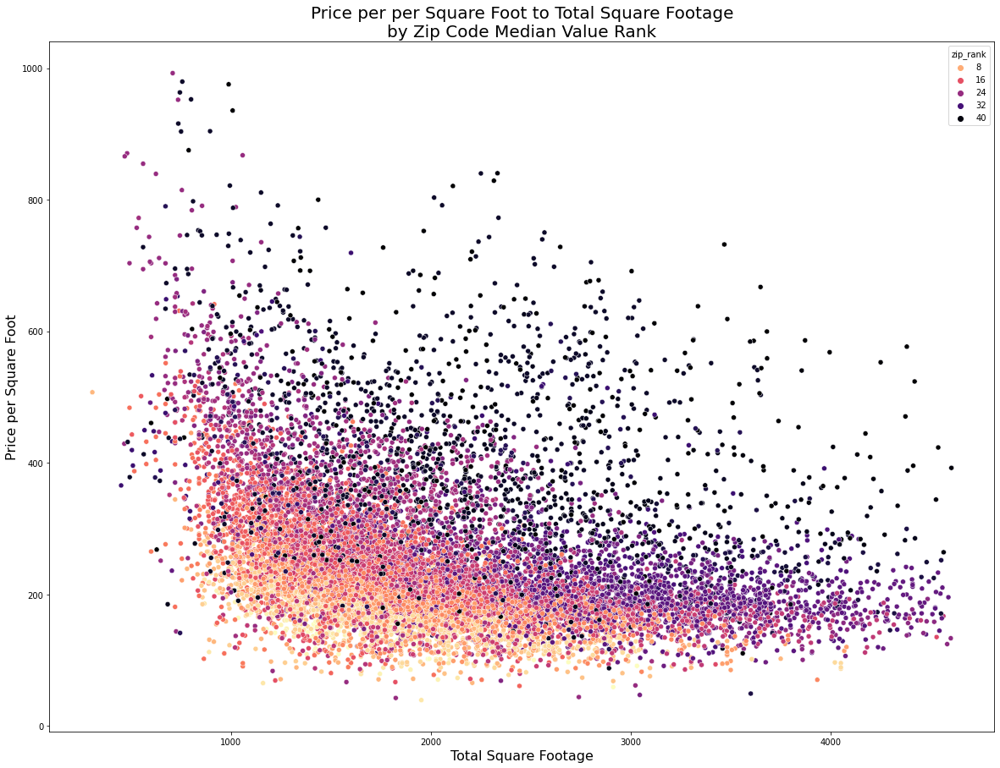

In [ ]:
# prepare figure
fig, ax = plt.subplots(figsize=(20, 15))

#scatter our data
scatter3 = sns.scatterplot(x=viz_sqft, y="pr_sf", data=viz_df, hue='zip_rank', palette='magma_r')
#ax.scatter(viz_sqft, viz_target, c=viz_zip, cmap='magma_r')

# label our axes and title
ax.set_xlabel('Total Square Footage', fontsize=16)
ax.set_ylabel('Price per Square Foot', fontsize=16)
ax.set_title("Price per per Square Foot to Total Square Footage\nby Zip Code Median Value Rank", fontsize=20);

# save visualization to png
#plt.savefig('images/pr_sf_zip.png');

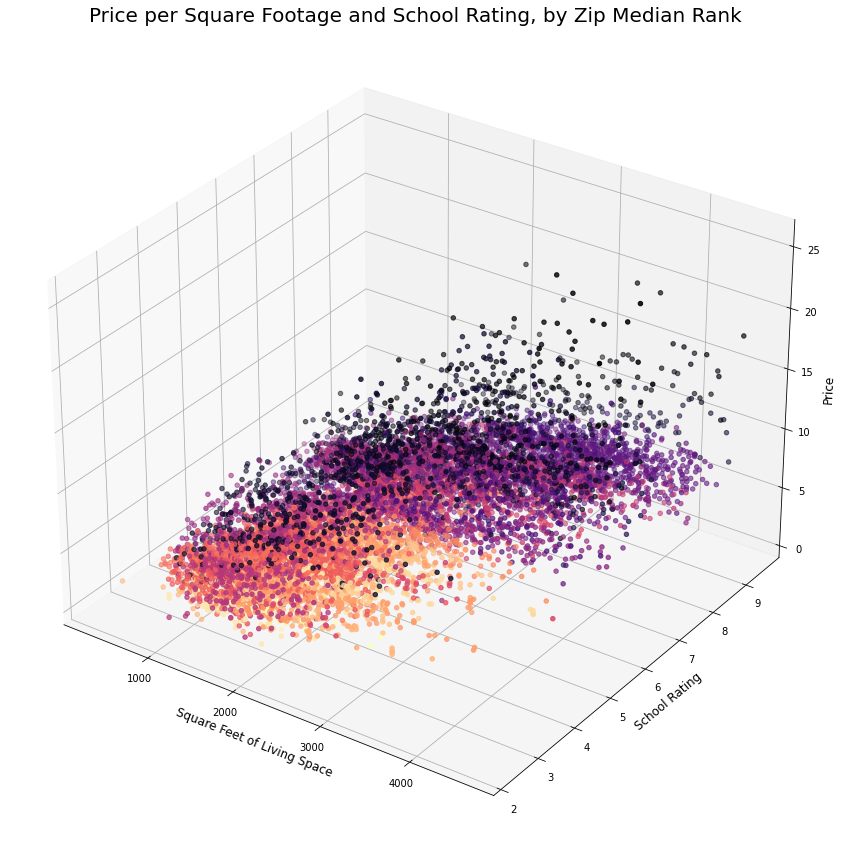

In [ ]:
viz_y = viz_df['price']
viz_x = viz_df.drop('price', axis=1)

fig = plt.figure(figsize=(20,15))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(viz_sqft, viz_grade, viz_target, c=viz_zip, cmap='magma_r')
#ax.scatter(viz_sqft, viz_grade, viz_target, c='red', label="Predictions")
#ax.scatter(viz_sqft, viz_grade, end_z/100000, c='green', label="Actuals")

ax.set_xlabel('Square Feet of Living Space', fontsize=12)
ax.set_ylabel('School Rating', fontsize=12)
ax.set_zlabel('Price', fontsize=12)

ax.set_title("Price per Square Footage and School Rating, by Zip Median Rank", fontsize=20)

# first num is tilt angle, second num is turn angle
# default is about 30,305
# 0, 270 creates side view of pr/sqft
# 0, 360 creates side view of pr/grade
ax.view_init(30, 305)


# save visualization to png
#plt.savefig('images/3d_feats.png');

In [ ]:
break

SyntaxError: 'break' outside loop (<ipython-input-168-6aaf1f276005>, line 4)

# APPENDIX

## XGBoost - One Hot Tuning

In [ ]:
# visualize changes to model score as it is tried on different max depths from 10 to 80, to get a starting point for max depth

from sklearn.model_selection import validation_curve
def ValidationCurve(estimator, predictors, target, param_name, hyperparam):

    train_score, test_score = validation_curve(estimator, predictors, target,
                                               param_name, np.arange(1,20,2),
                                               cv=5, scoring='r2', n_jobs=-4)
    Rsqaured_train = train_score.mean(axis=1)
    Rsquared_test= test_score.mean(axis=1)

    plt.figure(figsize=(10,5))
    plt.plot(np.arange(1,20,2), Rsqaured_train, color='r', linestyle='-', marker='o', label='Training Set')
    plt.plot(np.arange(1,20,2), Rsquared_test, color='b', linestyle='-', marker='x', label='Testing Set')
    plt.legend(labels=['Training Set', 'Testing Set'])
    plt.xlabel(hyperparam)
    plt.ylabel('R_squared')
    plt.title("R^squared for Max Depth on Train/Test")

ValidationCurve(xgb.XGBRegressor(), x_train_boost, y_train, 'max_depth', 'Maximum Depth')

In [ ]:
# Parameter Tuning max_depth

param_grid = {"max_depth": [4,5,6,]

              }

model = xgb.XGBRegressor(
                 n_estimators=250,
                 seed=42,
                 missing=0,
                 eval_metric='mae' )

grid_search = GridSearchCV(model, param_grid=param_grid, cv = 5,
                                   verbose=10, n_jobs=-4)
grid_search.fit(x_train_boost, y_train)

grid_search.best_estimator_

print("Best parameters set found on train set: \n")
print(grid_search.best_params_)
print("\nGrid scores on train set:\n")
means = grid_search.cv_results_['mean_test_score']
stds = grid_search.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, grid_search.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r"
              % (mean, std * 2, params))

Best parameters set found on train set:

    {'max_depth': 4}

    Grid scores on train set:

    0.786 (+/-0.019) for {'max_depth': 4}
    0.785 (+/-0.020) for {'max_depth': 5}
    0.785 (+/-0.021) for {'max_depth': 6}

In [ ]:
# Parameter Tuning learning_rate

param_grid = {"learning_rate" : [.005, .01, .05, .1, .2, .3, .5]

              }

model = xgb.XGBRegressor(
                 n_estimators=250,
                 max_depth=4,
                 seed=42,
                 missing=0,
                 eval_metric='mae' )

grid_search = GridSearchCV(model, param_grid=param_grid, cv = 5,
                                   verbose=10, n_jobs=-4)
grid_search.fit(x_train_boost, y_train)

grid_search.best_estimator_

print("Best parameters set found on train set: \n")
print(grid_search.best_params_)
print("\nGrid scores on train set:\n")
means = grid_search.cv_results_['mean_test_score']
stds = grid_search.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, grid_search.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r"
              % (mean, std * 2, params))

Best parameters set found on train set:

    {'learning_rate': 0.2}

    Grid scores on train set:

    0.337 (+/-0.030) for {'learning_rate': 0.005}
    0.714 (+/-0.029) for {'learning_rate': 0.01}
    0.793 (+/-0.032) for {'learning_rate': 0.05}
    0.800 (+/-0.029) for {'learning_rate': 0.1}
    0.800 (+/-0.034) for {'learning_rate': 0.2}
    0.792 (+/-0.030) for {'learning_rate': 0.3}
    0.779 (+/-0.037) for {'learning_rate': 0.5}

In [ ]:
# Parameter Tuning max_depth and min_child_weight

param_grid = {"min_child_weight" : [6, 8, 10]
              }

model = xgb.XGBRegressor(
                 n_estimators=250,
                learning_rate = .2,
                 max_depth=4,
                 seed=42,
                 missing=0,
                 eval_metric='mae' )

grid_search = GridSearchCV(model, param_grid=param_grid, cv = 5,
                                   verbose=10, n_jobs=-1)
grid_search.fit(x_train_boost, y_train)

grid_search.best_estimator_

print("Best parameters set found on train set: \n")
print(grid_search.best_params_)
print("\nGrid scores on train set:\n")
means = grid_search.cv_results_['mean_test_score']
stds = grid_search.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, grid_search.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r"
              % (mean, std * 2, params))

Best parameters set found on train set:

    {'min_child_weight': 6}

    Grid scores on train set:

    0.805 (+/-0.026) for {'min_child_weight': 6}
    0.804 (+/-0.025) for {'min_child_weight': 8}
    0.805 (+/-0.027) for {'min_child_weight': 10}

In [ ]:
# Parameter Tuning max_depth and min_child_weight

param_grid = {"min_child_weight" : [3, 4, 5, 6, 7]
              }

model = xgb.XGBRegressor(
                 n_estimators=250,
                learning_rate = .2,
                 max_depth=4,
                 seed=42,
                 missing=0,
                 eval_metric='mae' )

grid_search = GridSearchCV(model, param_grid=param_grid, cv = 5,
                                   verbose=10, n_jobs=-1)
grid_search.fit(x_train_boost, y_train)

grid_search.best_estimator_

print("Best parameters set found on train set: \n")
print(grid_search.best_params_)
print("\nGrid scores on train set:\n")
means = grid_search.cv_results_['mean_test_score']
stds = grid_search.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, grid_search.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r"
              % (mean, std * 2, params))

Best parameters set found on train set:

    {'min_child_weight': 6}

    Grid scores on train set:

    0.803 (+/-0.034) for {'min_child_weight': 3}
    0.801 (+/-0.030) for {'min_child_weight': 4}
    0.801 (+/-0.029) for {'min_child_weight': 5}
    0.805 (+/-0.026) for {'min_child_weight': 6}
    0.803 (+/-0.025) for {'min_child_weight': 7}

In [ ]:
# Parameter Tuning gamma

param_grid = {'gamma':[.005, .01, .05, .1, .3, .5, 1]
              }

model = xgb.XGBRegressor(
                n_estimators=250,
                max_depth=4,
                learning_rate = .2,
                min_child_weight=6,
                seed=42,
                missing=0,
                eval_metric='mae' )

grid_search = GridSearchCV(model, param_grid=param_grid, cv = 5,
                                   verbose=10, n_jobs=-1)
grid_search.fit(x_train_boost, y_train)

grid_search.best_estimator_

print("Best parameters set found on train set: \n")
print(grid_search.best_params_)
print("\nGrid scores on train set:\n")
means = grid_search.cv_results_['mean_test_score']
stds = grid_search.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, grid_search.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r"
              % (mean, std * 2, params))

Best parameters set found on train set:

    {'gamma': 0.005}

    Grid scores on train set:

    0.805 (+/-0.026) for {'gamma': 0.005}
    0.805 (+/-0.026) for {'gamma': 0.01}
    0.805 (+/-0.026) for {'gamma': 0.05}
    0.805 (+/-0.026) for {'gamma': 0.1}
    0.805 (+/-0.026) for {'gamma': 0.3}
    0.805 (+/-0.026) for {'gamma': 0.5}
    0.805 (+/-0.026) for {'gamma': 1}

In [ ]:
# Parameter Tuning subsample

param_grid = {
 'subsample':[.2, .4, .6, .8, 1],

    }

model = xgb.XGBRegressor(
                n_estimators=250,
                max_depth=4,
                learning_rate = .2,
                min_child_weight=6,
                gamma=.005,
                seed=42,
                missing=0,
                eval_metric='mae' )

grid_search = GridSearchCV(model, param_grid=param_grid, cv = 5,
                                   verbose=10, n_jobs=-1)
grid_search.fit(x_train_boost, y_train)

grid_search.best_estimator_

print("Best parameters set found on train set: \n")
print(grid_search.best_params_)
print("\nGrid scores on train set:\n")
means = grid_search.cv_results_['mean_test_score']
stds = grid_search.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, grid_search.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r"
              % (mean, std * 2, params))

Best parameters set found on train set:

    {'subsample': 1}

    Grid scores on train set:

    0.763 (+/-0.037) for {'subsample': 0.2}
    0.778 (+/-0.034) for {'subsample': 0.4}
    0.790 (+/-0.039) for {'subsample': 0.6}
    0.798 (+/-0.024) for {'subsample': 0.8}
    0.805 (+/-0.026) for {'subsample': 1}

In [ ]:
# Parameter Tuning colsample_by_tree

param_grid = {
 'colsample_bytree':[.2, .4, .6, .8, 1]
    }

model = xgb.XGBRegressor(
                n_estimators=250,
                max_depth=4,
                learning_rate = .2,
                min_child_weight=6,
                gamma=.005,
                seed=42,
                missing=0,
                eval_metric='mae' )

grid_search = GridSearchCV(model, param_grid=param_grid, cv = 5,
                                   verbose=10, n_jobs=-1)
grid_search.fit(x_train_boost, y_train)

grid_search.best_estimator_

print("Best parameters set found on train set: \n")
print(grid_search.best_params_)
print("\nGrid scores on train set:\n")
means = grid_search.cv_results_['mean_test_score']
stds = grid_search.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, grid_search.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r"
              % (mean, std * 2, params))

Best parameters set found on train set:

    {'colsample_bytree': 0.4}

    Grid scores on train set:

    0.794 (+/-0.015) for {'colsample_bytree': 0.2}
    0.806 (+/-0.021) for {'colsample_bytree': 0.4}
    0.800 (+/-0.026) for {'colsample_bytree': 0.6}
    0.798 (+/-0.032) for {'colsample_bytree': 0.8}
    0.805 (+/-0.026) for {'colsample_bytree': 1}

In [ ]:
# Parameter Tuning alpha

param_grid = {
    'reg_alpha':[0.1, 1, 10, 100, 250, 500]
    }

model = xgb.XGBRegressor(
                n_estimators=250,
                max_depth=4,
                learning_rate = .2,
                min_child_weight=6,
                gamma=.005,
                colsample_bytree = .4,
                seed=42,
                missing=0,
                eval_metric='mae' )

grid_search = GridSearchCV(model, param_grid=param_grid, cv = 5,
                                   verbose=10, n_jobs=-1)
grid_search.fit(x_train_boost, y_train)

grid_search.best_estimator_

print("Best parameters set found on train set: \n")
print(grid_search.best_params_)
print("\nGrid scores on train set:\n")
means = grid_search.cv_results_['mean_test_score']
stds = grid_search.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, grid_search.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r"
              % (mean, std * 2, params))

Best parameters set found on train set:

    {'reg_alpha': 100}

    Grid scores on train set:

    0.806 (+/-0.021) for {'reg_alpha': 0.1}
    0.806 (+/-0.021) for {'reg_alpha': 1}
    0.806 (+/-0.021) for {'reg_alpha': 10}
    0.806 (+/-0.022) for {'reg_alpha': 100}
    0.804 (+/-0.020) for {'reg_alpha': 250}
    0.803 (+/-0.019) for {'reg_alpha': 500}

In [ ]:
# Parameter Tuning alpha

param_grid = {
    'reg_alpha':[50, 75, 100, 125, 150]
    }

model = xgb.XGBRegressor(
                n_estimators=250,
                max_depth=4,
                learning_rate = .2,
                min_child_weight=6,
                gamma=.005,
                colsample_bytree = .4,
                seed=42,
                missing=0,
                eval_metric='mae' )

grid_search = GridSearchCV(model, param_grid=param_grid, cv = 5,
                                   verbose=10, n_jobs=-1)
grid_search.fit(x_train_boost, y_train)

grid_search.best_estimator_

print("Best parameters set found on train set: \n")
print(grid_search.best_params_)
print("\nGrid scores on train set:\n")
means = grid_search.cv_results_['mean_test_score']
stds = grid_search.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, grid_search.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r"
              % (mean, std * 2, params))

Best parameters set found on train set:

    {'reg_alpha': 75}

    Grid scores on train set:

    0.806 (+/-0.022) for {'reg_alpha': 50}
    0.806 (+/-0.022) for {'reg_alpha': 75}
    0.806 (+/-0.022) for {'reg_alpha': 100}
    0.806 (+/-0.022) for {'reg_alpha': 125}
    0.806 (+/-0.022) for {'reg_alpha': 150}

In [ ]:
# Parameter Tuning lambda

param_grid = {'lambda':[0.1, 1, 10, 100, 500, 1000, 2500]
              }

model = xgb.XGBRegressor(
                n_estimators=250,
                max_depth=4,
                learning_rate = .2,
                min_child_weight=6,
                gamma=.005,
                colsample_bytree = .4,
                alpha=75,
                seed=42,
                missing=0,
                eval_metric='mae' )

grid_search = GridSearchCV(model, param_grid=param_grid, cv = 5,
                                   verbose=10, n_jobs=-1)
grid_search.fit(x_train_boost, y_train)

grid_search.best_estimator_

print("Best parameters set found on train set: \n")
print(grid_search.best_params_)
print("\nGrid scores on train set:\n")
means = grid_search.cv_results_['mean_test_score']
stds = grid_search.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, grid_search.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r"
              % (mean, std * 2, params))

Best parameters set found on train set:

    {'lambda': 1}

    Grid scores on train set:

    0.801 (+/-0.022) for {'lambda': 0.1}
    0.806 (+/-0.022) for {'lambda': 1}
    0.803 (+/-0.022) for {'lambda': 10}
    0.801 (+/-0.025) for {'lambda': 100}
    0.791 (+/-0.024) for {'lambda': 500}
    0.787 (+/-0.025) for {'lambda': 1000}
    0.769 (+/-0.023) for {'lambda': 2500}

In [ ]:
# Parameter Tuning num_estimators

param_grid = {'n_estimators':[250, 500, 1000, 5000]
              }

model = xgb.XGBRegressor(
                n_estimators=250,
                max_depth=4,
                learning_rate = .2,
                min_child_weight=6,
                gamma=.005,
                colsample_bytree = .4,
                alpha=75,
                reg_lambda = 1,
                seed=42,
                missing=0,
                eval_metric='mae')

grid_search = GridSearchCV(model, param_grid=param_grid, cv = 5,
                                   verbose=10, n_jobs=-1)
grid_search.fit(x_train_boost, y_train)

grid_search.best_estimator_

print("Best parameters set found on train set: \n")
print(grid_search.best_params_)
print("\nGrid scores on train set:\n")
means = grid_search.cv_results_['mean_test_score']
stds = grid_search.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, grid_search.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r"
              % (mean, std * 2, params))

Best parameters set found on train set:

    {'n_estimators': 500}

    Grid scores on train set:

    0.806 (+/-0.022) for {'n_estimators': 250}
    0.807 (+/-0.022) for {'n_estimators': 500}
    0.804 (+/-0.022) for {'n_estimators': 1000}
    0.799 (+/-0.018) for {'n_estimators': 5000}

## XGBoost - Target Encoded Tuning

In [ ]:
# visualize changes to model score as it is tried on different max depths from 10 to 80, to get a starting point for max depth

from sklearn.model_selection import validation_curve
def ValidationCurve(estimator, predictors, target, param_name, hyperparam):

    train_score, test_score = validation_curve(estimator, predictors, target,
                                               param_name, np.arange(1,20,2),
                                               cv=5, scoring='r2', n_jobs=-4)
    Rsqaured_train = train_score.mean(axis=1)
    Rsquared_test= test_score.mean(axis=1)

    plt.figure(figsize=(10,5))
    plt.plot(np.arange(1,20,2), Rsqaured_train, color='r', linestyle='-', marker='o', label='Training Set')
    plt.plot(np.arange(1,20,2), Rsquared_test, color='b', linestyle='-', marker='x', label='Testing Set')
    plt.legend(labels=['Training Set', 'Testing Set'])
    plt.xlabel(hyperparam)
    plt.ylabel('R_squared')
    plt.title("R^squared for Max Depth on Train/Test")

ValidationCurve(xgb.XGBRegressor(), x_train_boost_encoded, y_train, 'max_depth', 'Maximum Depth')

In [ ]:
# Parameter Tuning max_depth

param_grid = {"max_depth": [3,4,5,6,]

              }

model = xgb.XGBRegressor(
                 n_estimators=250,
                 seed=42,
                 missing=0,
                 eval_metric='mae' )

grid_search = GridSearchCV(model, param_grid=param_grid, cv = 5,
                                   verbose=10, n_jobs=-4)
grid_search.fit(x_train_boost_encoded, y_train)

grid_search.best_estimator_

print("Best parameters set found on train set: \n")
print(grid_search.best_params_)
print("\nGrid scores on train set:\n")
means = grid_search.cv_results_['mean_test_score']
stds = grid_search.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, grid_search.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r"
              % (mean, std * 2, params))

Best parameters set found on train set:

    {'max_depth': 4}

    Grid scores on train set:

    0.798 (+/-0.037) for {'max_depth': 3}
    0.800 (+/-0.043) for {'max_depth': 4}
    0.792 (+/-0.046) for {'max_depth': 5}
    0.787 (+/-0.038) for {'max_depth': 6}

In [ ]:
# Parameter Tuning learning_rate

param_grid = {"learning_rate" : [.005, .01, .02, .03, .1, .2, .3]
              }

model = xgb.XGBRegressor(
                 n_estimators=250,
                 max_depth=4,
                 seed=42,
                 missing=0,
                 eval_metric='mae' )

grid_search = GridSearchCV(model, param_grid=param_grid, cv = 5,
                                   verbose=10, n_jobs=-1)
grid_search.fit(x_train_boost_encoded, y_train)

grid_search.best_estimator_

print("Best parameters set found on train set: \n")
print(grid_search.best_params_)
print("\nGrid scores on train set:\n")
means = grid_search.cv_results_['mean_test_score']
stds = grid_search.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, grid_search.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r"
              % (mean, std * 2, params))

Best parameters set found on train set:

    {'learning_rate': 0.1}

    Grid scores on train set:

    0.342 (+/-0.026) for {'learning_rate': 0.005}
    0.724 (+/-0.027) for {'learning_rate': 0.01}
    0.783 (+/-0.035) for {'learning_rate': 0.02}
    0.792 (+/-0.036) for {'learning_rate': 0.03}
    0.807 (+/-0.035) for {'learning_rate': 0.1}
    0.806 (+/-0.042) for {'learning_rate': 0.2}
    0.800 (+/-0.043) for {'learning_rate': 0.3}

In [ ]:
# Parameter Tuning min_child_weight

param_grid = {"min_child_weight" : [4, 8, 12, 16, 20, 24, 28]
              }

model = xgb.XGBRegressor(
                 n_estimators=250,
                 max_depth=4,
                learning_rate = .1,
                 seed=42,
                 missing=0,
                 eval_metric='mae' )

grid_search = GridSearchCV(model, param_grid=param_grid, cv = 5,
                                   verbose=10, n_jobs=-1)
grid_search.fit(x_train_boost_encoded, y_train)

grid_search.best_estimator_

print("Best parameters set found on train set: \n")
print(grid_search.best_params_)
print("\nGrid scores on train set:\n")
means = grid_search.cv_results_['mean_test_score']
stds = grid_search.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, grid_search.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r"
              % (mean, std * 2, params))

Best parameters set found on train set:

    {'min_child_weight': 28}

    Grid scores on train set:

    0.807 (+/-0.037) for {'min_child_weight': 4}
    0.807 (+/-0.030) for {'min_child_weight': 8}
    0.808 (+/-0.031) for {'min_child_weight': 12}
    0.808 (+/-0.029) for {'min_child_weight': 16}
    0.809 (+/-0.028) for {'min_child_weight': 20}
    0.808 (+/-0.028) for {'min_child_weight': 24}
    0.810 (+/-0.032) for {'min_child_weight': 28}

In [ ]:
# Parameter Tuning max_depth and min_child_weight

param_grid = {"min_child_weight" : [28, 32, 36]
              }

model = xgb.XGBRegressor(
                 n_estimators=250,
                 max_depth=4,
                learning_rate = .1,
                 seed=42,
                 missing=0,
                 eval_metric='mae' )

grid_search = GridSearchCV(model, param_grid=param_grid, cv = 5,
                                   verbose=10, n_jobs=-1)
grid_search.fit(x_train_boost_encoded, y_train)

grid_search.best_estimator_

print("Best parameters set found on train set: \n")
print(grid_search.best_params_)
print("\nGrid scores on train set:\n")
means = grid_search.cv_results_['mean_test_score']
stds = grid_search.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, grid_search.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r"
              % (mean, std * 2, params))

Best parameters set found on train set:

    {'min_child_weight': 32}

    Grid scores on train set:

    0.810 (+/-0.032) for {'min_child_weight': 28}
    0.811 (+/-0.029) for {'min_child_weight': 32}
    0.811 (+/-0.030) for {'min_child_weight': 36}

In [ ]:
# Parameter Tuning gamma

param_grid = {'gamma':[.01, .05, .1, .3, .5, .7, .9]
              }

model = xgb.XGBRegressor(
                n_estimators=250,
                max_depth=4,
                learning_rate = .1,
                min_child_weight=32,
                seed=42,
                missing=0,
                eval_metric='mae' )

grid_search = GridSearchCV(model, param_grid=param_grid, cv = 5,
                                   verbose=10, n_jobs=-1)
grid_search.fit(x_train_boost_encoded, y_train)

grid_search.best_estimator_

print("Best parameters set found on train set: \n")
print(grid_search.best_params_)
print("\nGrid scores on train set:\n")
means = grid_search.cv_results_['mean_test_score']
stds = grid_search.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, grid_search.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r"
              % (mean, std * 2, params))

Best parameters set found on train set:

    {'gamma': 0.01}

    Grid scores on train set:
    
    0.811 (+/-0.029) for {'gamma': 0.01}
    0.811 (+/-0.029) for {'gamma': 0.05}
    0.811 (+/-0.029) for {'gamma': 0.1}
    0.811 (+/-0.029) for {'gamma': 0.3}
    0.811 (+/-0.029) for {'gamma': 0.5}
    0.811 (+/-0.029) for {'gamma': 0.7}
    0.811 (+/-0.029) for {'gamma': 0.9}

In [ ]:
# Parameter Tuning subsample

param_grid = {
 'subsample':[.2, .4, .6, .8, 1],

    }

model = xgb.XGBRegressor(
                n_estimators=250,
                max_depth=4,
                learning_rate = .1,
                min_child_weight=32,
                gamma=.01,
                seed=42,
                missing=0,
                eval_metric='mae' )

grid_search = GridSearchCV(model, param_grid=param_grid, cv = 5,
                                   verbose=10, n_jobs=-1)
grid_search.fit(x_train_boost_encoded, y_train)

grid_search.best_estimator_

print("Best parameters set found on train set: \n")
print(grid_search.best_params_)
print("\nGrid scores on train set:\n")
means = grid_search.cv_results_['mean_test_score']
stds = grid_search.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, grid_search.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r"
              % (mean, std * 2, params))

Best parameters set found on train set:

    {'subsample': 1}

    Grid scores on train set:

    0.792 (+/-0.032) for {'subsample': 0.2}
    0.802 (+/-0.032) for {'subsample': 0.4}
    0.804 (+/-0.033) for {'subsample': 0.6}
    0.808 (+/-0.033) for {'subsample': 0.8}
    0.811 (+/-0.029) for {'subsample': 1}

In [ ]:
# Parameter Tuning colsample_by_tree

param_grid = {
 'colsample_bytree':[.2, .4, .6, .8, 1]
    }

model = xgb.XGBRegressor(
                n_estimators=250,
                max_depth=4,
                learning_rate = .1,
                min_child_weight=32,
                gamma=.01,
                seed=42,
                missing=0,
                eval_metric='mae' )

grid_search = GridSearchCV(model, param_grid=param_grid, cv = 5,
                                   verbose=10, n_jobs=-1)
grid_search.fit(x_train_boost_encoded, y_train)

grid_search.best_estimator_

print("Best parameters set found on train set: \n")
print(grid_search.best_params_)
print("\nGrid scores on train set:\n")
means = grid_search.cv_results_['mean_test_score']
stds = grid_search.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, grid_search.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r"
              % (mean, std * 2, params))

Best parameters set found on train set:

    {'colsample_bytree': 0.8}

    Grid scores on train set:

    0.807 (+/-0.026) for {'colsample_bytree': 0.2}
    0.809 (+/-0.030) for {'colsample_bytree': 0.4}
    0.810 (+/-0.029) for {'colsample_bytree': 0.6}
    0.811 (+/-0.028) for {'colsample_bytree': 0.8}
    0.811 (+/-0.029) for {'colsample_bytree': 1}

In [ ]:
# Parameter Tuning alpha

param_grid = {
    'reg_alpha':[1e-5, 1e-2, 0.1, 1, 10, 100]
    }

model = xgb.XGBRegressor(
                n_estimators=250,
                max_depth=4,
                learning_rate = .1,
                min_child_weight=32,
                gamma=.01,
                colsample_bytree = .8,
                seed=42,
                missing=0,
                eval_metric='mae' )

grid_search = GridSearchCV(model, param_grid=param_grid, cv = 5,
                                   verbose=10, n_jobs=-1)
grid_search.fit(x_train_boost_encoded, y_train)

grid_search.best_estimator_

print("Best parameters set found on train set: \n")
print(grid_search.best_params_)
print("\nGrid scores on train set:\n")
means = grid_search.cv_results_['mean_test_score']
stds = grid_search.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, grid_search.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r"
              % (mean, std * 2, params))

Best parameters set found on train set:

    {'reg_alpha': 1}

    Grid scores on train set:

    0.811 (+/-0.028) for {'reg_alpha': 1e-05}
    0.811 (+/-0.028) for {'reg_alpha': 0.01}
    0.811 (+/-0.028) for {'reg_alpha': 0.1}
    0.811 (+/-0.028) for {'reg_alpha': 1}
    0.811 (+/-0.028) for {'reg_alpha': 10}
    0.810 (+/-0.028) for {'reg_alpha': 100}

In [ ]:
# Parameter Tuning lambda

param_grid = {'lambda':[0.1, 1, 10, 100, 250, 500, 1000, 2500]
              }

model = xgb.XGBRegressor(
                n_estimators=250,
                max_depth=4,
                learning_rate = .1,
                min_child_weight=32,
                gamma=.01,
                colsample_bytree = .8,
                alpha=1,
                seed=42,
                missing=0,
                eval_metric='mae' )

grid_search = GridSearchCV(model, param_grid=param_grid, cv = 5,
                                   verbose=10, n_jobs=-1)
grid_search.fit(x_train_boost_encoded, y_train)

grid_search.best_estimator_

print("Best parameters set found on train set: \n")
print(grid_search.best_params_)
print("\nGrid scores on train set:\n")
means = grid_search.cv_results_['mean_test_score']
stds = grid_search.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, grid_search.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r"
              % (mean, std * 2, params))

Best parameters set found on train set:

    {'lambda': 1}

    Grid scores on train set:

    0.809 (+/-0.028) for {'lambda': 0.1}
    0.811 (+/-0.028) for {'lambda': 1}
    0.808 (+/-0.028) for {'lambda': 10}
    0.803 (+/-0.030) for {'lambda': 100}
    0.800 (+/-0.028) for {'lambda': 250}
    0.793 (+/-0.028) for {'lambda': 500}
    0.784 (+/-0.024) for {'lambda': 1000}
    0.758 (+/-0.020) for {'lambda': 2500}

In [ ]:
# Parameter Tuning num_estimators

param_grid = {'n_estimators':[250, 500, 1000, 5000]
              }

model = xgb.XGBRegressor(
                n_estimators=250,
                max_depth=4,
                learning_rate = .1,
                min_child_weight=32,
                gamma=.01,
                colsample_bytree = .8,
                alpha=1,
                reg_lambda = 1,
                seed=42,
                missing=0,
                eval_metric='mae')

grid_search = GridSearchCV(model, param_grid=param_grid, cv = 5,
                                   verbose=10, n_jobs=-1)
grid_search.fit(x_train_boost_encoded, y_train)

grid_search.best_estimator_

print("Best parameters set found on train set: \n")
print(grid_search.best_params_)
print("\nGrid scores on train set:\n")
means = grid_search.cv_results_['mean_test_score']
stds = grid_search.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, grid_search.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r"
              % (mean, std * 2, params))

Best parameters set found on train set:

    {'n_estimators': 500}

    Grid scores on train set:

    0.808 (+/-0.020) for {'n_estimators': 250}
    0.811 (+/-0.022) for {'n_estimators': 500}
    0.810 (+/-0.025) for {'n_estimators': 1000}
    0.803 (+/-0.027) for {'n_estimators': 5000}